In [2]:
import pandas as pd
import numpy as np
import spacy
import json
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import seaborn as sns
import nltk
import ast
from nltk.tokenize import word_tokenize
from wordfreq import top_n_list
import scipy.stats as stats
import scikit_posthocs as sp
from sklearn.cluster import KMeans
import os
from scipy.stats import mannwhitneyu
from collections import Counter
from sklearn.metrics.pairwise import cosine_similarity
from scipy.spatial.distance import euclidean
import itertools
import re

/usr/local/jupyterhub/lib64/python3.10/site-packages/thinc/compat.py:36: UserWarning: 'has_mps' is deprecated, please use 'torch.backends.mps.is_built()'
  hasattr(torch, "has_mps")
/usr/local/jupyterhub/lib64/python3.10/site-packages/thinc/compat.py:37: UserWarning: 'has_mps' is deprecated, please use 'torch.backends.mps.is_built()'
  and torch.has_mps  # type: ignore[attr-defined]
2025-02-14 10:07:39.282180: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


# RAID DATASET

In [3]:
from raid.utils import load_data
#raid = load_dataset("liamdugan/raid")

In [4]:
train_noadv_df = load_data(split="train", include_adversarial=False)
test_noadv_df = load_data(split="test", include_adversarial=False)
extra_noadv_df = load_data(split="extra", include_adversarial=False)

In [5]:
# Get the set of all models present in the DataFrame
all_models = set(train_noadv_df['model'].unique())

# Group by title and get the unique models for each title
title_models = train_noadv_df.groupby('title')['model'].unique()

# Initialize a dictionary to store titles that are not shared by all models
titles_not_shared_by_all = {}

# Loop through each title and check if all models are present
for title, models in title_models.items():
    models_set = set(models)
    if models_set != all_models:
        missing_models = all_models - models_set
        titles_not_shared_by_all[title] = missing_models

# Report the results
if titles_not_shared_by_all:
    print("The following titles are missing models:")
    for title, missing in titles_not_shared_by_all.items():
        print(f"Title '{title}' is missing models: {missing}")
else:
    print("All titles are shared by all models.")


All titles are shared by all models.


In [6]:
train_noadv_df = train_noadv_df.rename(columns={'generation': 'Text'})

In [7]:
# Recalculate simplified TTR (Type-Token Ratio)
def recalculate_simp_ttr(text):
    words = text.split()  # Split text into words
    if len(words) == 0:
        return 0  # Avoid division by zero
    return len(set(words)) / len(words)

# Ensure result directory exists
result_dir = "raid_result"
if not os.path.exists(result_dir):
    os.makedirs(result_dir)


def get_decoding_penalty(model):
    """
    Extracts the decoding and repetition_penalty part from the model string.
    For example, if model = "gpt2_sampling_yes", returns "sampling_yes".
    If the model is human, returns "human".
    """
    model_lower = model.lower()
    if "human" in model_lower:
        return "human"
    parts = model.split("_")
    if len(parts) >= 3:
        return f"{parts[1]}_{parts[2]}"
    return "unknown"

def clean_model_name(model):
    """
    Extracts the base model name (first part) from the model string.
    E.g., "gpt2_sampling_yes" becomes "gpt2".
    """
    return model.split("_")[0]

# Function to group models based on naming conventions
def categorize_model(model):
    model_lower = str(model).lower()
    if "human" in model_lower:
        return "human"
    elif "sampling" in model_lower and "yes" in model_lower:
        return "sampling_yes"
    elif "sampling" in model_lower and "no" in model_lower:
        return "sampling_no"
    elif "greedy" in model_lower and "yes" in model_lower:
        return "greedy_yes"
    elif "greedy" in model_lower and "no" in model_lower:
        return "greedy_no"
    else:
        return None  # Exclude models that don't fit the categories



## Load results on raid

In [ ]:
df = train_noadv_df
#df.to_csv("raid.csv", index=False) ## create the raid.csv to calculate the features in the .py code

In [ ]:
Morpho_comp = pd.read_csv("./raid_mci_results.csv", encoding="UTF-8")
AoA = pd.read_csv("./raid_AoA_results.csv", encoding="UTF-8")
Synt_comp = pd.read_csv("./raid_syntactic_results.csv", encoding="UTF-8")
Dep_comp = pd.read_csv("./raid_dependency_results.csv", encoding="UTF-8")
emotion = pd.read_csv("./raid_emotion_results.csv", encoding="UTF-8")
semantic = pd.read_csv("./raid_semantic_results.csv", encoding="UTF-8")
textsent =  pd.read_csv("./raid_textsentence_results.csv", encoding="UTF-8") 


In [9]:
def combine_model(row):
    parts = [str(row["model"])]
    
    # Append encoding if it exists and is non-empty
    if pd.notnull(row["decoding"]) and str(row["decoding"]).strip():
        parts.append(str(row["decoding"]).strip())
        
    # Append penalty if it exists and is non-empty
    if pd.notnull(row["repetition_penalty"]) and str(row["repetition_penalty"]).strip():
        parts.append(str(row["repetition_penalty"]).strip())
        
    return "_".join(parts)

# Apply the function row-wise
df["model"] = df.apply(combine_model, axis=1)

In [10]:
AoA = AoA.iloc[:, -4:]
Synt_comp = Synt_comp.iloc[:, -2:]
Dep_comp = Dep_comp.iloc[:, -2:]
semantic = semantic.iloc[:, -2:]
emotion = emotion.iloc[:, -9:]

467985

### Morphological Complexity

In [12]:
df = pd.concat([df, Morpho_comp], axis=1)
df["Text_Length"] = textsent["Text_Length"]
df["Avg_Sentence_Length"] = textsent["Avg_Sentence_Length"]
df["Average_Prevalence"] = AoA["Average_Prevalence"]
df["Syntactic_Depth"] = Synt_comp["Syntactic_Depth"]
df["Average_Dependency_Length"] = Dep_comp["Average_Dependency_Length"]
df["Semantic_similarity"] = semantic["Semantic_similarity"]
print(Counter(df["model"]))
df["anger"] = emotion["anger"]
df["disgust"] = emotion["disgust"]
df["fear"] = emotion["fear"]
df["sadness"] = emotion["sadness"]
df["joy"] = emotion["joy"]
df["anticipation"] = emotion["anticipation"]
df["surprise"] = emotion["surprise"]
df["trust"] = emotion["trust"]
emotion_columns = ['anger', 'disgust', 'fear', 'sadness', 'joy', 'anticipation',  'surprise', 'trust']
df['Average_Emotion'] = df[emotion_columns].mean(axis=1)
print(Counter(df["model"]))

Counter({'human': 13371, 'llama-chat_greedy_no': 13371, 'llama-chat_sampling_yes': 13371, 'mpt_greedy_no': 13371, 'mpt_sampling_yes': 13371, 'mpt-chat_greedy_no': 13371, 'mpt-chat_sampling_yes': 13371, 'gpt2_greedy_no': 13371, 'gpt2_sampling_yes': 13371, 'mistral_greedy_no': 13371, 'mistral_sampling_yes': 13371, 'mistral-chat_greedy_no': 13371, 'mistral-chat_sampling_yes': 13371, 'llama-chat_greedy_yes': 13371, 'llama-chat_sampling_no': 13371, 'gpt2_greedy_yes': 13371, 'gpt2_sampling_no': 13371, 'mistral_greedy_yes': 13371, 'mistral_sampling_no': 13371, 'mistral-chat_greedy_yes': 13371, 'mistral-chat_sampling_no': 13371, 'gpt3_greedy_no': 13371, 'gpt3_sampling_no': 13371, 'cohere_greedy_no': 13371, 'cohere_sampling_no': 13371, 'chatgpt_greedy_no': 13371, 'chatgpt_sampling_no': 13371, 'gpt4_greedy_no': 13371, 'gpt4_sampling_no': 13371, 'cohere-chat_greedy_no': 13371, 'cohere-chat_sampling_no': 13371, 'mpt_greedy_yes': 13371, 'mpt_sampling_no': 13371, 'mpt-chat_greedy_yes': 13371, 'mpt-c

In [13]:
# Apply categorization to each model
df["model_category"] = df["model"].apply(categorize_model)
df['simp_ttr'] = df['Text'].apply(recalculate_simp_ttr)

# Text Length

In [18]:
# Read the CSV files
general_df = pd.read_csv("./raid_result/average_text_length_per_model.csv", encoding="UTF-8")
domain_df = pd.read_csv("./raid_result/average_text_length_per_model_per_domain.csv", encoding="UTF-8")

# Rename columns to avoid collision
general_df = general_df.rename(columns={"Average_Text_Length": "Average_Text_Length_General"})
domain_df = domain_df.rename(columns={"Average_Text_Length": "Average_Text_Length_Per_Domain"})

# Merge the dataframes on "model"
combined_df = pd.merge(domain_df, general_df, on="model", how="left")

# Optionally, re-order the columns for clarity
combined_df = combined_df[["model", "Average_Text_Length_General", "domain", "Average_Text_Length_Per_Domain"]]
print(domain_df)

        domain                    model  Average_Text_Length_Per_Domain
0    abstracts        chatgpt_greedy_no                      120.971121
1    abstracts      chatgpt_sampling_no                      125.836353
2    abstracts    cohere-chat_greedy_no                      145.285391
3    abstracts  cohere-chat_sampling_no                      145.069083
4    abstracts         cohere_greedy_no                      147.400340
..         ...                      ...                             ...
275       wiki    mpt-chat_sampling_yes                      276.182125
276       wiki            mpt_greedy_no                      331.147274
277       wiki           mpt_greedy_yes                      228.966273
278       wiki          mpt_sampling_no                      310.807195
279       wiki         mpt_sampling_yes                      242.010118

[280 rows x 3 columns]


/tmp/ipykernel_23253/4046177241.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  ax = sns.barplot(


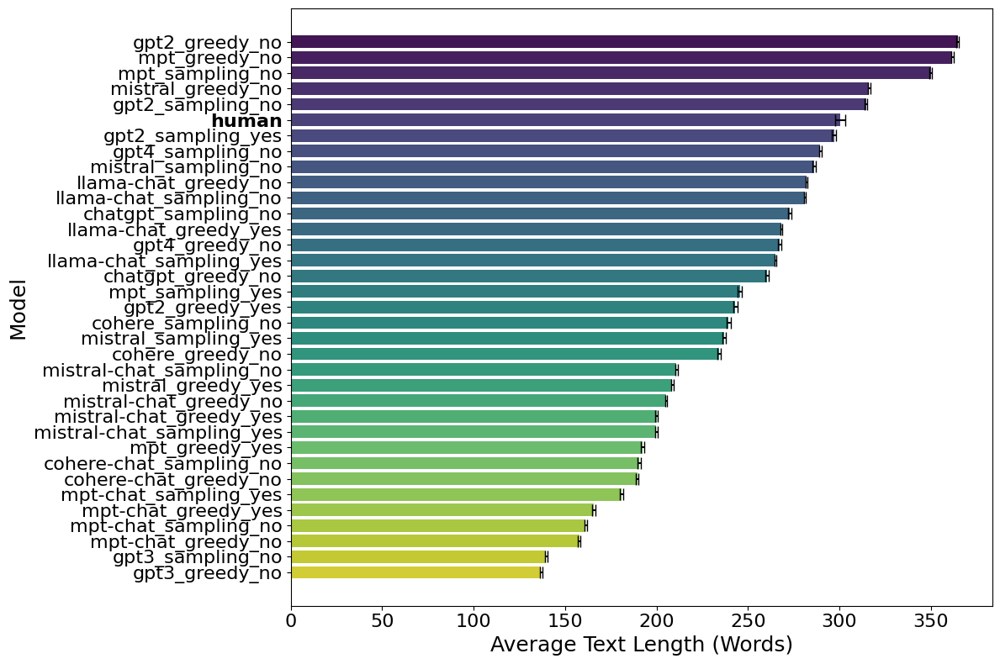

Saved overall average text length plot: raid_result/overall_average_text_length.pdf


/tmp/ipykernel_23253/4046177241.py:64: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  ax = sns.barplot(


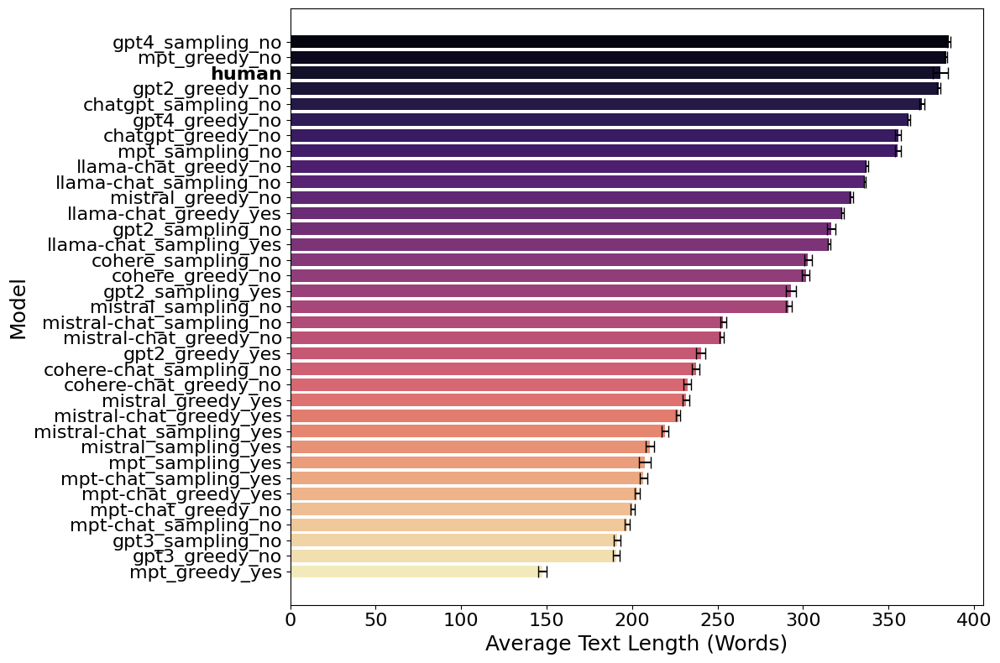

Saved news domain average text length plot: raid_result/news_domain_average_text_length.pdf


In [22]:
# ===========================
# Part 1: Overall Average Text Length per Model (Horizontal Bar Plot)
# ===========================
# Group the raw data by model
general_stats = df.groupby("model")["Text_Length"].agg(['mean', 'std', 'count']).reset_index()
general_stats.rename(columns={'mean': 'Average_Text_Length_General'}, inplace=True)

# Calculate the standard error: SE = std / sqrt(count)
general_stats['Error_Text_Length_General'] = general_stats['std'] / np.sqrt(general_stats['count'])

# Sort models from longest to shortest average text length
general_stats = general_stats.sort_values("Average_Text_Length_General", ascending=False)

plt.figure(figsize=(12, 8))
# Create a horizontal bar plot: x is average text length, y is model
ax = sns.barplot(
    data=general_stats,
    x="Average_Text_Length_General",
    y="model",
    palette="viridis",
    order=general_stats["model"],  # preserve sorted order
    ci=None  # disable Seaborn’s built-in error bars
)

# Add horizontal error bars at the right end of each bar
for bar, err in zip(ax.patches, general_stats["Error_Text_Length_General"]):
    x_right = bar.get_width()
    y_center = bar.get_y() + bar.get_height() / 2.0
    ax.errorbar(x_right, y_center, xerr=err, fmt='none', color='black', capsize=5)

plt.xlabel("Average Text Length (Words)", fontsize=18)
plt.ylabel("Model", fontsize=18)
# Increase tick label font size
ax.tick_params(axis='both', which='major', labelsize=16)
plt.tight_layout()

# Bold the "human" label on the y-axis if present
for label in ax.get_yticklabels():
    if label.get_text().strip().lower() == "human":
        label.set_fontweight("bold")
        label.set_color("black")

overall_plot_file = os.path.join(result_dir, "overall_average_text_length.pdf")
plt.savefig(overall_plot_file, format="pdf", dpi=300, bbox_inches="tight")
plt.show()
print("Saved overall average text length plot:", overall_plot_file)


# ===========================
# Part 2: News Domain Average Text Length per Model (Horizontal Bar Plot)
# ===========================
# Filter raw data for the news domain (case-insensitive)
news_df = df[df["domain"].str.lower() == "news"]

# Group the news-domain data by model
news_stats = news_df.groupby("model")["Text_Length"].agg(['mean', 'std', 'count']).reset_index()
news_stats.rename(columns={'mean': 'Average_Text_Length_Per_Domain'}, inplace=True)
news_stats['Error_Text_Length_Per_Domain'] = news_stats['std'] / np.sqrt(news_stats['count'])

# Sort models from longest to shortest for the news domain
news_stats = news_stats.sort_values("Average_Text_Length_Per_Domain", ascending=False)

plt.figure(figsize=(12, 8))
ax = sns.barplot(
    data=news_stats,
    x="Average_Text_Length_Per_Domain",
    y="model",
    palette="magma",
    order=news_stats["model"],
    ci=None
)

# Add horizontal error bars at the right end of each bar
for bar, err in zip(ax.patches, news_stats["Error_Text_Length_Per_Domain"]):
    x_right = bar.get_width()
    y_center = bar.get_y() + bar.get_height() / 2.0
    ax.errorbar(x_right, y_center, xerr=err, fmt='none', color='black', capsize=5)

plt.xlabel("Average Text Length (Words)", fontsize=18)
plt.ylabel("Model", fontsize=18)
ax.tick_params(axis='both', which='major', labelsize=16)
plt.tight_layout()

# Bold the "human" label on the y-axis if present
for label in ax.get_yticklabels():
    if label.get_text().strip().lower() == "human":
        label.set_fontweight("bold")
        label.set_color("black")

news_plot_file = os.path.join(result_dir, "news_domain_average_text_length.pdf")
plt.savefig(news_plot_file, format="pdf", dpi=300, bbox_inches="tight")
plt.show()
print("Saved news domain average text length plot:", news_plot_file)

/tmp/ipykernel_23253/3163097326.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  ax = sns.barplot(


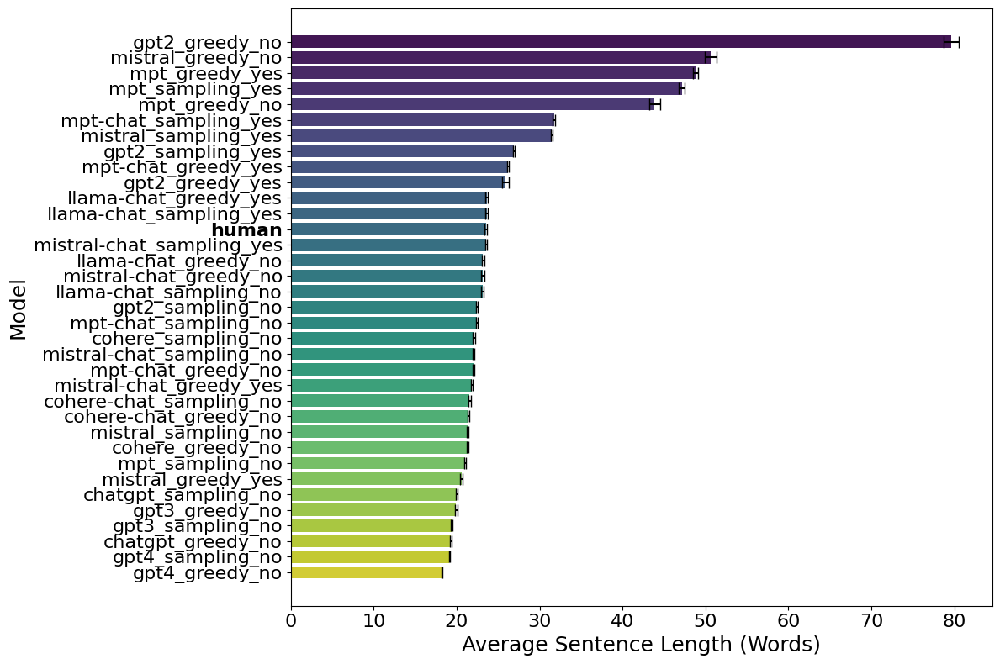

Saved overall plot: raid_result/mean_sentence_length_barplot_overall.pdf


/tmp/ipykernel_23253/3163097326.py:63: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  ax = sns.barplot(


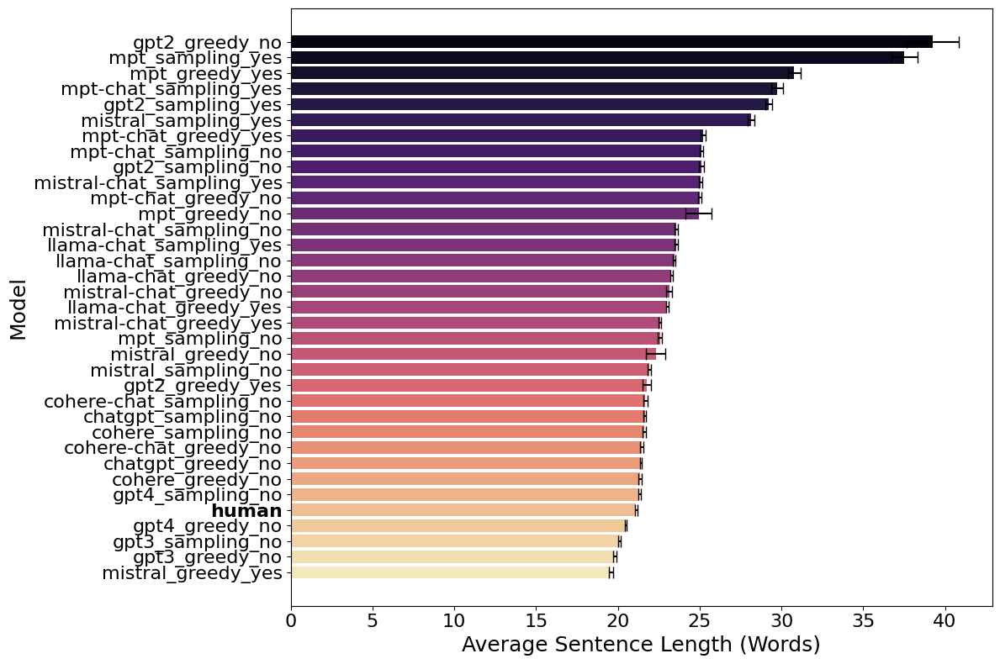

Saved news domain plot: raid_result/mean_sentence_length_barplot_news.pdf


In [24]:
# ===============================
# Part 1: Overall Mean Sentence Length per Model
# ===============================
# Group by model to calculate the mean, std, and count for Avg_Sentence_Length
overall_stats = df.groupby("model")["Avg_Sentence_Length"].agg(['mean', 'std', 'count']).reset_index()
overall_stats.rename(columns={'mean': 'Avg_Sentence_Length_Mean'}, inplace=True)

# Calculate standard error (SE = std / sqrt(count))
overall_stats['SE'] = overall_stats['std'] / np.sqrt(overall_stats['count'])

# Sort models by descending average sentence length
overall_stats = overall_stats.sort_values("Avg_Sentence_Length_Mean", ascending=False)

plt.figure(figsize=(12, 8))
# Create horizontal bar plot: x-axis is mean sentence length, y-axis is model
ax = sns.barplot(
    data=overall_stats,
    x="Avg_Sentence_Length_Mean",
    y="model",
    palette="viridis",
    order=overall_stats["model"],
    ci=None  # Disable Seaborn's built-in error bars
)

# Add horizontal error bars at the right end of each bar
for bar, err in zip(ax.patches, overall_stats["SE"]):
    x_right = bar.get_width()  # end of the bar (mean value)
    y_center = bar.get_y() + bar.get_height() / 2.0
    ax.errorbar(x_right, y_center, xerr=err, fmt='none', color='black', capsize=5)

plt.xlabel("Average Sentence Length (Words)", fontsize=18)
plt.ylabel("Model", fontsize=18)
ax.tick_params(axis='both', which='major', labelsize=16)
plt.tight_layout()

# Bold the "human" label on the y-axis if present
for label in ax.get_yticklabels():
    if label.get_text().strip().lower() == "human":
        label.set_fontweight("bold")
        label.set_color("black")

overall_plot_file = os.path.join(result_dir, "mean_sentence_length_barplot_overall.pdf")
plt.savefig(overall_plot_file, format="pdf", dpi=300, bbox_inches="tight")
plt.show()
print("Saved overall plot:", overall_plot_file)


# ===============================
# Part 2: Mean Sentence Length per Model in the News Domain
# ===============================
# Filter the raw data for the news domain (case-insensitive)
news_df = df[df["domain"].str.lower() == "news"]

# Group by model to calculate the mean, std, and count for Avg_Sentence_Length in news domain
news_stats = news_df.groupby("model")["Avg_Sentence_Length"].agg(['mean', 'std', 'count']).reset_index()
news_stats.rename(columns={'mean': 'Avg_Sentence_Length_Mean'}, inplace=True)
news_stats['SE'] = news_stats['std'] / np.sqrt(news_stats['count'])

# Sort models by descending average sentence length for news domain
news_stats = news_stats.sort_values("Avg_Sentence_Length_Mean", ascending=False)

plt.figure(figsize=(12, 8))
ax = sns.barplot(
    data=news_stats,
    x="Avg_Sentence_Length_Mean",
    y="model",
    palette="magma",
    order=news_stats["model"],
    ci=None
)

for bar, err in zip(ax.patches, news_stats["SE"]):
    x_right = bar.get_width()
    y_center = bar.get_y() + bar.get_height() / 2.0
    ax.errorbar(x_right, y_center, xerr=err, fmt='none', color='black', capsize=5)

plt.xlabel("Average Sentence Length (Words)", fontsize=18)
plt.ylabel("Model", fontsize=18)
ax.tick_params(axis='both', which='major', labelsize=16)
plt.tight_layout()

for label in ax.get_yticklabels():
    if label.get_text().strip().lower() == "human":
        label.set_fontweight("bold")
        label.set_color("black")

news_plot_file = os.path.join(result_dir, "mean_sentence_length_barplot_news.pdf")
plt.savefig(news_plot_file, format="pdf", dpi=300, bbox_inches="tight")
plt.show()
print("Saved news domain plot:", news_plot_file)

In [ ]:
# ---------------------------
# Part 3: Statistical Significance Analysis in News Domain
# ---------------------------

# Filter for the news domain (assumes "domain" column exists and is comparable)
news_raw = domain_df[domain_df["domain"].str.lower() == "news"]

# Group by model and extract list of text lengths
model_groups = news_raw.groupby("model")["Average_Text_Length_Per_Domain"].apply(list).to_dict()

# Identify the human group (assume its model name contains "human")
human_lengths = None
for model, lengths in model_groups.items():
    if "human" in model.lower():
        human_lengths = lengths
        break

if human_lengths is None:
    print("No human texts found in the news domain for statistical analysis.")
else:
    significance_results = {}
    for model, lengths in model_groups.items():
        if "human" in model.lower():
            continue
        # Use Mann–Whitney U test (non-parametric)
        stat, p_value = mannwhitneyu(human_lengths, lengths, alternative='two-sided')
        significance_results[model] = p_value

    # Count models that are statistically different (p < 0.05) vs. not different
    diff_count = sum(1 for p in significance_results.values() if p < 0.05)
    not_diff_count = sum(1 for p in significance_results.values() if p >= 0.05)

    print("News Domain Statistical Analysis (Text Length):")
    print("Models statistically different from human (p < 0.05):", diff_count)
    print("Models NOT statistically different from human (p >= 0.05):", not_diff_count)

    # Create a DataFrame for detailed results and save
    sig_df = pd.DataFrame([
        {"model": model, "p_value": p_val, "Significant": p_val < 0.05}
        for model, p_val in significance_results.items()
    ])
    sig_file = os.path.join(result_dir, "news_domain_text_length_significance.csv")
    sig_df.to_csv(sig_file, index=False)
    print("Saved statistical significance results to:", sig_file)

# Sentence_Length

In [ ]:
# Read the general sentence length distribution CSV
df_dist = pd.read_csv(f"{result_dir}/sentence_length_distribution_per_model.csv", encoding="UTF-8")


# ---------------------------
# Create New Columns for Plotting
# ---------------------------
df_dist["decoding_penalty"] = df_dist["Model"].apply(get_decoding_penalty)
df_dist["clean_model"] = df_dist["Model"].apply(clean_model_name)

# ---------------------------
# Create 4 Plots: For Each Decoding_Penalty Category, Plot Human + Models with that Setting
# ---------------------------
# Get unique decoding_penalty values (exclude 'human')
categories = df_dist[df_dist["decoding_penalty"] != "human"]["decoding_penalty"].unique()

for cat in categories:
    # Subset: Include rows where decoding_penalty equals current cat OR model is human.
    subset_df = df_dist[(df_dist["decoding_penalty"] == cat) | (df_dist["Model"].str.lower() == "human")]
    
    plt.figure(figsize=(12, 8))
    sns.lineplot(
        data=subset_df,
        x="Sentence_Length",
        y="Normalized_Frequency",
        hue="Model",         # Use the full model name to differentiate lines
        style="Model",       # Differentiate with markers or line styles
        markers=True,
        dashes=False,
        palette="colorblind"
    )
    plt.xlabel("Sentence Length (in Words)")
    plt.ylabel("Normalized Frequency")
    plt.title(f"Sentence Length Distribution: Human vs {cat.replace('_', ' ').title()}")
    plt.legend(title="Model", bbox_to_anchor=(1.05, 1), loc="upper left")
    plt.tight_layout()
    
    # Save the plot
    plot_filename = f"{result_dir}/sentence_length_distribution_{cat}.pdf"
    plt.savefig(plot_filename, format="pdf", dpi=300, bbox_inches="tight")
    plt.show()
    print(f"Saved plot: {plot_filename}")


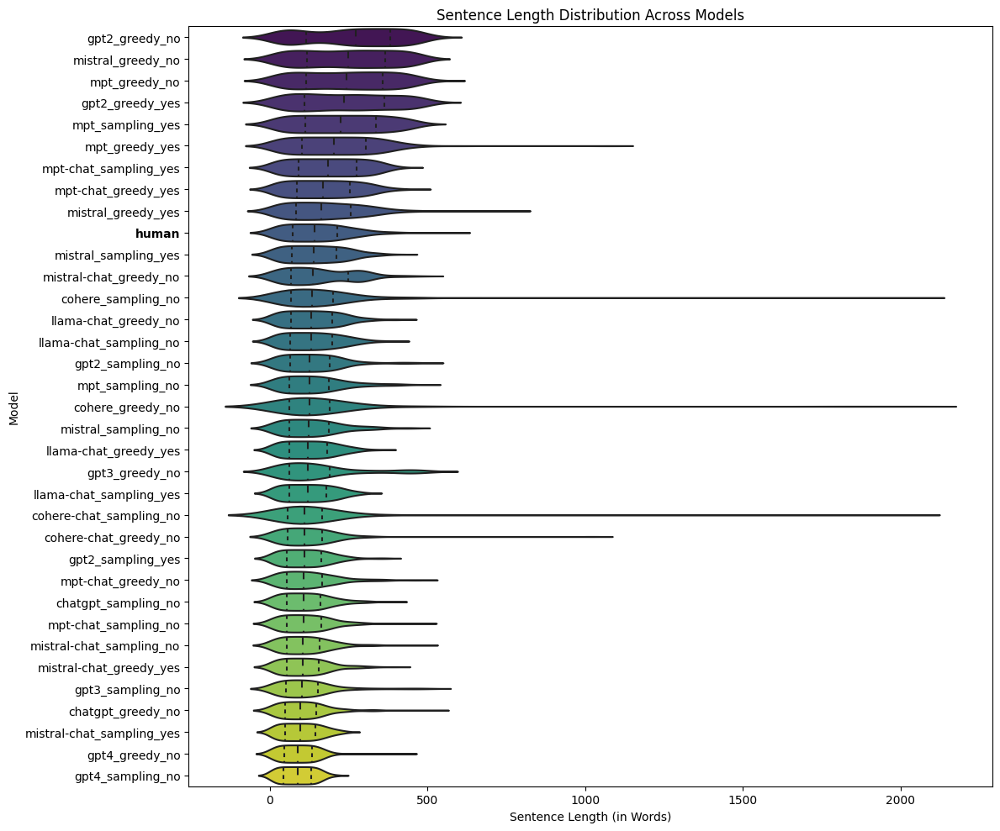

Saved plot: raid_result/sentence_length_violin_horizontal.pdf


In [319]:
# Sort models based on median sentence length
model_medians = df_dist.groupby("Model")["Sentence_Length"].median().sort_values(ascending=False).index
df_dist["Model"] = pd.Categorical(df_dist["Model"], categories=model_medians, ordered=True)

# Create horizontal violin plot
plt.figure(figsize=(12, 10))
ax = sns.violinplot(
    data=df_dist,
    y="Model",  # Y-axis: Different models (sorted)
    x="Sentence_Length",  # X-axis: Sentence length (words)
    weights="Normalized_Frequency",  # Use normalized frequency as weight
    inner="quartile",  # Show quartiles inside the violin
    palette="viridis",
    scale="width"  # Adjust width to emphasize density
)

plt.xlabel("Sentence Length (in Words)")
plt.ylabel("Model")
plt.title("Sentence Length Distribution Across Models")
plt.tight_layout()

# Bold the label for 'human' in the y-axis
for label in ax.get_yticklabels():
    if label.get_text().lower() == "human":
        label.set_fontweight("bold")
        label.set_color("black")

# Save the plot
plot_filename = os.path.join(result_dir, "sentence_length_violin_horizontal.pdf")
plt.savefig(plot_filename, format="pdf", dpi=300, bbox_inches="tight")
plt.show()

print(f"Saved plot: {plot_filename}")

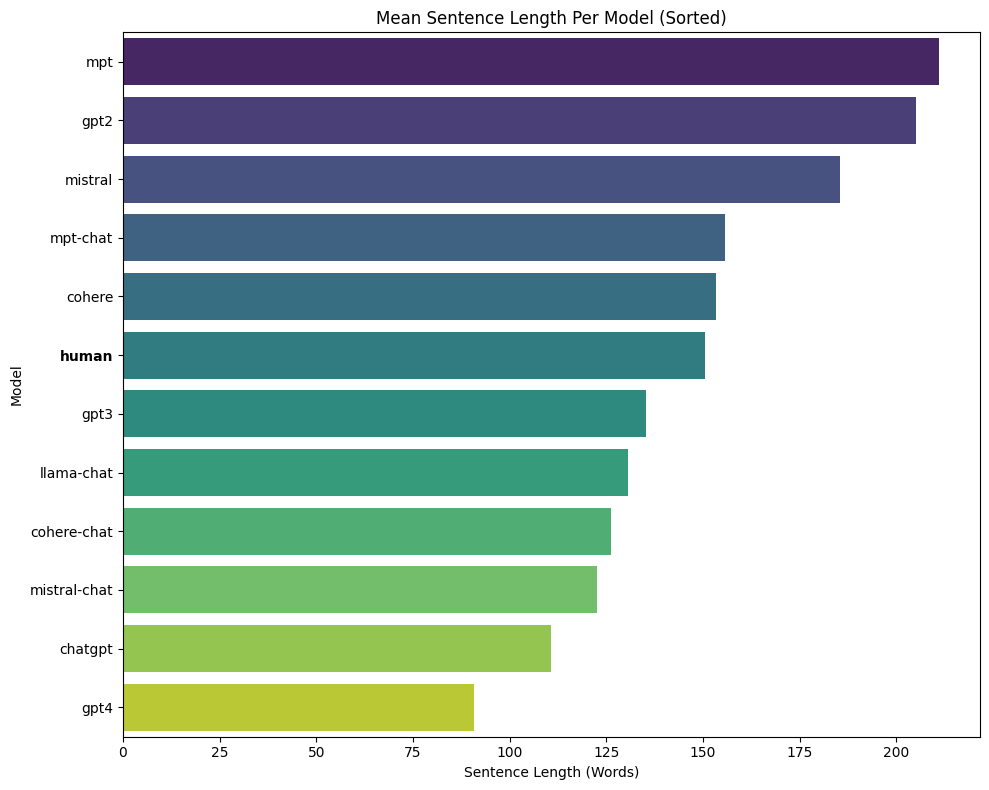

Saved plot: raid_result/mean_sentence_length_barplot.pdf


In [320]:
# Compute the mean sentence length for each model
mean_sentence_length = df_dist.groupby("clean_model")["Sentence_Length"].mean().reset_index()

# Sort by mean sentence length (descending order)
mean_sentence_length = mean_sentence_length.sort_values(by="Sentence_Length", ascending=False)

# Plot the bar chart
plt.figure(figsize=(10, 8))
ax = sns.barplot(
    data=mean_sentence_length,
    y="clean_model",          # Y-axis: Models
    x="Sentence_Length",      # X-axis: Mean sentence length
    palette="viridis"         # Color palette for better visualization
)

plt.xlabel("Sentence Length (Words)")
plt.ylabel("Model")
plt.title("Mean Sentence Length Per Model (Sorted)")
plt.tight_layout()

# Bold the label for 'human' in the y-axis
for label in ax.get_yticklabels():
    if label.get_text().lower() == "human":
        label.set_fontweight("bold")
        label.set_color("black")
        
# Save the plot
plot_filename = f"{result_dir}/mean_sentence_length_barplot.pdf"
plt.savefig(plot_filename, format="pdf", dpi=300, bbox_inches="tight")
plt.show()
print(f"Saved plot: {plot_filename}")

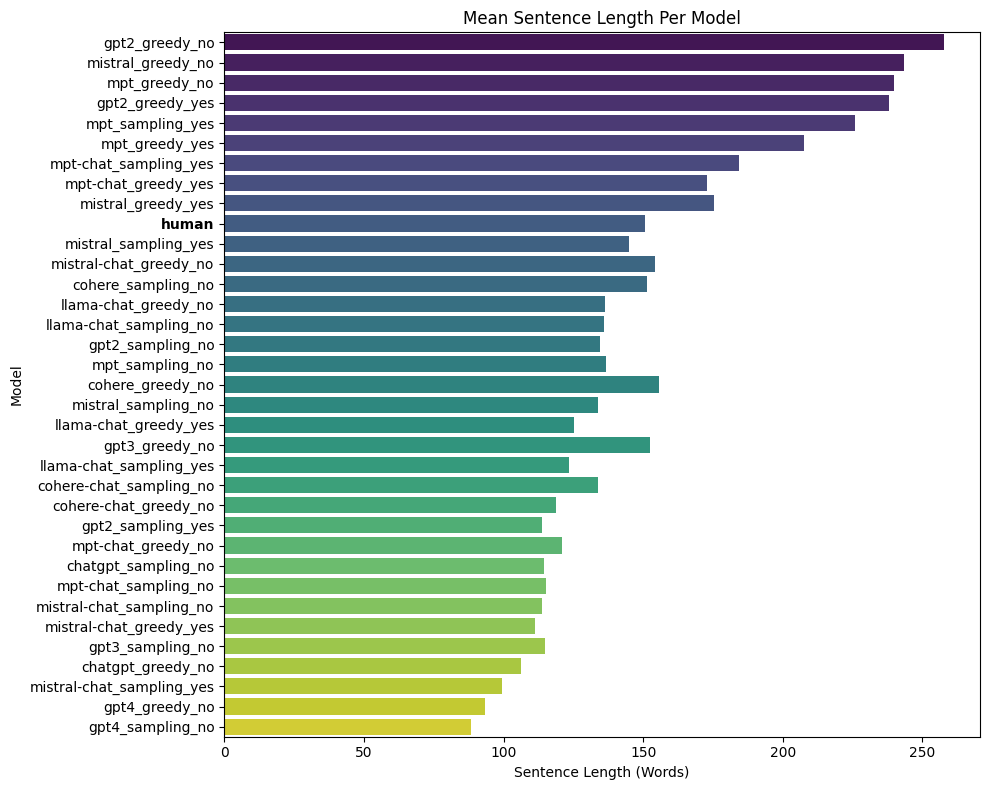

Saved plot: raid_result/mean_sentence_length_barplot.pdf


In [321]:
# Compute the mean sentence length for each model
mean_sentence_length = df_dist.groupby("Model")["Sentence_Length"].mean().reset_index()

# Sort by mean sentence length (descending order)
mean_sentence_length = mean_sentence_length.sort_values(by="Sentence_Length", ascending=False)

# Plot the bar chart
plt.figure(figsize=(10, 8))
ax = sns.barplot(
    data=mean_sentence_length,
    y="Model",          # Y-axis: Models
    x="Sentence_Length",      # X-axis: Mean sentence length
    palette="viridis"         # Color palette for better visualization
)

plt.xlabel("Sentence Length (Words)")
plt.ylabel("Model")
plt.title("Mean Sentence Length Per Model")
plt.tight_layout()

# Bold the label for 'human' in the y-axis
for label in ax.get_yticklabels():
    if label.get_text().lower() == "human":
        label.set_fontweight("bold")
        label.set_color("black")

# Save the plot
plot_filename = f"{result_dir}/mean_sentence_length_barplot.pdf"
plt.savefig(plot_filename, format="pdf", dpi=300, bbox_inches="tight")
plt.show()
print(f"Saved plot: {plot_filename}")

In [322]:
from scipy.stats import ks_2samp ## Kolmogorov–Smirnov (KS) test

df_dist = pd.read_csv(os.path.join(result_dir, "sentence_length_distribution_per_model_per_domain.csv"), encoding="UTF-8")

# Aggregate by Model and Sentence_Length (averaging normalized frequencies across domains)
overall_df = df_dist.groupby(["Model", "Sentence_Length"])["Normalized_Frequency"].mean().reset_index()

# Pivot: rows=Sentence_Length, columns=Model, values=Normalized_Frequency
overall_pivot = overall_df.pivot(index="Sentence_Length", columns="Model", values="Normalized_Frequency")
# Fill missing values with 0 (if a model has no frequency for a given sentence length)
overall_pivot = overall_pivot.fillna(0)

# Check that a human column exists (case-sensitive, so "human" must appear exactly)
if "human" not in overall_pivot.columns:
    print("No 'human' model found in overall data.")
else:
    human_overall = overall_pivot["human"]
    overall_results = {}
    for model in overall_pivot.columns:
        if model.lower() == "human":
            continue
        stat, p_val = ks_2samp(human_overall, overall_pivot[model])
        overall_results[model] = p_val

    similar_count = sum(1 for p in overall_results.values() if p >= 0.05)
    different_count = sum(1 for p in overall_results.values() if p < 0.05)

    print("Overall Sentence Length Distribution Comparison:")
    print(f"Models similar to human (p >= 0.05): {similar_count}")
    print(f"Models different from human (p < 0.05): {different_count}")
    print("\nDetailed Overall Results:")
    for model, p in overall_results.items():
        print(f"Model: {model}, p-value: {p:.4f}")

# ---------------------------
# Domain-Specific Analysis: News Domain
# ---------------------------
# Filter for the news domain (case-insensitive)
news_df = df_dist[df_dist["Domain"].str.lower() == "news"]

if news_df.empty:
    print("No data for news domain.")
else:
    # Aggregate by Model and Sentence_Length within news domain
    news_agg = news_df.groupby(["Model", "Sentence_Length"])["Normalized_Frequency"].mean().reset_index()
    news_pivot = news_agg.pivot(index="Sentence_Length", columns="Model", values="Normalized_Frequency")
    news_pivot = news_pivot.fillna(0)

    if "human" not in news_pivot.columns:
        print("No 'human' model found in news domain data.")
    else:
        human_news = news_pivot["human"]
        news_results = {}
        for model in news_pivot.columns:
            if model.lower() == "human":
                continue
            stat, p_val = ks_2samp(human_news, news_pivot[model])
            news_results[model] = p_val

        similar_count_news = sum(1 for p in news_results.values() if p >= 0.05)
        different_count_news = sum(1 for p in news_results.values() if p < 0.05)

        print("\nNews Domain Sentence Length Distribution Comparison:")
        print(f"Models similar to human (p >= 0.05): {similar_count_news}")
        print(f"Models different from human (p < 0.05): {different_count_news}")
        print("\nDetailed News Domain Results:")
        for model, p in news_results.items():
            print(f"Model: {model}, p-value: {p:.4f}")

Overall Sentence Length Distribution Comparison:
Models similar to human (p >= 0.05): 2
Models different from human (p < 0.05): 32

Detailed Overall Results:
Model: chatgpt_greedy_no, p-value: 0.0000
Model: chatgpt_sampling_no, p-value: 0.0000
Model: cohere-chat_greedy_no, p-value: 0.0006
Model: cohere-chat_sampling_no, p-value: 0.0006
Model: cohere_greedy_no, p-value: 0.1870
Model: cohere_sampling_no, p-value: 0.0046
Model: gpt2_greedy_no, p-value: 0.0000
Model: gpt2_greedy_yes, p-value: 0.0000
Model: gpt2_sampling_no, p-value: 0.0130
Model: gpt2_sampling_yes, p-value: 0.0003
Model: gpt3_greedy_no, p-value: 0.0232
Model: gpt3_sampling_no, p-value: 0.0000
Model: gpt4_greedy_no, p-value: 0.0000
Model: gpt4_sampling_no, p-value: 0.0000
Model: llama-chat_greedy_no, p-value: 0.0012
Model: llama-chat_greedy_yes, p-value: 0.0000
Model: llama-chat_sampling_no, p-value: 0.0003
Model: llama-chat_sampling_yes, p-value: 0.0000
Model: mistral-chat_greedy_no, p-value: 0.1630
Model: mistral-chat_gre

/tmp/ipykernel_125725/2106990008.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  news_df["decoding_penalty"] = news_df["Model"].apply(get_decoding_penalty)
/tmp/ipykernel_125725/2106990008.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  news_df["clean_model"] = news_df["Model"].apply(clean_model_name)


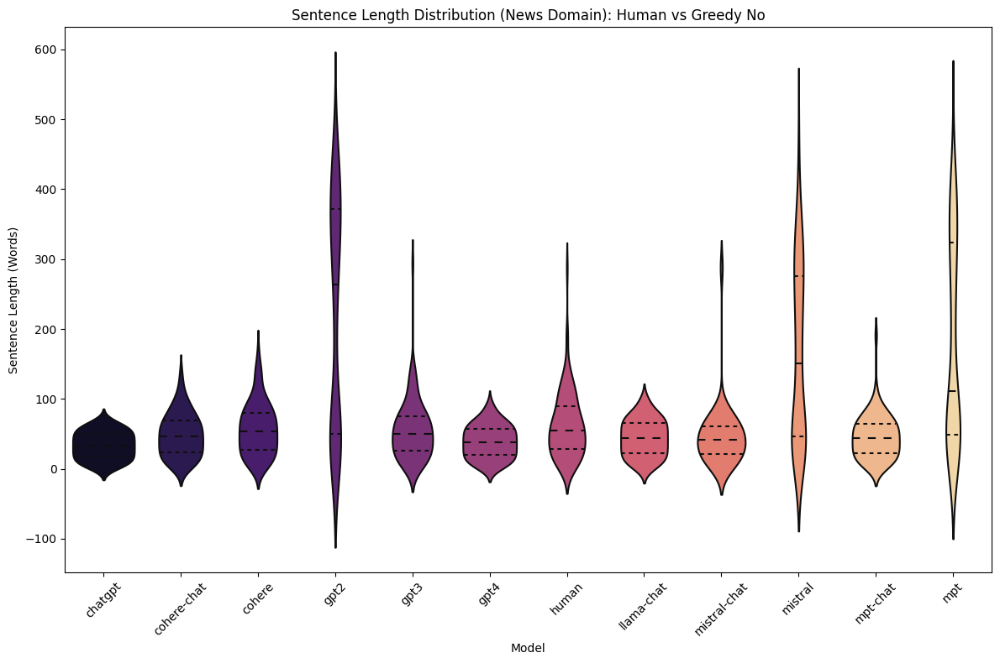

Saved plot: raid_result/sentence_length_violin_news_greedy_no.pdf


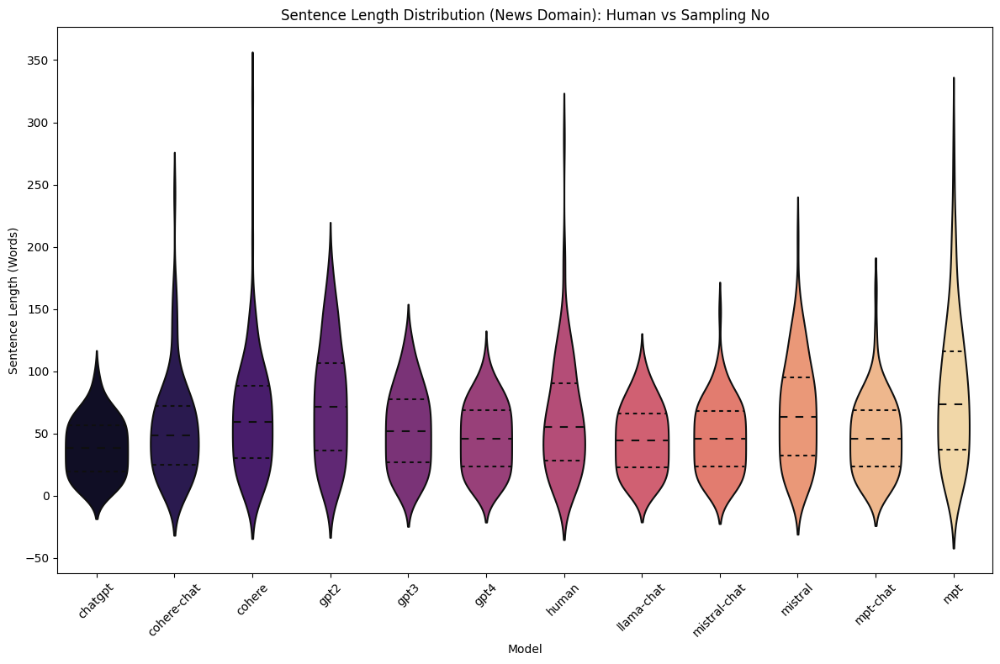

Saved plot: raid_result/sentence_length_violin_news_sampling_no.pdf


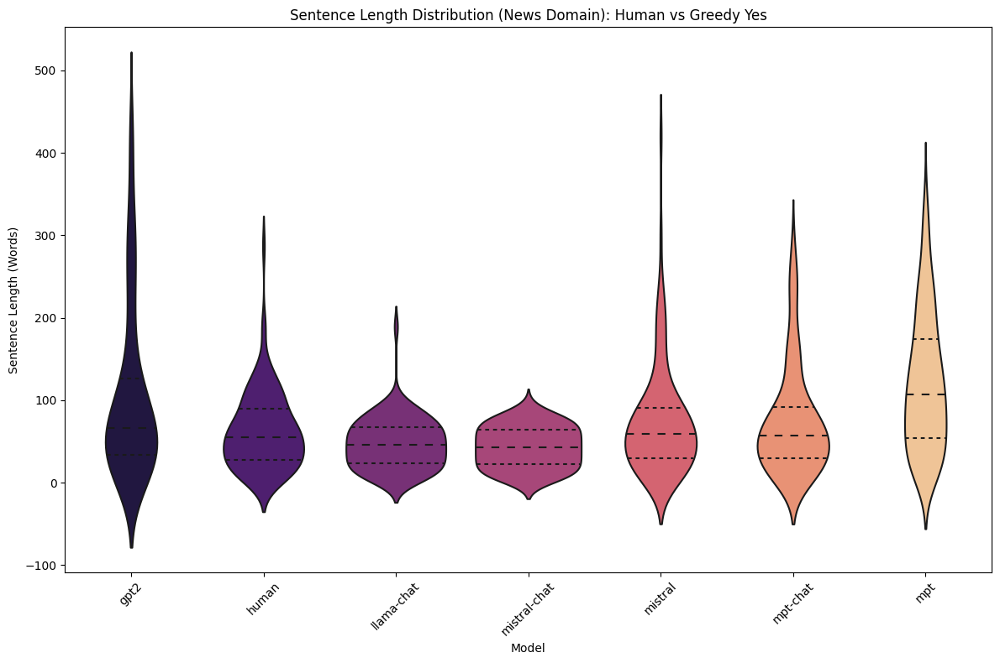

Saved plot: raid_result/sentence_length_violin_news_greedy_yes.pdf


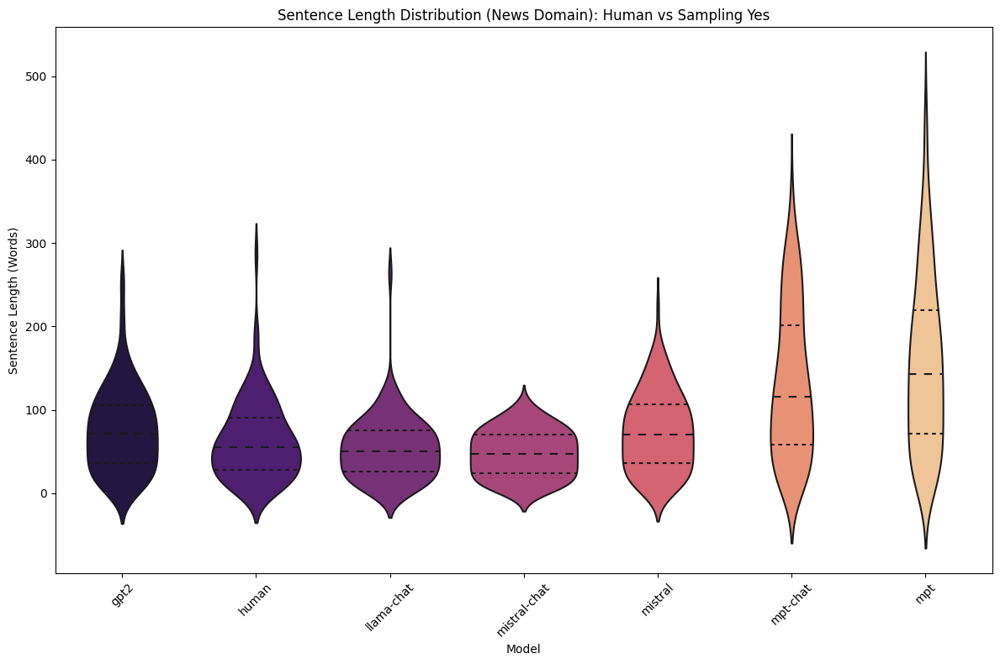

Saved plot: raid_result/sentence_length_violin_news_sampling_yes.pdf


In [323]:

# ---------------------------
# Create New Columns for Plotting
# ---------------------------
news_df["decoding_penalty"] = news_df["Model"].apply(get_decoding_penalty)
news_df["clean_model"] = news_df["Model"].apply(clean_model_name)

# ---------------------------
# Create Violin Plots: For Each Decoding_Penalty Category in the News Domain
# ---------------------------
# Get unique decoding_penalty values (exclude 'human')
categories = news_df[news_df["decoding_penalty"] != "human"]["decoding_penalty"].unique()

for cat in categories:
    # Subset: Include rows where decoding_penalty equals current cat OR model is human.
    subset_df = news_df[(news_df["decoding_penalty"] == cat) | (news_df["Model"].str.lower() == "human")]
    
    plt.figure(figsize=(12, 8))
    sns.violinplot(
        data=subset_df,
        x="clean_model",         # X-axis: Different models (including human)
        y="Sentence_Length",      # Y-axis: Sentence length (words)
        weights="Normalized_Frequency",  # Use normalized frequency as weight
        inner="quartile",         # Show quartiles inside the violin
        palette="magma"
    )
    
    plt.xlabel("Model")
    plt.ylabel("Sentence Length (Words)")
    plt.title(f"Sentence Length Distribution (News Domain): Human vs {cat.replace('_', ' ').title()}")
    plt.xticks(rotation=45)  # Rotate labels for readability
    plt.tight_layout()
    
    # Save the plot
    plot_filename = os.path.join(result_dir, f"sentence_length_violin_news_{cat}.pdf")
    plt.savefig(plot_filename, format="pdf", dpi=300, bbox_inches="tight")
    plt.show()
    print(f"Saved plot: {plot_filename}")

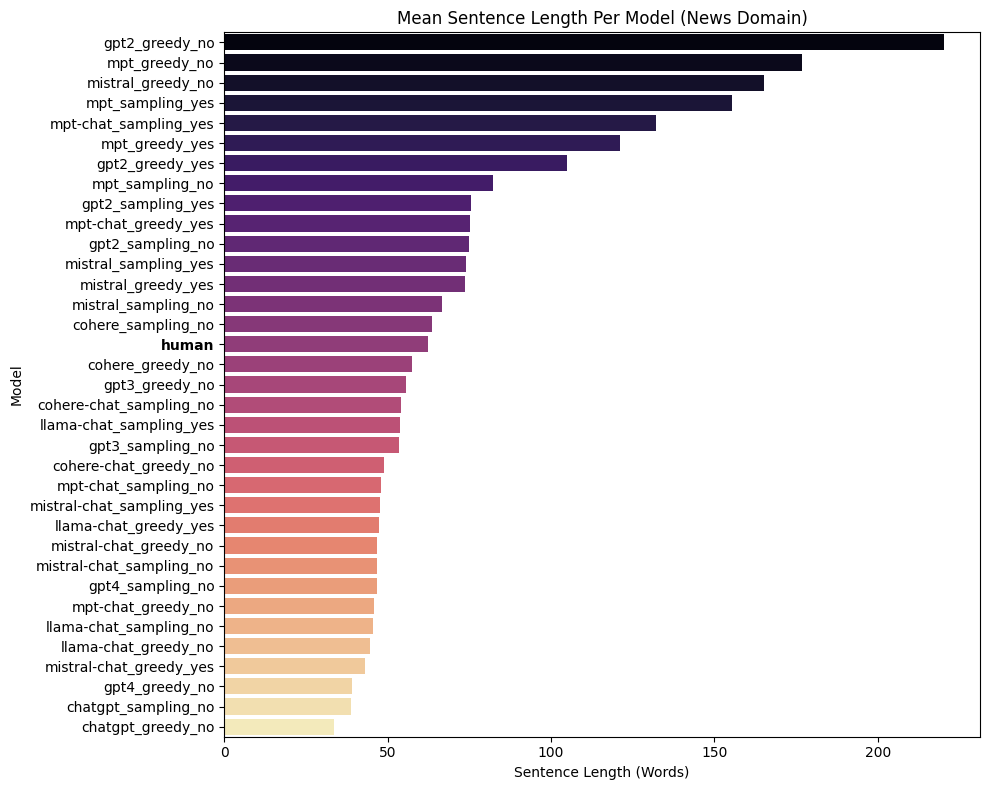

Saved plot: raid_result/mean_sentence_length_barplot_news.pdf


In [324]:


# Compute the mean sentence length for each model in the news domain
mean_sentence_length_news = news_df.groupby("Model")["Sentence_Length"].mean().reset_index()

# Sort by mean sentence length (descending order)
mean_sentence_length_news = mean_sentence_length_news.sort_values(by="Sentence_Length", ascending=False)

# Plot the bar chart
plt.figure(figsize=(10, 8))
ax = sns.barplot(
    data=mean_sentence_length_news,
    y="Model",                # Y-axis: Models
    x="Sentence_Length",      # X-axis: Mean sentence length
    palette="magma"         # Color palette for better visualization
)

plt.xlabel("Sentence Length (Words)")
plt.ylabel("Model")
plt.title("Mean Sentence Length Per Model (News Domain)")
plt.tight_layout()
# Bold the label for 'human' in the y-axis
for label in ax.get_yticklabels():
    if label.get_text().lower() == "human":
        label.set_fontweight("bold")
        label.set_color("black")
# Save the plot
plot_filename = os.path.join(result_dir, "mean_sentence_length_barplot_news.pdf")
plt.savefig(plot_filename, format="pdf", dpi=300, bbox_inches="tight")
plt.show()
print(f"Saved plot: {plot_filename}")

/tmp/ipykernel_125725/1696533955.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  news_df["Model"] = pd.Categorical(news_df["Model"], categories=model_medians, ordered=True)


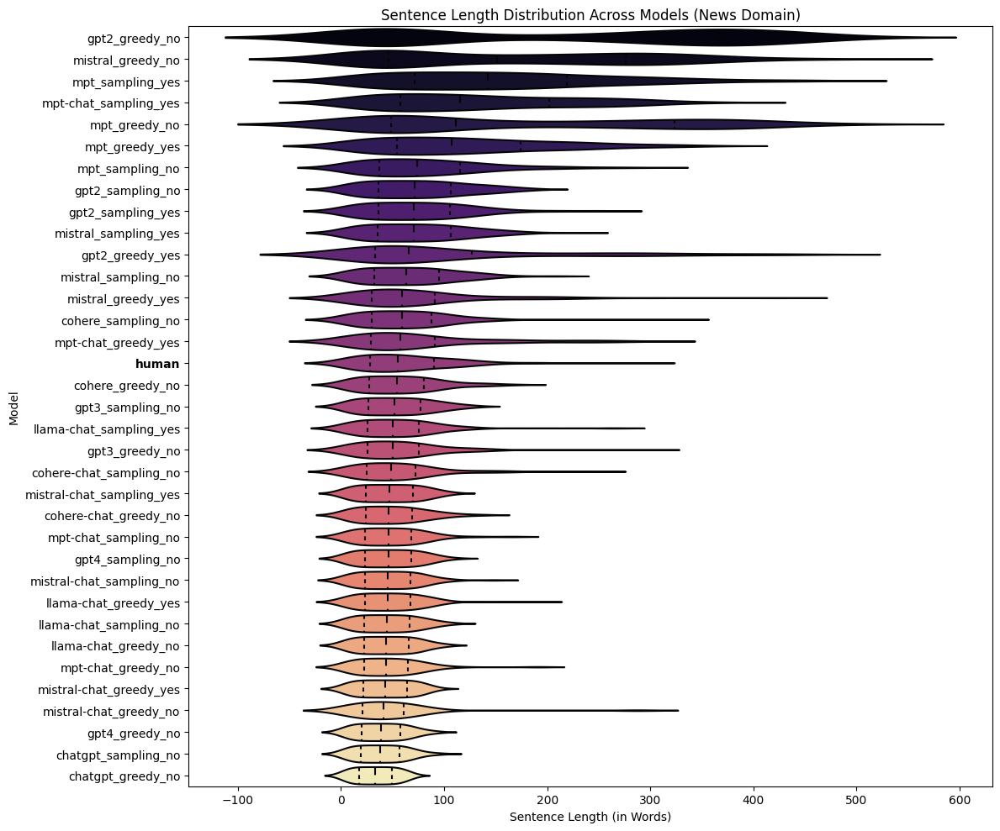

Saved plot: raid_result/sentence_length_violin_horizontal.pdf


In [325]:

# Sort models based on median sentence length
model_medians = news_df.groupby("Model")["Sentence_Length"].median().sort_values(ascending=False).index
news_df["Model"] = pd.Categorical(news_df["Model"], categories=model_medians, ordered=True)

# Create horizontal violin plot
plt.figure(figsize=(12, 10))
ax = sns.violinplot(
    data=news_df,
    y="Model",  # Y-axis: Different models (sorted)
    x="Sentence_Length",  # X-axis: Sentence length (words)
    weights="Normalized_Frequency",  # Use normalized frequency as weight
    inner="quartile",  # Show quartiles inside the violin
    palette="magma",
    scale="width"  # Adjust width to emphasize density
)

plt.xlabel("Sentence Length (in Words)")
plt.ylabel("Model")
plt.title("Sentence Length Distribution Across Models (News Domain)")
plt.tight_layout()

# Bold the label for 'human' in the y-axis
for label in ax.get_yticklabels():
    if label.get_text().lower() == "human":
        label.set_fontweight("bold")
        label.set_color("black")

# Save the plot
plot_filename = os.path.join(result_dir, "sentence_length_violin_horizontal.pdf")
plt.savefig(plot_filename, format="pdf", dpi=300, bbox_inches="tight")
plt.show()

print(f"Saved plot: {plot_filename}")

# Features Statistical Analysis

In [326]:
# List of features to generate violin plots for
features = [
    "MCI_VERB", "MCI_NOUN", "Average_Prevalence", "simp_ttr",
    "Syntactic_Depth", "Average_Dependency_Length", "Semantic_similarity", "Average_Emotion"
]

# ---------------------------
# Overall Statistical Analysis (All Domains)
# ---------------------------
overall_results = []
print("Overall Statistical Comparison:")
for feat in features:
    # Get human values for this feature (once)
    human_vals = df.loc[df["model"].str.lower().str.contains("human"), feat].dropna().values
    if len(human_vals) == 0:
        print(f"No human data for feature {feat}. Skipping.")
        continue
    
    # Create a dictionary for non-human models for this feature
    nonhuman_dict = {}
    nonhuman_models = df.loc[~df["model"].str.lower().str.contains("human"), "model"].unique()
    for model in nonhuman_models:
        vals = df.loc[df["model"] == model, feat].dropna().values
        if len(vals) > 0:
            nonhuman_dict[model] = vals
    
    feat_results = []
    for model, vals in nonhuman_dict.items():
        stat, p_val = mannwhitneyu(human_vals, vals, alternative="two-sided")
        feat_results.append({
            "Feature": feat,
            "Model": model,
            "p_value": p_val,
            "Human_n": len(human_vals),
            "Model_n": len(vals)
        })
        overall_results.append({
            "Feature": feat,
            "Model": model,
            "p_value": p_val,
            "Human_n": len(human_vals),
            "Model_n": len(vals)
        })
    
    similar_count = sum(1 for res in feat_results if res["p_value"] >= 0.05)
    different_count = sum(1 for res in feat_results if res["p_value"] < 0.05)
    
    print(f"\nFeature: {feat}")
    print("Overall Comparison:")
    print(f"Models similar to human (p >= 0.05): {similar_count}")
    print(f"Models different from human (p < 0.05): {different_count}")
    print("Detailed Overall Results:")
    for res in feat_results:
        print(f"  Model: {res['Model']}, p-value: {res['p_value']:.4f}, Human_n: {res['Human_n']}, Model_n: {res['Model_n']}")

overall_results_df = pd.DataFrame(overall_results)
overall_csv = os.path.join(result_dir, "overall_feature_statistical_comparison.csv")
overall_results_df.to_csv(overall_csv, index=False, encoding="UTF-8")
print("\nSaved overall feature statistical comparison to:", overall_csv)

# ---------------------------
# Domain-Specific Analysis: News Domain
# ---------------------------
# Filter for the news domain (assuming domain values are case-insensitive)
news_df = df[df["domain"].str.lower() == "news"]

news_results = []
print("\nNews Domain Statistical Comparison:")
for feat in features:
    # Get human values in news domain for this feature (once)
    human_vals = news_df.loc[news_df["model"].str.lower().str.contains("human"), feat].dropna().values
    if len(human_vals) == 0:
        print(f"No human data for feature {feat} in news domain. Skipping.")
        continue
    
    # Build dictionary of non-human values for news domain
    nonhuman_dict = {}
    nonhuman_models = news_df.loc[~news_df["model"].str.lower().str.contains("human"), "model"].unique()
    for model in nonhuman_models:
        vals = news_df.loc[news_df["model"] == model, feat].dropna().values
        if len(vals) > 0:
            nonhuman_dict[model] = vals
    
    feat_news_results = []
    for model, vals in nonhuman_dict.items():
        stat, p_val = mannwhitneyu(human_vals, vals, alternative="two-sided")
        feat_news_results.append({
            "Feature": feat,
            "Model": model,
            "p_value": p_val,
            "Human_n": len(human_vals),
            "Model_n": len(vals)
        })
        news_results.append({
            "Feature": feat,
            "Model": model,
            "p_value": p_val,
            "Human_n": len(human_vals),
            "Model_n": len(vals)
        })
    
    similar_count_news = sum(1 for res in feat_news_results if res["p_value"] >= 0.05)
    different_count_news = sum(1 for res in feat_news_results if res["p_value"] < 0.05)
    
    print(f"\nFeature: {feat}")
    print("News Domain Comparison:")
    print(f"Models similar to human (p >= 0.05): {similar_count_news}")
    print(f"Models different from human (p < 0.05): {different_count_news}")
    print("Detailed News Domain Results:")
    for res in feat_news_results:
        print(f"  Model: {res['Model']}, p-value: {res['p_value']:.4f}, Human_n: {res['Human_n']}, Model_n: {res['Model_n']}")

news_results_df = pd.DataFrame(news_results)
news_csv = os.path.join(result_dir, "news_feature_statistical_comparison.csv")
news_results_df.to_csv(news_csv, index=False, encoding="UTF-8")
print("\nSaved news domain feature statistical comparison to:", news_csv)

Overall Statistical Comparison:

Feature: MCI_VERB
Overall Comparison:
Models similar to human (p >= 0.05): 1
Models different from human (p < 0.05): 33
Detailed Overall Results:
  Model: llama-chat_greedy_no, p-value: 0.0000, Human_n: 13366, Model_n: 13371
  Model: llama-chat_sampling_yes, p-value: 0.0000, Human_n: 13366, Model_n: 13371
  Model: mpt_greedy_no, p-value: 0.0000, Human_n: 13366, Model_n: 12546
  Model: mpt_sampling_yes, p-value: 0.0000, Human_n: 13366, Model_n: 13079
  Model: mpt-chat_greedy_no, p-value: 0.0000, Human_n: 13366, Model_n: 13360
  Model: mpt-chat_sampling_yes, p-value: 0.0000, Human_n: 13366, Model_n: 13335
  Model: gpt2_greedy_no, p-value: 0.0000, Human_n: 13366, Model_n: 10759
  Model: gpt2_sampling_yes, p-value: 0.0000, Human_n: 13366, Model_n: 13298
  Model: mistral_greedy_no, p-value: 0.0000, Human_n: 13366, Model_n: 12495
  Model: mistral_sampling_yes, p-value: 0.0000, Human_n: 13366, Model_n: 13368
  Model: mistral-chat_greedy_no, p-value: 0.0000, Hu

/tmp/ipykernel_23253/1584224796.py:35: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  ax = sns.barplot(


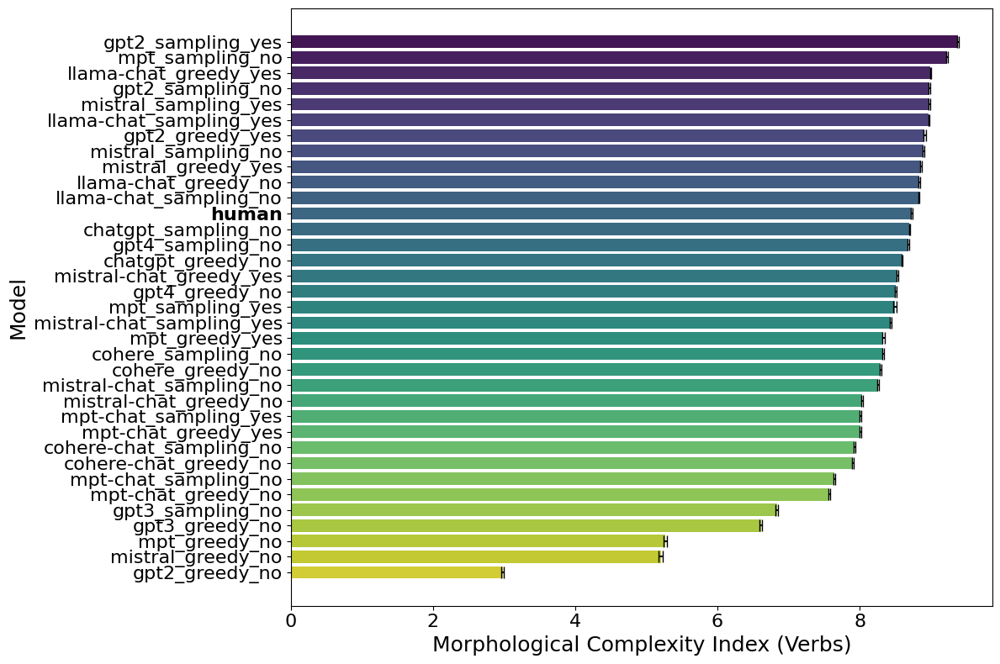

Saved plot: raid_result/mean_MCI_VERB_barplot.pdf


/tmp/ipykernel_23253/1584224796.py:35: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  ax = sns.barplot(


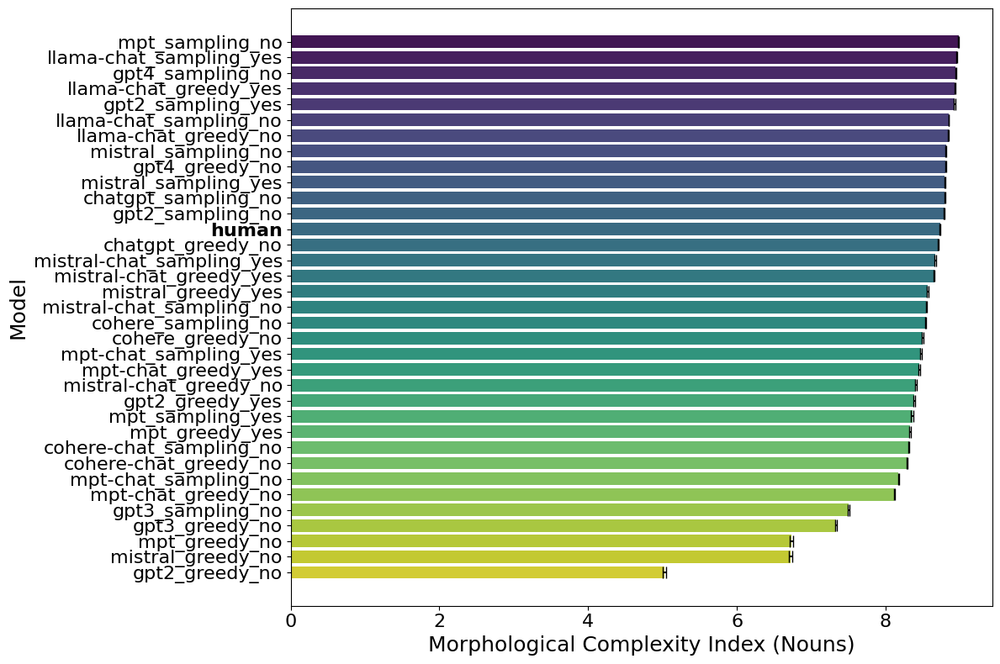

Saved plot: raid_result/mean_MCI_NOUN_barplot.pdf


/tmp/ipykernel_23253/1584224796.py:35: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  ax = sns.barplot(


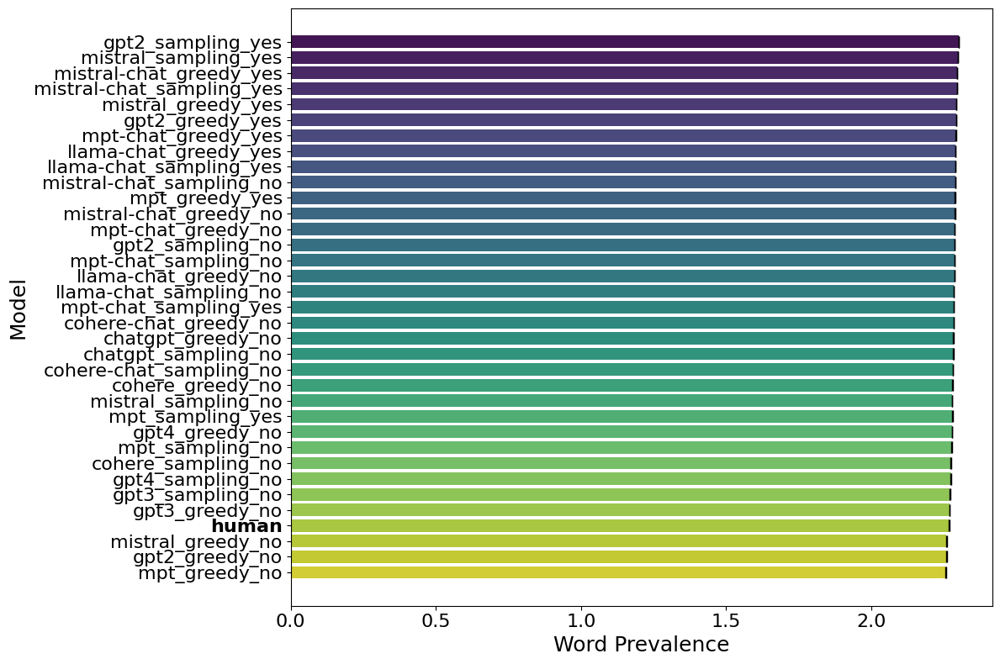

Saved plot: raid_result/mean_Average_Prevalence_barplot.pdf


/tmp/ipykernel_23253/1584224796.py:35: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  ax = sns.barplot(


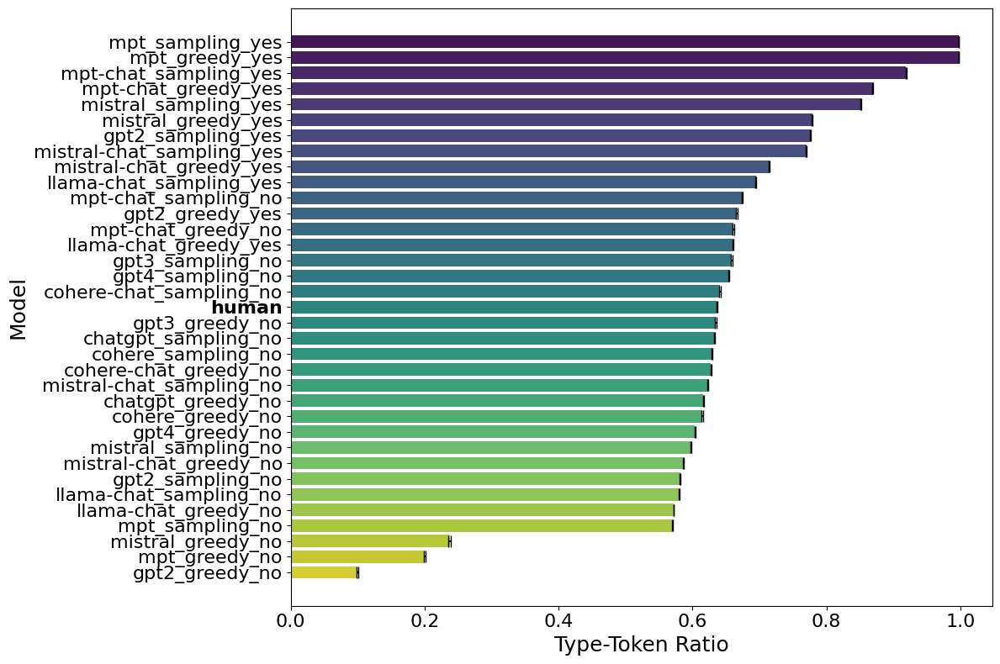

Saved plot: raid_result/mean_simp_ttr_barplot.pdf


/tmp/ipykernel_23253/1584224796.py:35: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  ax = sns.barplot(


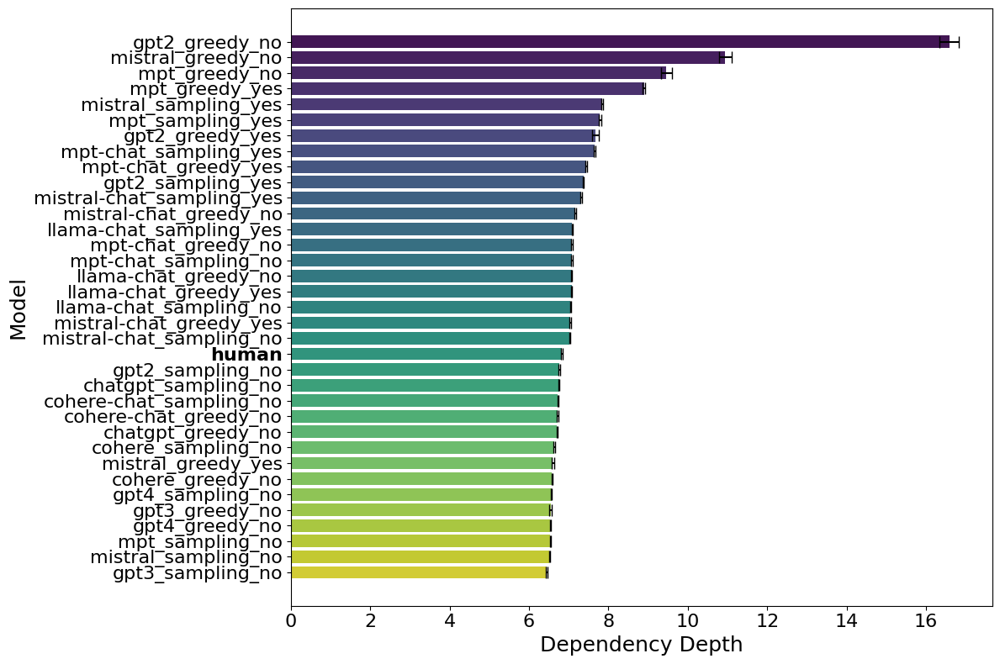

Saved plot: raid_result/mean_Syntactic_Depth_barplot.pdf


/tmp/ipykernel_23253/1584224796.py:35: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  ax = sns.barplot(


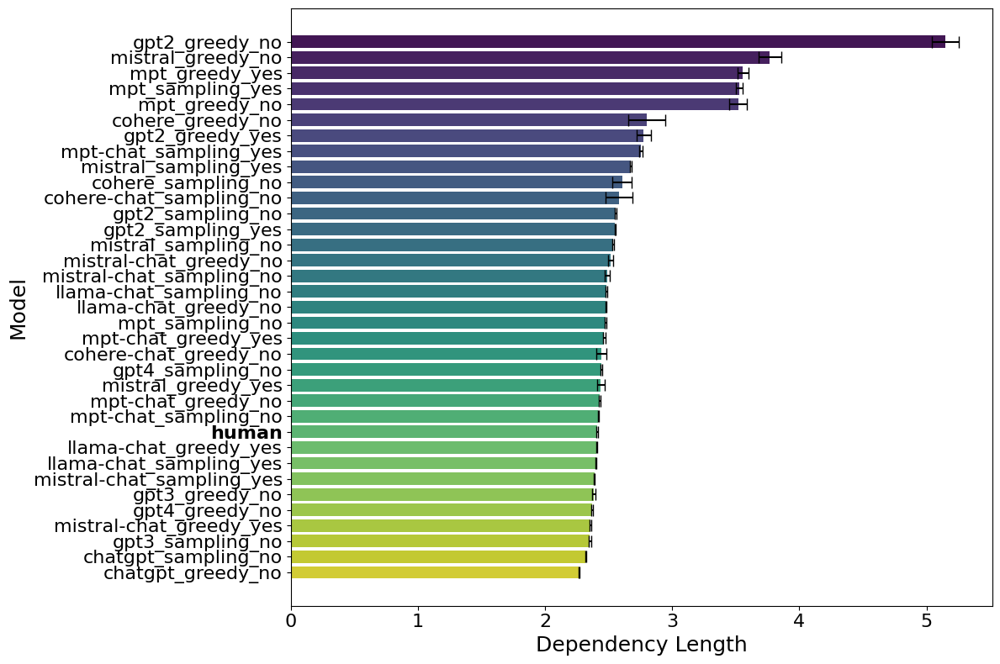

Saved plot: raid_result/mean_Average_Dependency_Length_barplot.pdf


/tmp/ipykernel_23253/1584224796.py:35: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  ax = sns.barplot(


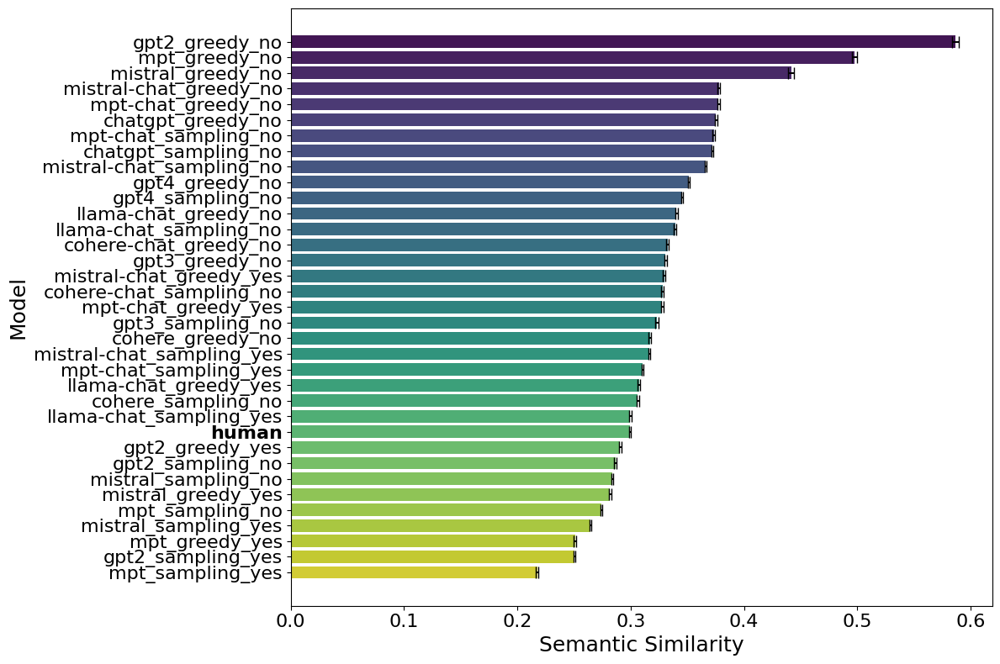

Saved plot: raid_result/mean_Semantic_similarity_barplot.pdf


/tmp/ipykernel_23253/1584224796.py:35: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  ax = sns.barplot(


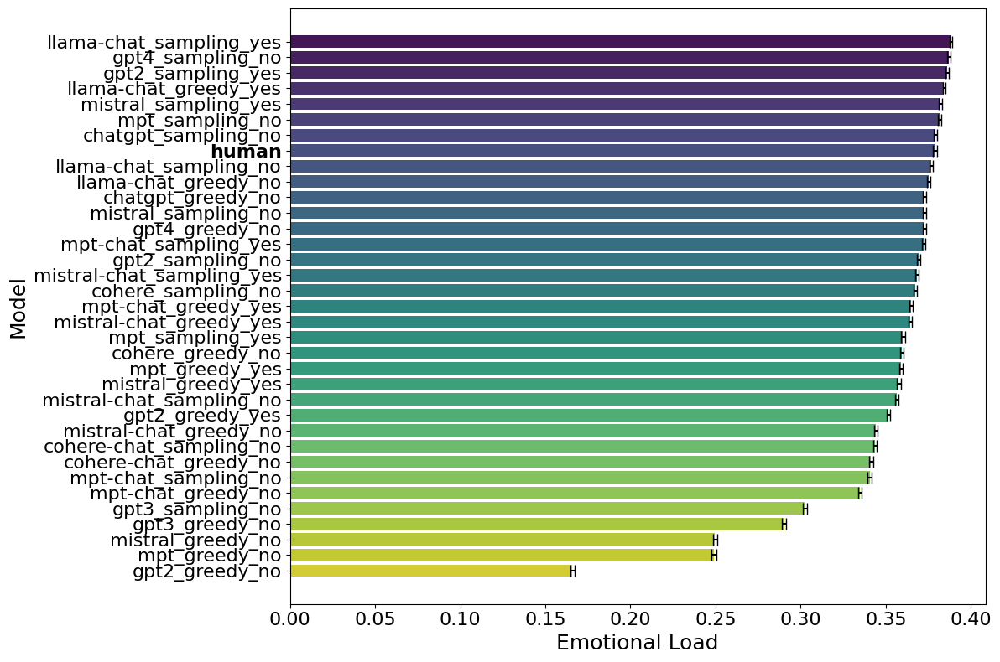

Saved plot: raid_result/mean_Average_Emotion_barplot.pdf


In [26]:

# Define a mapping from feature names to their true names
feature_name_mapping = {
    "MCI_VERB": "Morphological Complexity Index (Verbs)",
    "MCI_NOUN": "Morphological Complexity Index (Nouns)",
    "Average_Prevalence": "Word Prevalence",
    "simp_ttr": "Type-Token Ratio",
    "Syntactic_Depth": "Dependency Depth",
    "Average_Dependency_Length": "Dependency Length",
    "Semantic_similarity": "Semantic Similarity",
    "Average_Emotion": "Emotional Load"
}

# List of features to plot
features = list(feature_name_mapping.keys())

# ----------------------------------------------------
# Compute mean values per model for all features
# ----------------------------------------------------
mean_features_df = df.groupby("model")[features].mean().reset_index()

# Compute standard error for each feature (SE = std / sqrt(n))
error_features_df = df.groupby("model")[features].agg(lambda x: x.std() / np.sqrt(x.count())).reset_index()

# ----------------------------------------------------
# Generate and save bar plots for each feature
# ----------------------------------------------------
for feat in features:
    # Sort models by mean feature value (descending order)
    sorted_mean = mean_features_df.sort_values(by=feat, ascending=False).reset_index(drop=True)
    
    # Align error values with the sorted order using model as key
    sorted_error = error_features_df.set_index("model").loc[sorted_mean["model"], feat].reset_index(drop=True)
    
    plt.figure(figsize=(12, 8))
    ax = sns.barplot(
        data=sorted_mean,
        y="model",      # Models on the y-axis (horizontal bar plot)
        x=feat,         # Mean feature value on the x-axis
        palette="viridis",
        ci=None       # Disable Seaborn's built-in error bars
    )
    
    # Add error bars at the right end of each bar
    for bar, err in zip(ax.patches, sorted_error):
        x_right = bar.get_width()  # End of the bar (mean value)
        y_center = bar.get_y() + bar.get_height() / 2.0
        ax.errorbar(x_right, y_center, xerr=err, fmt='none', color='black', capsize=5)
    
    # Set larger axis labels and title
    plt.xlabel(feature_name_mapping[feat], fontsize=18)
    plt.ylabel("Model", fontsize=18)
    #plt.title(f"Mean {feature_name_mapping[feat]} Per Model", fontsize=20)
    ax.tick_params(axis='both', which='major', labelsize=16)
    plt.tight_layout()
    
    # Bold the label for 'human' in the y-axis if present
    for label in ax.get_yticklabels():
        if label.get_text().strip().lower() == "human":
            label.set_fontweight("bold")
            label.set_color("black")
    
    # Save and show the plot
    plot_filename = os.path.join(result_dir, f"mean_{feat}_barplot.pdf")
    plt.savefig(plot_filename, format="pdf", dpi=300, bbox_inches="tight")
    plt.show()
    print(f"Saved plot: {plot_filename}")

/tmp/ipykernel_23253/2232322777.py:39: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  ax = sns.barplot(


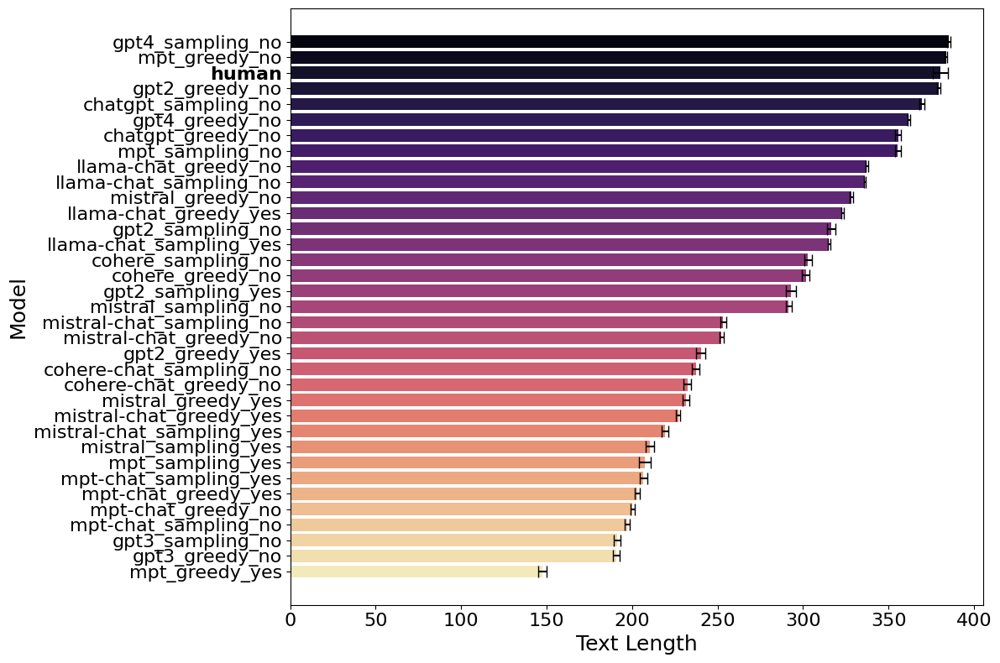

Saved plot: raid_result/mean_Text_Length_news_barplot.pdf


/tmp/ipykernel_23253/2232322777.py:39: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  ax = sns.barplot(


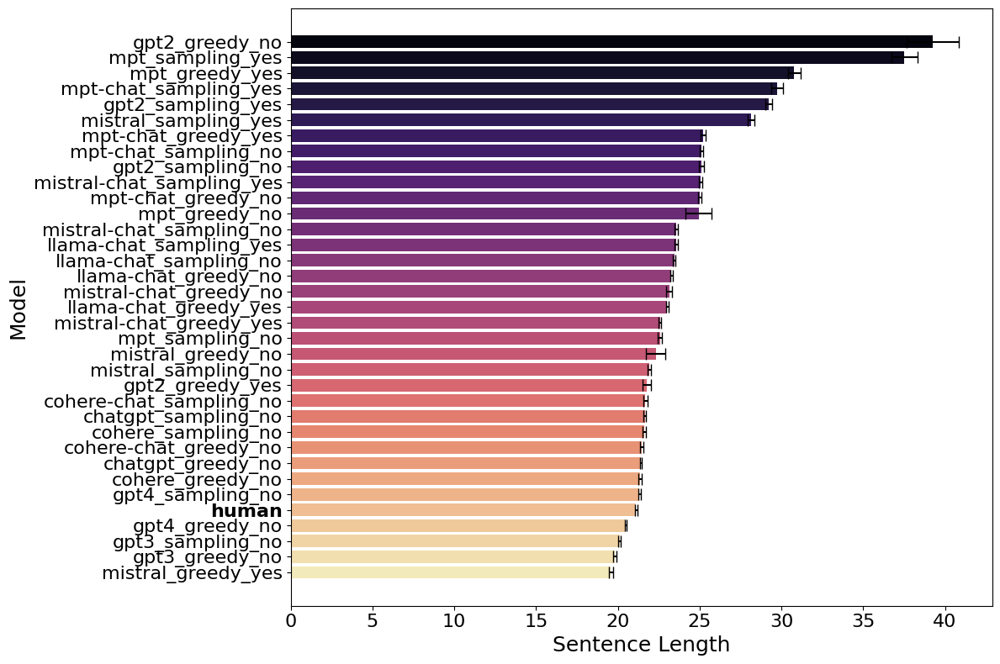

Saved plot: raid_result/mean_Avg_Sentence_Length_news_barplot.pdf


/tmp/ipykernel_23253/2232322777.py:39: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  ax = sns.barplot(


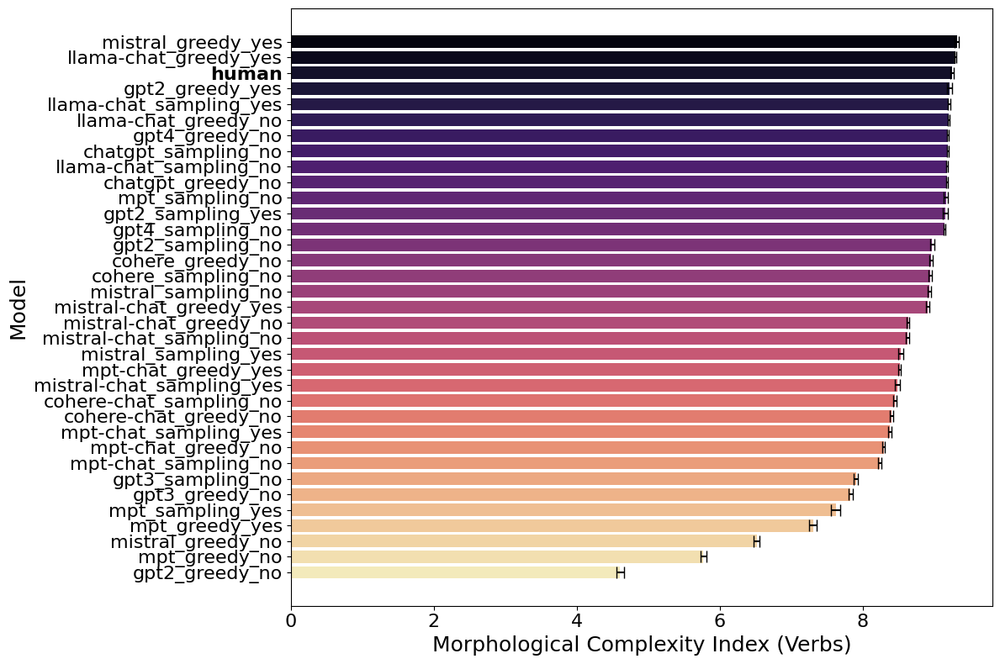

Saved plot: raid_result/mean_MCI_VERB_news_barplot.pdf


/tmp/ipykernel_23253/2232322777.py:39: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  ax = sns.barplot(


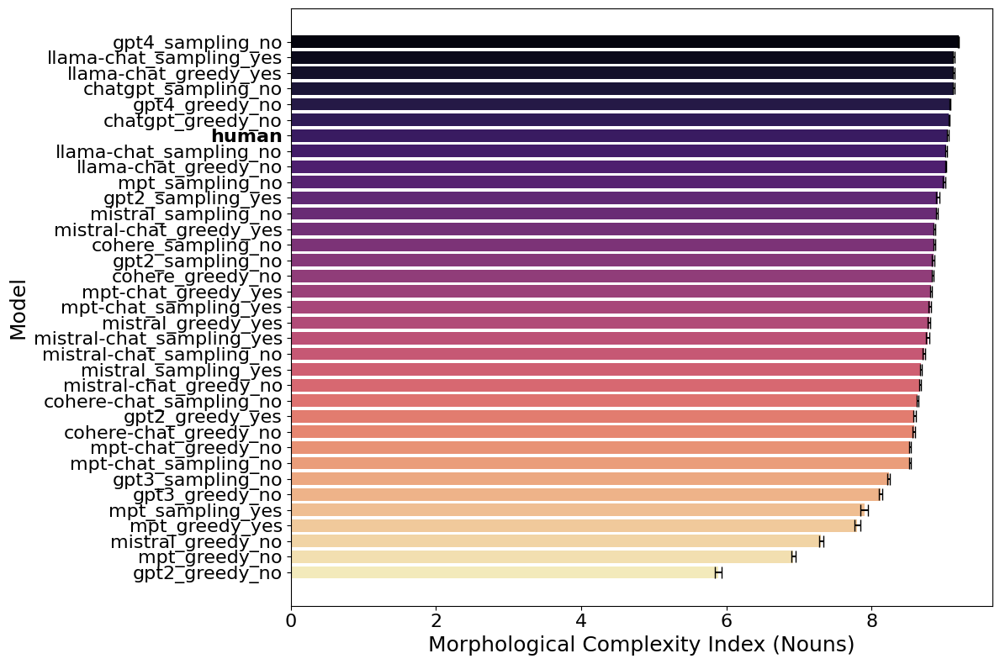

Saved plot: raid_result/mean_MCI_NOUN_news_barplot.pdf


/tmp/ipykernel_23253/2232322777.py:39: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  ax = sns.barplot(


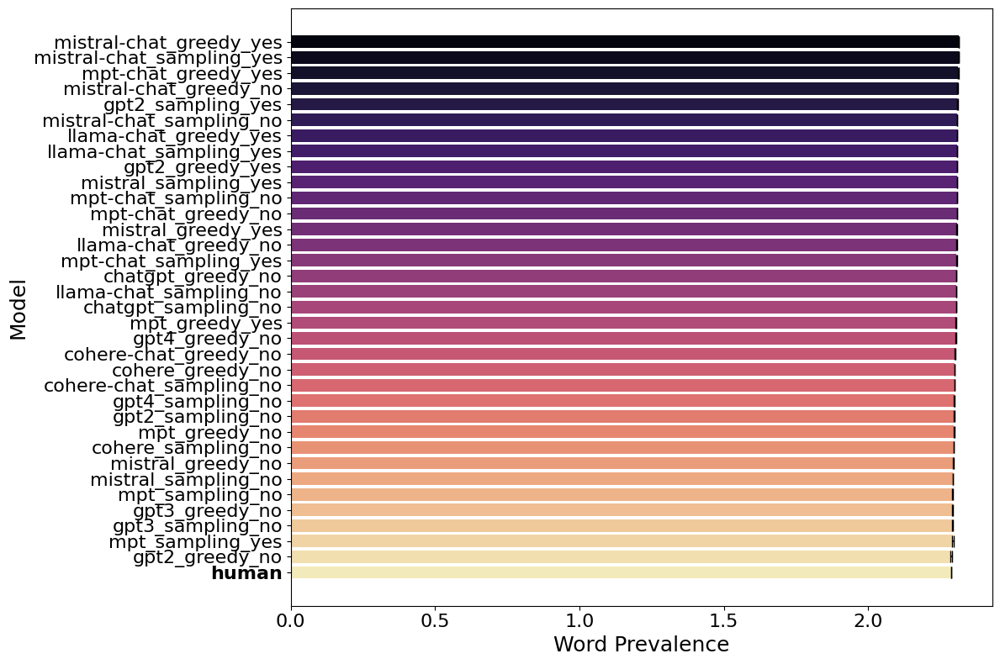

Saved plot: raid_result/mean_Average_Prevalence_news_barplot.pdf


/tmp/ipykernel_23253/2232322777.py:39: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  ax = sns.barplot(


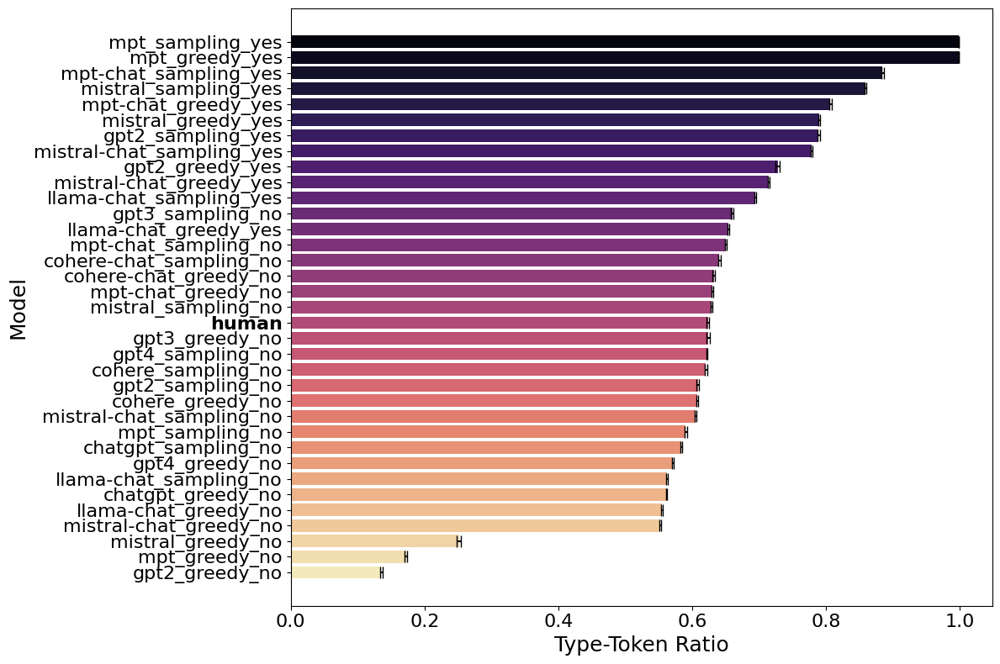

Saved plot: raid_result/mean_simp_ttr_news_barplot.pdf


/tmp/ipykernel_23253/2232322777.py:39: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  ax = sns.barplot(


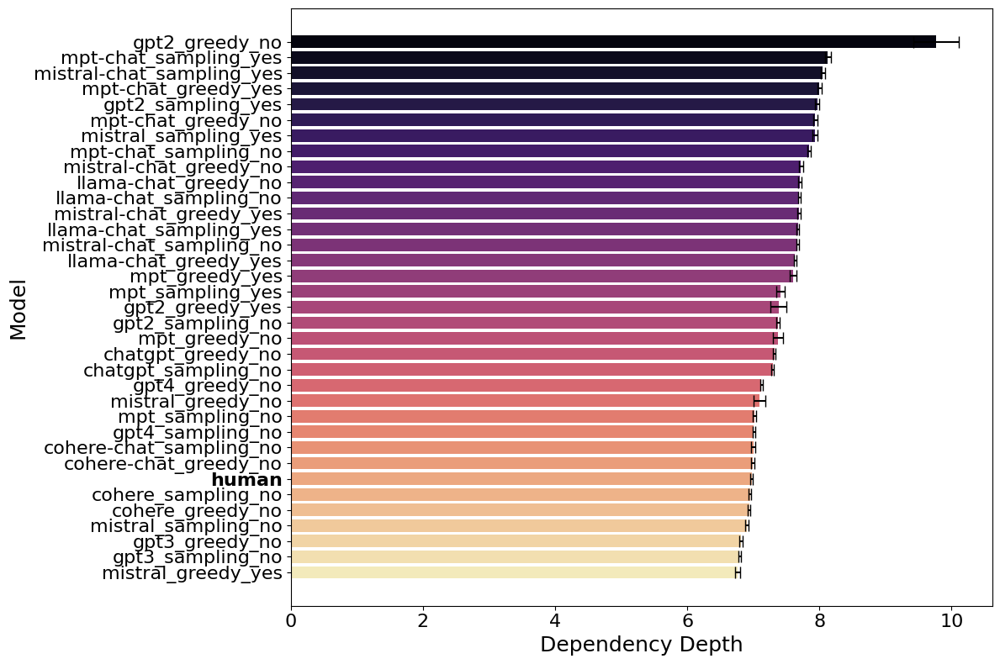

Saved plot: raid_result/mean_Syntactic_Depth_news_barplot.pdf


/tmp/ipykernel_23253/2232322777.py:39: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  ax = sns.barplot(


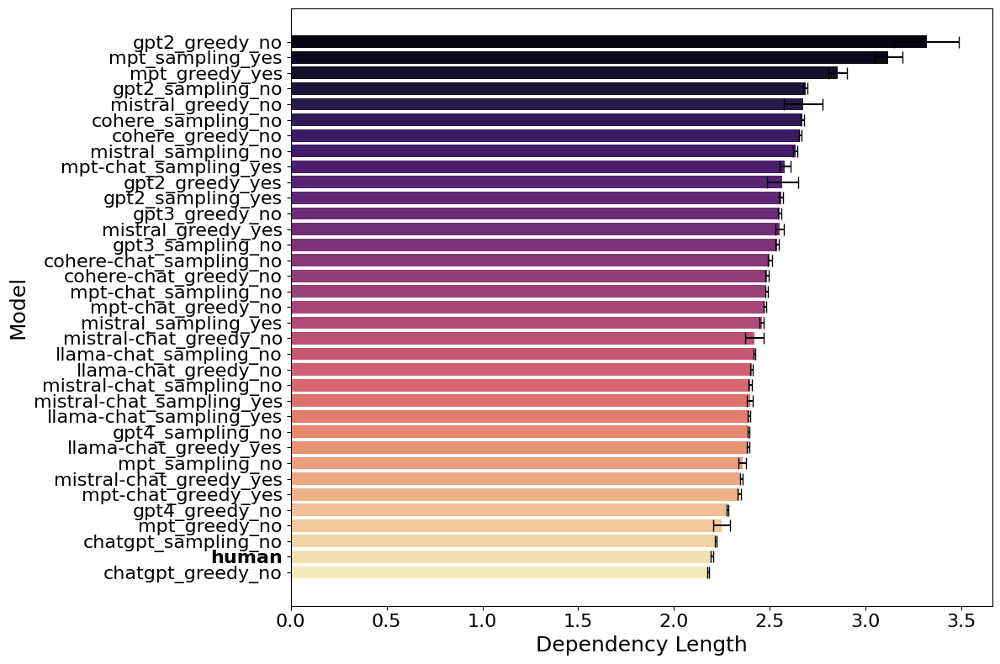

Saved plot: raid_result/mean_Average_Dependency_Length_news_barplot.pdf


/tmp/ipykernel_23253/2232322777.py:39: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  ax = sns.barplot(


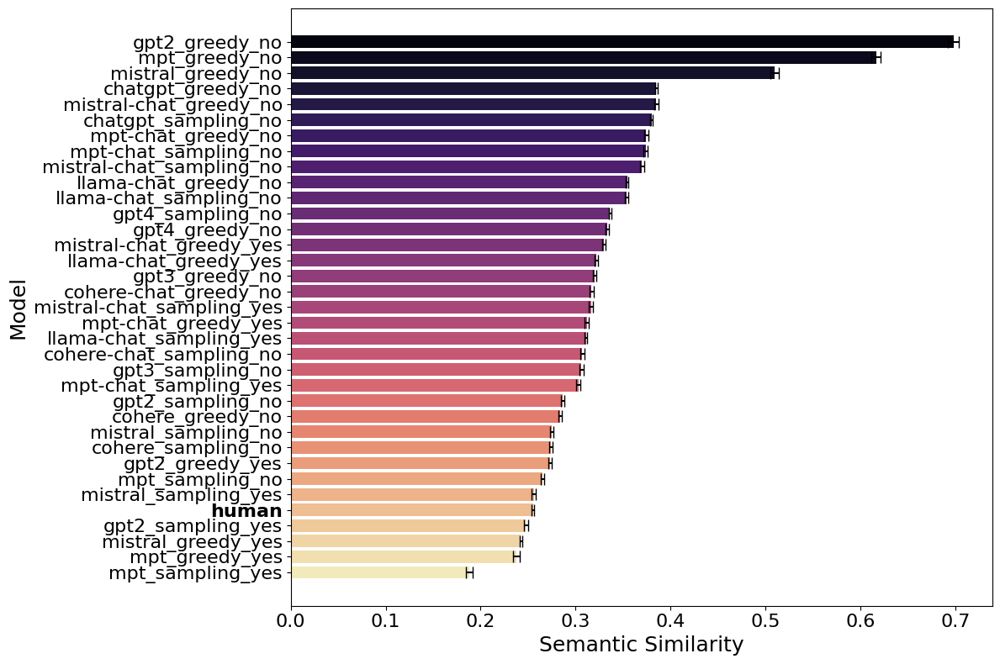

Saved plot: raid_result/mean_Semantic_similarity_news_barplot.pdf


/tmp/ipykernel_23253/2232322777.py:39: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  ax = sns.barplot(


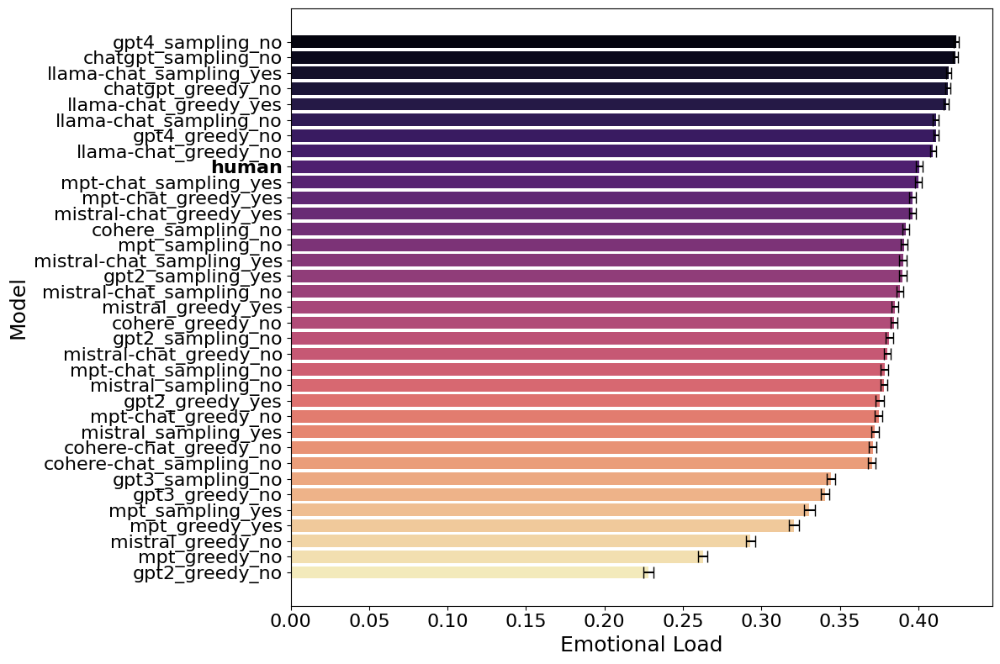

Saved plot: raid_result/mean_Average_Emotion_news_barplot.pdf


In [27]:
# Filter dataset to only include news domain
news_df = df[df["domain"].str.lower() == "news"]

# Define the mapping dictionary (make sure to include commas between entries)
feature_name_mapping = {
    "Text_Length": "Text Length",
    "Avg_Sentence_Length": "Sentence Length",
    "MCI_VERB": "Morphological Complexity Index (Verbs)",
    "MCI_NOUN": "Morphological Complexity Index (Nouns)",
    "Average_Prevalence": "Word Prevalence",
    "simp_ttr": "Type-Token Ratio",
    "Syntactic_Depth": "Dependency Depth",
    "Average_Dependency_Length": "Dependency Length",
    "Semantic_similarity": "Semantic Similarity",
    "Average_Emotion": "Emotional Load"
}

features = list(feature_name_mapping.keys())

# ---------------------------
# Compute mean values per model for all features within the news domain
# ---------------------------
mean_features_news_df = news_df.groupby("model")[features].mean().reset_index()

# Compute standard error for each feature per model (SE = std / sqrt(n))
error_features_news_df = news_df.groupby("model")[features].agg(lambda x: x.std() / np.sqrt(x.count())).reset_index()

# ---------------------------
# Generate and save bar plots for each feature within the news domain
# ---------------------------
for feat in features:
    # Sort models by mean feature value in descending order
    sorted_mean = mean_features_news_df.sort_values(by=feat, ascending=False).reset_index(drop=True)
    
    # Align error values with the sorted order using 'model' as key
    sorted_error = error_features_news_df.set_index("model").loc[sorted_mean["model"], feat].reset_index(drop=True)
    
    plt.figure(figsize=(12, 8))
    ax = sns.barplot(
        data=sorted_mean,
        y="model",       # Models on the y-axis (horizontal bar plot)
        x=feat,          # Mean feature value on the x-axis
        palette="magma",
        ci=None         # Disable Seaborn's built-in error bars
    )
    
    # Add horizontal error bars at the right end of each bar
    for bar, err in zip(ax.patches, sorted_error):
        x_right = bar.get_width()  # End of the bar (mean value)
        y_center = bar.get_y() + bar.get_height() / 2.0
        ax.errorbar(x_right, y_center, xerr=err, fmt='none', color='black', capsize=5)
    
    # Increase axis label fonts and tick label sizes
    plt.xlabel(feature_name_mapping[feat], fontsize=18)
    plt.ylabel("Model", fontsize=18)
    ax.tick_params(axis='both', which='major', labelsize=16)
    plt.tight_layout()
    
    # Bold the label for 'human' in the y-axis
    for label in ax.get_yticklabels():
        if label.get_text().strip().lower() == "human":
            label.set_fontweight("bold")
            label.set_color("black")
    
    # Save the plot
    plot_filename = os.path.join(result_dir, f"mean_{feat}_news_barplot.pdf")
    plt.savefig(plot_filename, format="pdf", dpi=300, bbox_inches="tight")
    plt.show()
    print(f"Saved plot: {plot_filename}")

## All features similarity

In [84]:
def permutation_test_centroid_distance(X_human, X_model, n_permutations=1000, random_state=42):
    np.random.seed(random_state)
    centroid_human = np.mean(X_human, axis=0)
    centroid_model = np.mean(X_model, axis=0)
    observed_dist = euclidean(centroid_human, centroid_model)
    
    combined = np.vstack([X_human, X_model])
    n_h = len(X_human)
    n_total = len(combined)
    
    perm_dists = []
    for i in range(n_permutations):
        idx = np.random.permutation(n_total)
        perm_human = combined[idx[:n_h]]
        perm_model = combined[idx[n_h:]]
        perm_centroid_human = np.mean(perm_human, axis=0)
        perm_centroid_model = np.mean(perm_model, axis=0)
        dist = euclidean(perm_centroid_human, perm_centroid_model)
        perm_dists.append(dist)
    perm_dists = np.array(perm_dists)
    p_value = np.mean(perm_dists >= observed_dist)
    return observed_dist, p_value

df_clean = df.dropna(subset=features).copy()


features = [
    'Text_Length', 'Avg_Sentence_Length', "MCI_VERB", "MCI_NOUN", "Average_Prevalence", "simp_ttr",
    "Syntactic_Depth", "Average_Dependency_Length", "Semantic_similarity", "Average_Emotion"
]


In [85]:
# ---------------------------
# Build Feature Matrix, Standardize, and Run PCA
# ---------------------------
X = df_clean[features].values
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)
df_clean["PC1"] = X_pca[:, 0]
df_clean["PC2"] = X_pca[:, 1]

## variance
print("Variance captured by PC1: {:.2f}%".format(pca.explained_variance_ratio_[0] * 100))
print("Variance captured by PC2: {:.2f}%".format(pca.explained_variance_ratio_[1] * 100))

Variance captured by PC1: 25.44%
Variance captured by PC2: 17.30%


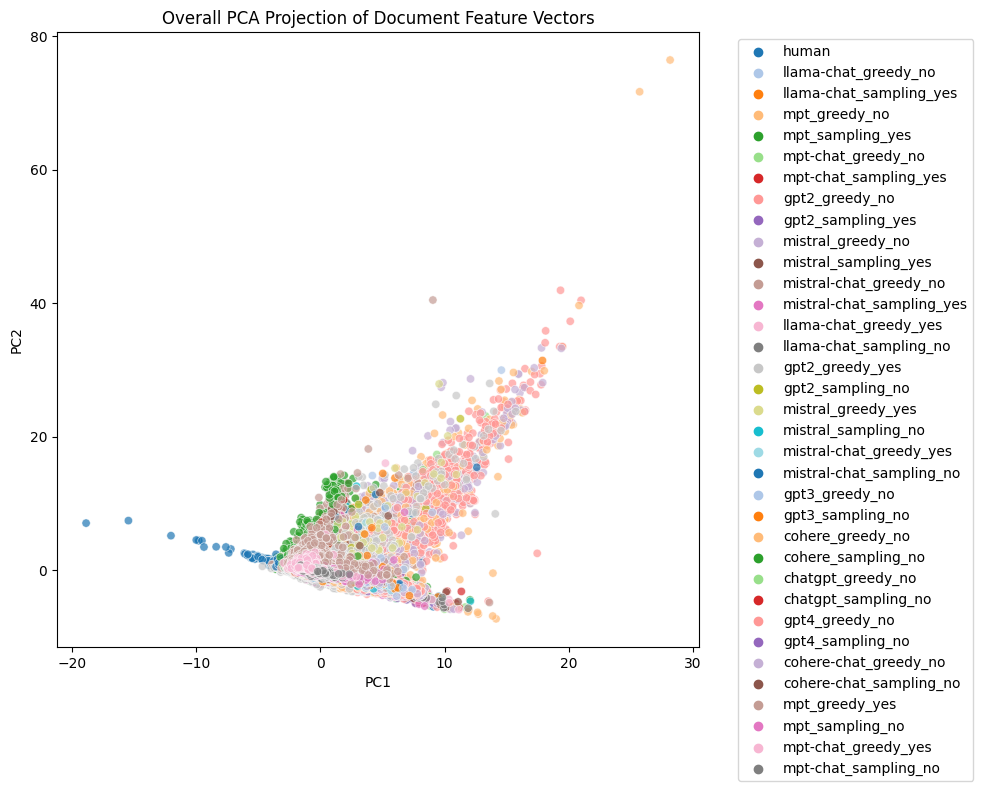

In [86]:
plt.figure(figsize=(10, 8))
sns.scatterplot(data=df_clean, x="PC1", y="PC2", hue="model", palette="tab20", alpha=0.7)
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title("Overall PCA Projection of Document Feature Vectors")
plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()

overall_pca_file = os.path.join(result_dir, "overall_pca_projection.pdf")
plt.savefig(overall_pca_file, format="pdf", dpi=300, bbox_inches="tight")
plt.show()


In [87]:
# Define models from df_clean
models = df_clean["model"].unique()

# ---------------------------
# Overall Permutation Test (Human vs. Each Non-Human Model)
# ---------------------------
overall_results = []
# Extract human PCA data (using case-insensitive search in "model")
X_human = df_clean[df_clean["model"].str.lower().str.contains("human")][["PC1", "PC2"]].values
print("Number of human documents:", len(X_human))

# Loop over each unique model
for model in models:
    if "human" in model.lower():
        continue  # skip human group
    X_model = df_clean[df_clean["model"] == model][["PC1", "PC2"]].values
    print(f"Model {model} has {len(X_model)} documents.")
    if len(X_model) < 2 or len(X_human) < 2:
        print(f"Skipping model {model} due to insufficient samples.")
        continue  # require sufficient samples
    obs_dist, p_val = permutation_test_centroid_distance(X_human, X_model, n_permutations=1000)
    overall_results.append({
        "Model": model,
        "Centroid_Distance": obs_dist,
        "p_value": p_val,
        "Human_n": len(X_human),
        "Model_n": len(X_model)
    })

overall_results_df = pd.DataFrame(overall_results)
overall_csv = os.path.join(result_dir, "overall_centroid_comparison.csv")
overall_results_df.to_csv(overall_csv, index=False)
print("Saved overall centroid comparison to:", overall_csv)

if overall_results_df.empty:
    print("No statistical comparisons produced for overall data. Check if non-human models exist and have sufficient samples.")
else:
    # Define significance threshold
    alpha = 0.05
    diff_models = overall_results_df[overall_results_df["p_value"] < alpha]
    similar_models = overall_results_df[overall_results_df["p_value"] >= alpha]

    print("\nSummary of Overall Comparison:")
    print("Models significantly different from human (p < 0.05):", diff_models["Model"].tolist())
    print("Number of models significantly different from human:", len(diff_models))
    print("Models similar to human (p >= 0.05):", similar_models["Model"].tolist())
    print("Number of models similar to human:", len(similar_models))

Number of human documents: 13360
Model llama-chat_greedy_no has 13371 documents.
Model llama-chat_sampling_yes has 13371 documents.
Model mpt_greedy_no has 12477 documents.
Model mpt_sampling_yes has 13035 documents.
Model mpt-chat_greedy_no has 13353 documents.
Model mpt-chat_sampling_yes has 13331 documents.
Model gpt2_greedy_no has 10625 documents.
Model gpt2_sampling_yes has 13287 documents.
Model mistral_greedy_no has 12414 documents.
Model mistral_sampling_yes has 13367 documents.
Model mistral-chat_greedy_no has 13354 documents.
Model mistral-chat_sampling_yes has 13353 documents.
Model llama-chat_greedy_yes has 13371 documents.
Model llama-chat_sampling_no has 13371 documents.
Model gpt2_greedy_yes has 13172 documents.
Model gpt2_sampling_no has 13326 documents.
Model mistral_greedy_yes has 13363 documents.
Model mistral_sampling_no has 13368 documents.
Model mistral-chat_greedy_yes has 13366 documents.
Model mistral-chat_sampling_no has 13356 documents.
Model gpt3_greedy_no ha

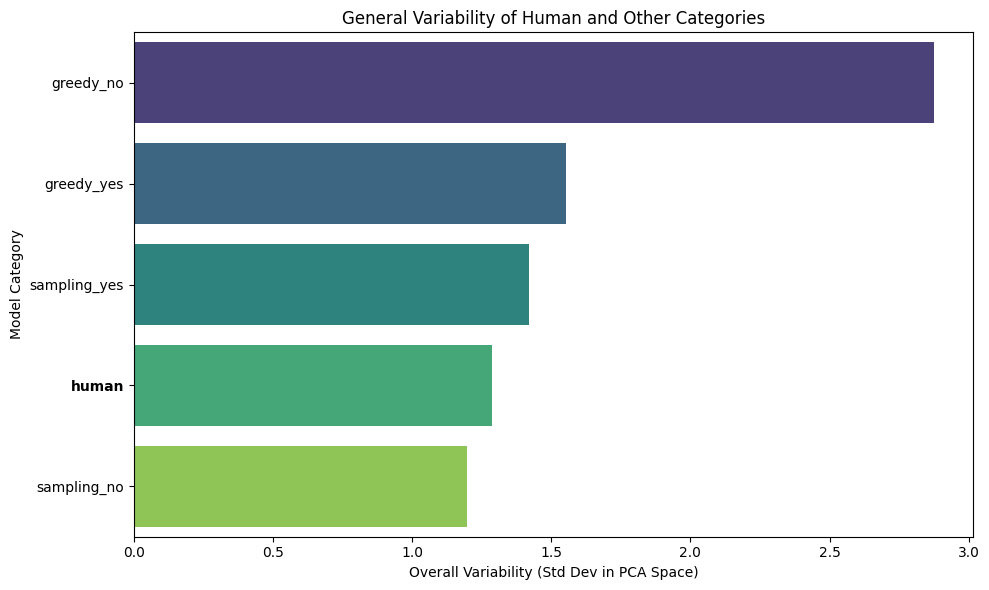

Saved variability plot: results/model_category_variability.pdf


In [88]:
# Compute the standard deviation of PC1 and PC2 for each model_category
category_variability = df_clean.groupby("model_category")[["PC1", "PC2"]].std().reset_index()

# Compute overall variability as the Euclidean norm of the standard deviations.
category_variability["Overall_Variability"] = np.sqrt(category_variability["PC1"]**2 + category_variability["PC2"]**2)

# Sort by overall variability (most variable at the top)
category_variability = category_variability.sort_values(by="Overall_Variability", ascending=False)

# Plot the variability as a horizontal bar plot
plt.figure(figsize=(10, 6))
ax = sns.barplot(
    data=category_variability,
    x="Overall_Variability",
    y="model_category",
    palette="viridis"
)
plt.xlabel("Overall Variability (Std Dev in PCA Space)")
plt.ylabel("Model Category")
plt.title("General Variability of Human and Other Categories")
plt.tight_layout()
# Bold the label for 'human' in the y-axis
for label in ax.get_yticklabels():
    if label.get_text().lower() == "human":
        label.set_fontweight("bold")
        label.set_color("black")
# Save the plot (adjust result_dir as needed)
plot_file = os.path.join(result_dir, "model_category_variability.pdf")
plt.savefig(plot_file, format="pdf", dpi=300, bbox_inches="tight")
plt.show()

print(f"Saved variability plot: {plot_file}")

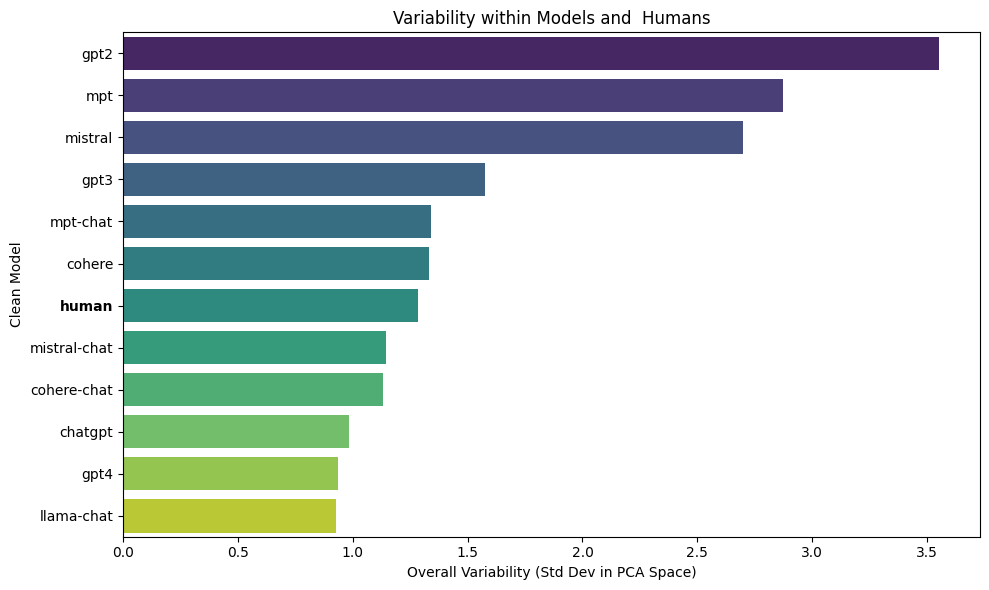

Saved variability plot: results/model_variability_clean_model.pdf


In [89]:
df_clean["clean_model"] = df_clean["model"].apply(clean_model_name)

# ---------------------------
# Compute Variability Within Each Model (and Human)
# ---------------------------
# Group by the cleaned model names and calculate the standard deviation for PC1 and PC2
model_variability = df_clean.groupby("clean_model")[["PC1", "PC2"]].std().reset_index()

# Compute overall variability as the Euclidean norm of the standard deviations.
model_variability["Overall_Variability"] = np.sqrt(model_variability["PC1"]**2 + model_variability["PC2"]**2)

# Sort models by overall variability (from highest to lowest)
model_variability = model_variability.sort_values(by="Overall_Variability", ascending=False)

# ---------------------------
# Plot the Variability as a Horizontal Bar Plot
# ---------------------------
plt.figure(figsize=(10, 6))
ax = sns.barplot(
    data=model_variability,
    x="Overall_Variability",
    y="clean_model",
    palette="viridis"
)
plt.xlabel("Overall Variability (Std Dev in PCA Space)")
plt.ylabel("Clean Model")
plt.title("Variability within Models and  Humans")
plt.tight_layout()
# Bold the label for 'human' in the y-axis
for label in ax.get_yticklabels():
    if label.get_text().lower() == "human":
        label.set_fontweight("bold")
        label.set_color("black")
# Save the plot (adjust result_dir as needed)
variability_plot_file = os.path.join(result_dir, "model_variability_clean_model.pdf")
plt.savefig(variability_plot_file, format="pdf", dpi=300, bbox_inches="tight")
plt.show()

print(f"Saved variability plot: {variability_plot_file}")

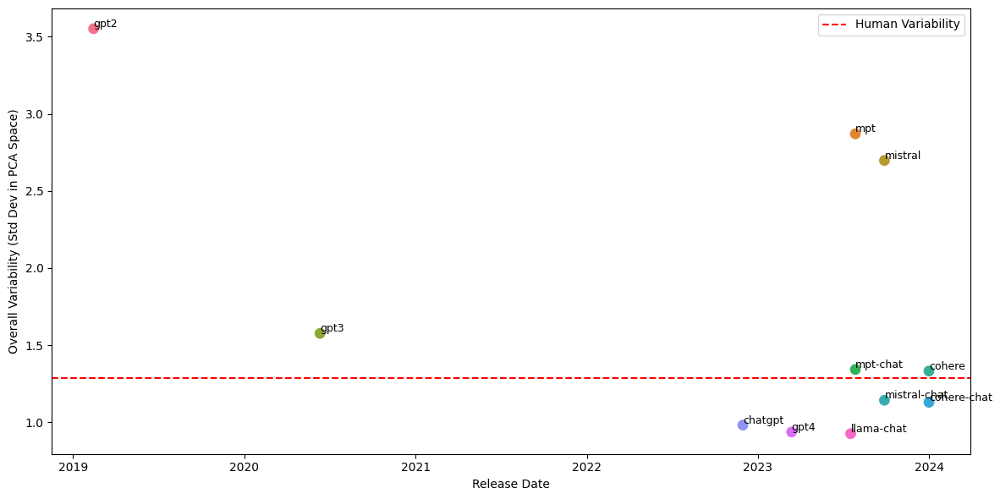

Saved plot: results/model_variability_vs_release_date.pdf


In [90]:
# Dictionary with release dates (using only year or full date if available)
release_dates = {
    "llama-chat":    "2023-07-18",
    "mpt":           "2023-07-28",
    "mpt-chat":      "2023-07-28",
    "gpt2":          "2019-02-14",
    "mistral":       "2023-09-28",
    "mistral-chat":  "2023-09-28",
    "gpt3":          "2020-06-11",
    "cohere":        "2024-01-01",   # using 2024 as year only for Cohere
    "chatgpt":       "2022-11-30",
    "gpt4":          "2023-03-14",
    "cohere-chat":   "2024-01-01"    # using 2024 as well
}

# Map release date to each model based on its clean name.
# For "human", we will assign NaN.
model_variability["release_date_str"] = model_variability["clean_model"].map(lambda x: release_dates.get(x.lower(), None) if x.lower() != "human" else None)
# Convert to datetime; errors='coerce' will convert None to NaT.
model_variability["release_date"] = pd.to_datetime(model_variability["release_date_str"], errors='coerce')

# Separate out human variability for reference
human_row = model_variability[model_variability["clean_model"].str.lower() == "human"]
human_variability = None
if not human_row.empty:
    human_variability = human_row["Overall_Variability"].iloc[0]

# We'll plot non-human models (those with a valid release_date)
nonhuman_data = model_variability[model_variability["release_date"].notna()]

# Create scatter plot: x = release_date, y = Overall_Variability, with model names annotated.
plt.figure(figsize=(12, 6))
sns.scatterplot(data=nonhuman_data, x="release_date", y="Overall_Variability", hue="clean_model", s=100, legend=False)

# Annotate points with model names.
for idx, row in nonhuman_data.iterrows():
    plt.text(row["release_date"], row["Overall_Variability"] + 0.01, row["clean_model"], fontsize=9)

# If human variability is available, add a horizontal dashed red line.
if human_variability is not None:
    plt.axhline(y=human_variability, color='red', linestyle='--', label='Human Variability')
    plt.legend()

plt.xlabel("Release Date")
plt.ylabel("Overall Variability (Std Dev in PCA Space)")
#plt.title("Model Variability vs. Release Date")
plt.tight_layout()

# Save the plot (adjust result_dir as needed)
plot_file = os.path.join(result_dir, "model_variability_vs_release_date.pdf")
plt.savefig(plot_file, format="pdf", dpi=300, bbox_inches="tight")
plt.show()

print(f"Saved plot: {plot_file}")

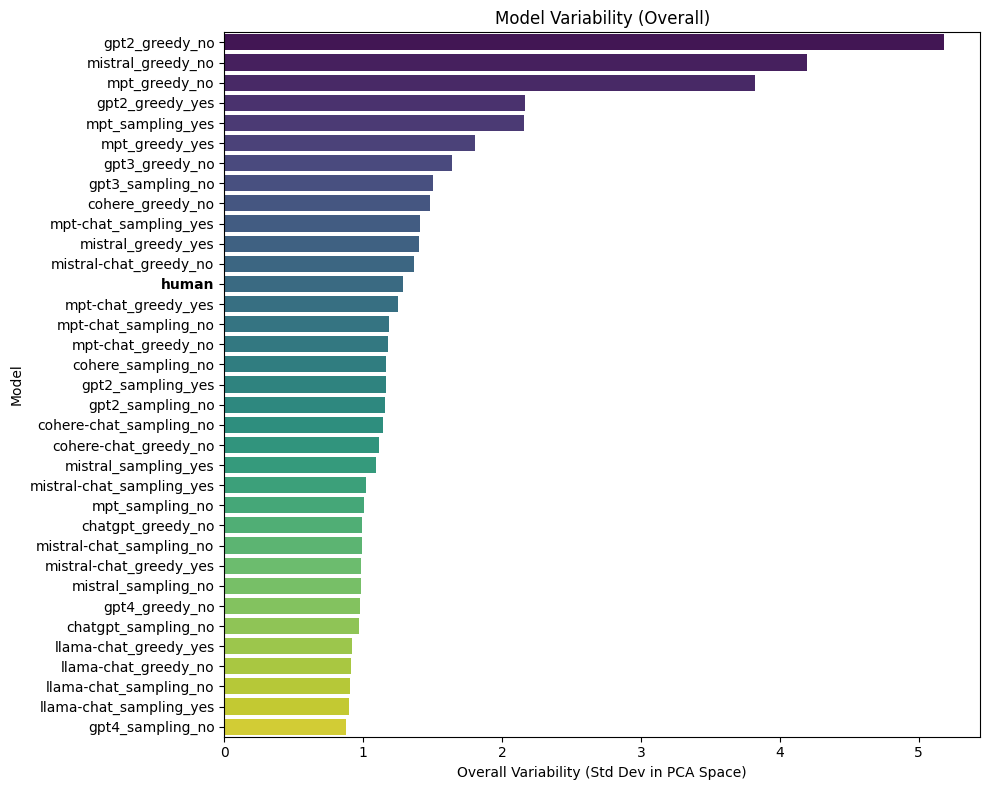

Saved plot: results/model_variability_overall.pdf


In [91]:
# Compute standard deviation of PC1 and PC2 for each model (Overall Variability)
model_variability = df_clean.groupby("model")[["PC1", "PC2"]].std().reset_index()

# Compute overall variability (Euclidean distance in PCA space)
model_variability["Overall_Variability"] = (model_variability["PC1"]**2 + model_variability["PC2"]**2)**0.5

# Sort by overall variability (highest to lowest)
model_variability = model_variability.sort_values(by="Overall_Variability", ascending=False)

# Plot overall variability per model
plt.figure(figsize=(10, 8))
ax = sns.barplot(
    data=model_variability,
    y="model",
    x="Overall_Variability",
    palette="viridis"
)
plt.xlabel("Overall Variability (Std Dev in PCA Space)")
plt.ylabel("Model")
plt.title("Model Variability (Overall)")
plt.tight_layout()
# Bold the label for 'human' in the y-axis
for label in ax.get_yticklabels():
    if label.get_text().lower() == "human":
        label.set_fontweight("bold")
        label.set_color("black")
# Save plot
overall_var_file = os.path.join(result_dir, "model_variability_overall.pdf")
plt.savefig(overall_var_file, format="pdf", dpi=300, bbox_inches="tight")
plt.show()
print(f"Saved plot: {overall_var_file}")

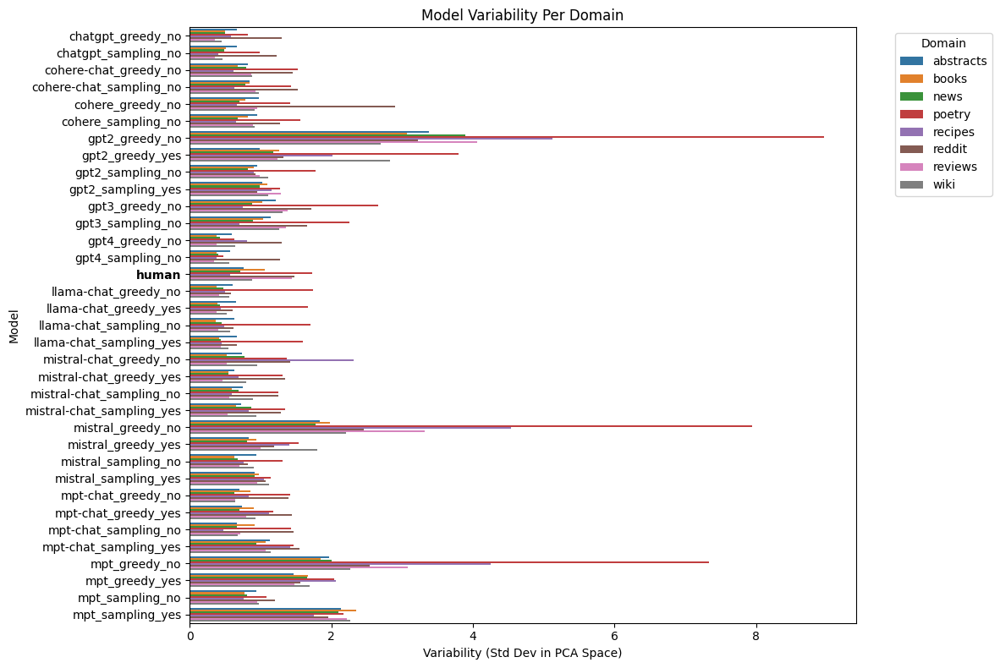

Saved plot: results/model_variability_per_domain.pdf


In [92]:
# Compute standard deviation of PC1 and PC2 per model per domain
model_domain_variability = df_clean.groupby(["model", "domain"])[["PC1", "PC2"]].std().reset_index()

# Compute overall variability (Euclidean distance in PCA space)
model_domain_variability["Overall_Variability"] = (model_domain_variability["PC1"]**2 + model_domain_variability["PC2"]**2)**0.5

# Plot variability per model per domain (Grouped Bar Plot)
plt.figure(figsize=(12, 8))
ax = sns.barplot(
    data=model_domain_variability,
    x="Overall_Variability",
    y="model",
    hue="domain",  # Group by domain
    palette="tab10"
)

plt.xlabel("Variability (Std Dev in PCA Space)")
plt.ylabel("Model")
plt.title("Model Variability Per Domain")
plt.legend(title="Domain", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
# Bold the label for 'human' in the y-axis
for label in ax.get_yticklabels():
    if label.get_text().lower() == "human":
        label.set_fontweight("bold")
        label.set_color("black")
# Save plot
domain_var_file = os.path.join(result_dir, "model_variability_per_domain.pdf")
plt.savefig(domain_var_file, format="pdf", dpi=300, bbox_inches="tight")
plt.show()
print(f"Saved plot: {domain_var_file}")

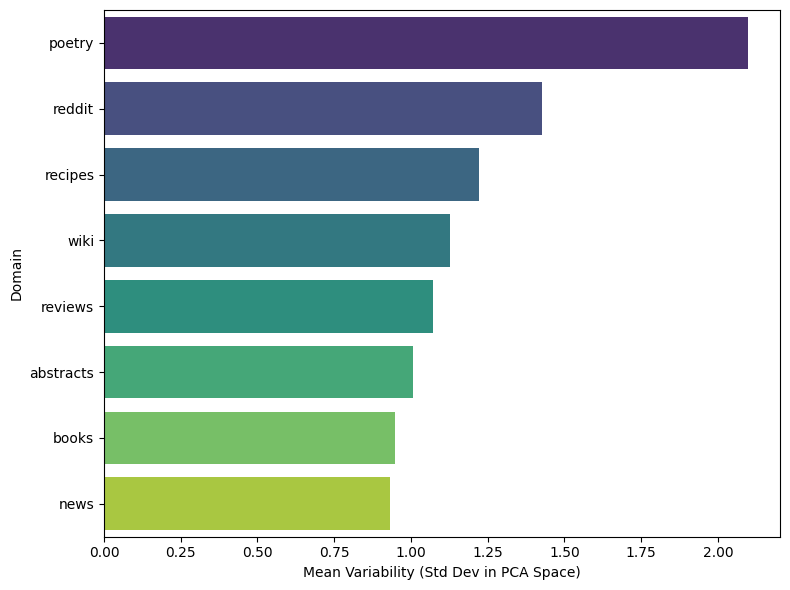

Saved plot: results/domain_variability.pdf


In [93]:
# First, aggregate overall variability per domain (using the mean)
domain_variability = model_domain_variability.groupby("domain")["Overall_Variability"].mean().reset_index()

# Sort domains by variability (from highest to lowest)
domain_variability = domain_variability.sort_values(by="Overall_Variability", ascending=False)

# Plot: y-axis = domain, x-axis = mean overall variability
plt.figure(figsize=(8, 6))
sns.barplot(
    data=domain_variability,
    x="Overall_Variability",
    y="domain",
    palette="viridis"
)
plt.xlabel("Mean Variability (Std Dev in PCA Space)")
plt.ylabel("Domain")
#plt.title("Overall Variability per Domain")
plt.tight_layout()

# Save the plot
domain_var_file = os.path.join(result_dir, "domain_variability.pdf")
plt.savefig(domain_var_file, format="pdf", dpi=300, bbox_inches="tight")
plt.show()
print(f"Saved plot: {domain_var_file}")



In [94]:
# ---------------------------
# News Domain Analysis
# ---------------------------
news_df = df_clean[df_clean["domain"].str.lower() == "news"].copy()
if news_df.empty:
    print("No documents found for the news domain.")
else:
    news_results = []
    X_human_news = news_df[news_df["model"].str.lower().str.contains("human")][["PC1", "PC2"]].values
    print("\nNumber of human documents in news domain:", len(X_human_news))
    
    news_models = news_df["model"].unique()
    for model in news_models:
        if "human" in model.lower():
            continue
        X_model_news = news_df[news_df["model"] == model][["PC1", "PC2"]].values
        print(f"News Domain: Model {model} has {len(X_model_news)} documents.")
        if len(X_model_news) < 2 or len(X_human_news) < 2:
            print(f"Skipping model {model} in news domain due to insufficient samples.")
            continue
        obs_dist, p_val = permutation_test_centroid_distance(X_human_news, X_model_news, n_permutations=1000)
        news_results.append({
            "Model": model,
            "Centroid_Distance": obs_dist,
            "p_value": p_val,
            "Human_n": len(X_human_news),
            "Model_n": len(X_model_news)
        })
    
    news_results_df = pd.DataFrame(news_results)
    news_csv = os.path.join(result_dir, "news_centroid_comparison.csv")
    news_results_df.to_csv(news_csv, index=False)
    print("Saved news domain centroid comparison to:", news_csv)
    
    if news_results_df.empty:
        print("No statistical comparisons produced for news domain data.")
    else:
        diff_news = news_results_df[news_results_df["p_value"] < alpha]
        similar_news = news_results_df[news_results_df["p_value"] >= alpha]
    
        print("\nSummary of News Domain Comparison:")
        print("Models significantly different from human (p < 0.05):", diff_news["Model"].tolist())
        print("Number of models significantly different from human:", len(diff_news))
        print("Models similar to human (p >= 0.05):", similar_news["Model"].tolist())
        print("Number of models similar to human:", len(similar_news))


Number of human documents in news domain: 1780
News Domain: Model llama-chat_greedy_no has 1780 documents.
News Domain: Model llama-chat_sampling_yes has 1780 documents.
News Domain: Model mpt_greedy_no has 1776 documents.
News Domain: Model mpt_sampling_yes has 1722 documents.
News Domain: Model mpt-chat_greedy_no has 1780 documents.
News Domain: Model mpt-chat_sampling_yes has 1780 documents.
News Domain: Model gpt2_greedy_no has 1741 documents.
News Domain: Model gpt2_sampling_yes has 1772 documents.
News Domain: Model mistral_greedy_no has 1770 documents.
News Domain: Model mistral_sampling_yes has 1780 documents.
News Domain: Model mistral-chat_greedy_no has 1780 documents.
News Domain: Model mistral-chat_sampling_yes has 1777 documents.
News Domain: Model llama-chat_greedy_yes has 1780 documents.
News Domain: Model llama-chat_sampling_no has 1780 documents.
News Domain: Model gpt2_greedy_yes has 1777 documents.
News Domain: Model gpt2_sampling_no has 1777 documents.
News Domain:

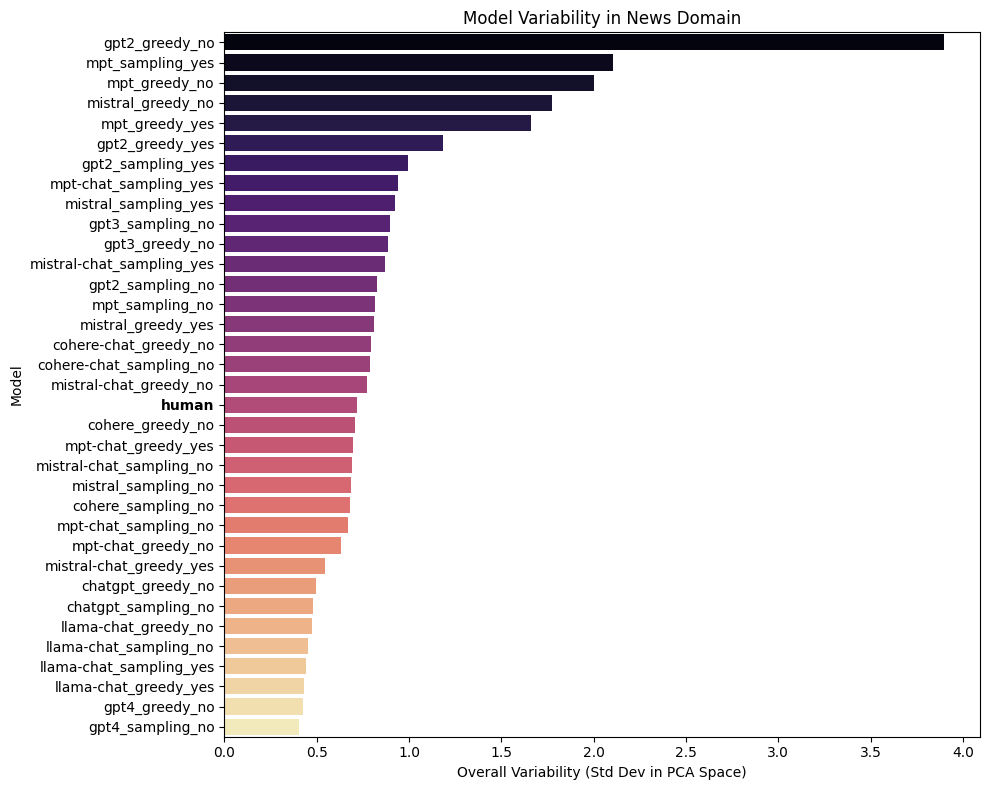

Saved plot: results/model_variability_news.pdf


In [95]:

# Filter for news domain
news_df = df_clean[df_clean["domain"].str.lower() == "news"]

# Compute standard deviation of PC1 and PC2 for each model in the news domain
news_model_variability = news_df.groupby("model")[["PC1", "PC2"]].std().reset_index()

# Compute overall variability (Euclidean distance in PCA space)
news_model_variability["Overall_Variability"] = (news_model_variability["PC1"]**2 + news_model_variability["PC2"]**2)**0.5

# Sort by overall variability (highest to lowest)
news_model_variability = news_model_variability.sort_values(by="Overall_Variability", ascending=False)

# Plot overall variability per model in the news domain
plt.figure(figsize=(10, 8))
ax = sns.barplot(
    data=news_model_variability,
    y="model",
    x="Overall_Variability",
    palette="magma"
)
plt.xlabel("Overall Variability (Std Dev in PCA Space)")
plt.ylabel("Model")
plt.title("Model Variability in News Domain")
plt.tight_layout()
# Bold the label for 'human' in the y-axis
for label in ax.get_yticklabels():
    if label.get_text().lower() == "human":
        label.set_fontweight("bold")
        label.set_color("black")
# Save plot
news_var_file = os.path.join(result_dir, "model_variability_news.pdf")
plt.savefig(news_var_file, format="pdf", dpi=300, bbox_inches="tight")
plt.show()

print(f"Saved plot: {news_var_file}")


In [96]:
# Define the features of interest.
features = [
    'Text_Length', 'Avg_Sentence_Length', "MCI_VERB", "MCI_NOUN", "Average_Prevalence", "simp_ttr",
    "Syntactic_Depth", "Average_Dependency_Length", "Semantic_similarity", "Average_Emotion"
]

# Group the DataFrame by 'model' and compute mean, standard deviation, and count for each feature.
grouped = df.groupby("model")[features].agg(['mean', 'std', 'count'])

# Calculate the standard error (SE = std / sqrt(count)) for each feature.
for feat in features:
    grouped[(feat, 'SE')] = grouped[(feat, 'std')] / np.sqrt(grouped[(feat, 'count')])

# (Optional) Flatten the MultiIndex columns for easier manipulation.
grouped.columns = [f"{feat}_{stat}" for feat, stat in grouped.columns]
grouped = grouped.reset_index()

# Create a new DataFrame to store formatted results.
# Each cell will show "mean ± SE" for that feature.
formatted_data = pd.DataFrame()
formatted_data["model"] = grouped["model"]

for feat in features:
    mean_col = f"{feat}_mean"
    se_col   = f"{feat}_SE"
    formatted_data[feat] = grouped.apply(lambda row: f"{row[mean_col]:.2f} ± {row[se_col]:.2f}", axis=1)

# Print the LaTeX table code.
latex_table = formatted_data.to_latex(index=False, escape=False)
print(latex_table)

\begin{tabular}{lllllllllll}
\toprule
                    model &   Text_Length & Avg_Sentence_Length &    MCI_VERB &    MCI_NOUN & Average_Prevalence &    simp_ttr & Syntactic_Depth & Average_Dependency_Length & Semantic_similarity & Average_Emotion \\
\midrule
        chatgpt_greedy_no & 260.35 ± 0.95 &        19.29 ± 0.06 & 8.60 ± 0.01 & 8.71 ± 0.01 &        2.28 ± 0.00 & 0.62 ± 0.00 &     6.70 ± 0.01 &               2.27 ± 0.00 &         0.38 ± 0.00 &     0.37 ± 0.00 \\
      chatgpt_sampling_no & 272.73 ± 0.96 &        20.00 ± 0.08 & 8.70 ± 0.01 & 8.80 ± 0.01 &        2.28 ± 0.00 & 0.63 ± 0.00 &     6.75 ± 0.01 &               2.32 ± 0.00 &         0.37 ± 0.00 &     0.38 ± 0.00 \\
    cohere-chat_greedy_no & 189.48 ± 0.74 &        21.47 ± 0.11 & 7.91 ± 0.01 & 8.29 ± 0.01 &        2.28 ± 0.00 & 0.63 ± 0.00 &     6.72 ± 0.01 &               2.44 ± 0.04 &         0.33 ± 0.00 &     0.34 ± 0.00 \\
  cohere-chat_sampling_no & 190.51 ± 0.77 &        21.58 ± 0.11 & 7.92 ± 0.01 & 8.31 ± 0.

/tmp/ipykernel_23253/139490030.py:29: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  latex_table = formatted_data.to_latex(index=False, escape=False)


## Classifier

In [97]:
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report

features = [
    'Text_Length', 'Avg_Sentence_Length', "MCI_VERB", "MCI_NOUN", "Average_Prevalence", "simp_ttr",
    "Syntactic_Depth", "Average_Dependency_Length", "Semantic_similarity", "Average_Emotion"
]

# Drop rows with missing values in these features.
df_clean = df.dropna(subset=features).copy()
df_clean["is_human"] = df_clean["model"].str.lower().str.contains("human").astype(int)

# Separate human and non-human groups (for downsampling)
df_human = df_clean[df_clean["is_human"] == 1]
df_nonhuman = df_clean[df_clean["is_human"] == 0]

print("Number of human samples:", len(df_human))
print("Number of non-human samples:", len(df_nonhuman))

# Downsample non-human to match the number of human samples
df_nonhuman_sampled = df_nonhuman.sample(n=len(df_human), random_state=42, replace=False)

# Combine and shuffle to create a balanced dataset
df_balanced = pd.concat([df_human, df_nonhuman_sampled]).sample(frac=1, random_state=42).reset_index(drop=True)

# ---------------------------
# Prepare Feature Matrix and Target (using only numeric features)
# ---------------------------
X = df_balanced[features]
y = df_balanced["is_human"]

# ---------------------------
# Preprocessing: Scale Numeric Features Only
# ---------------------------
preprocessor = Pipeline([
    ("scaler", StandardScaler())
])

# ---------------------------
# Build and Train Logistic Regression Pipeline
# ---------------------------
pipeline = Pipeline([
    ("preprocessor", preprocessor),
    ("clf", LogisticRegression(random_state=42, max_iter=1000))
])

# ---------------------------
# Train-Test Split
# ---------------------------
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

pipeline.fit(X_train, y_train)

# ---------------------------
# Evaluate the Classifier
# ---------------------------
y_pred = pipeline.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy: {:.2f}%".format(accuracy * 100))
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

Number of human samples: 13360
Number of non-human samples: 448841
Accuracy: 60.70%

Classification Report:
              precision    recall  f1-score   support

           0       0.62      0.56      0.59      2672
           1       0.60      0.65      0.62      2672

    accuracy                           0.61      5344
   macro avg       0.61      0.61      0.61      5344
weighted avg       0.61      0.61      0.61      5344




Feature Importance with Mapped Names:
                     feature  coefficient  abs_coefficient  \
7  Average_Dependency_Length    -0.560728         0.560728   
4         Average_Prevalence    -0.555257         0.555257   
6            Syntactic_Depth    -0.354727         0.354727   
8        Semantic_similarity    -0.312235         0.312235   
3                   MCI_NOUN     0.305577         0.305577   
5                   simp_ttr    -0.286261         0.286261   
2                   MCI_VERB     0.217917         0.217917   
1        Avg_Sentence_Length     0.180174         0.180174   
9            Average_Emotion     0.076970         0.076970   
0                Text_Length     0.049867         0.049867   

                           mapped_feature  
7                       Dependency Length  
4                         Word Prevalence  
6                        Dependency Depth  
8                     Semantic Similarity  
3  Morphological Complexity Index (Nouns)  
5             

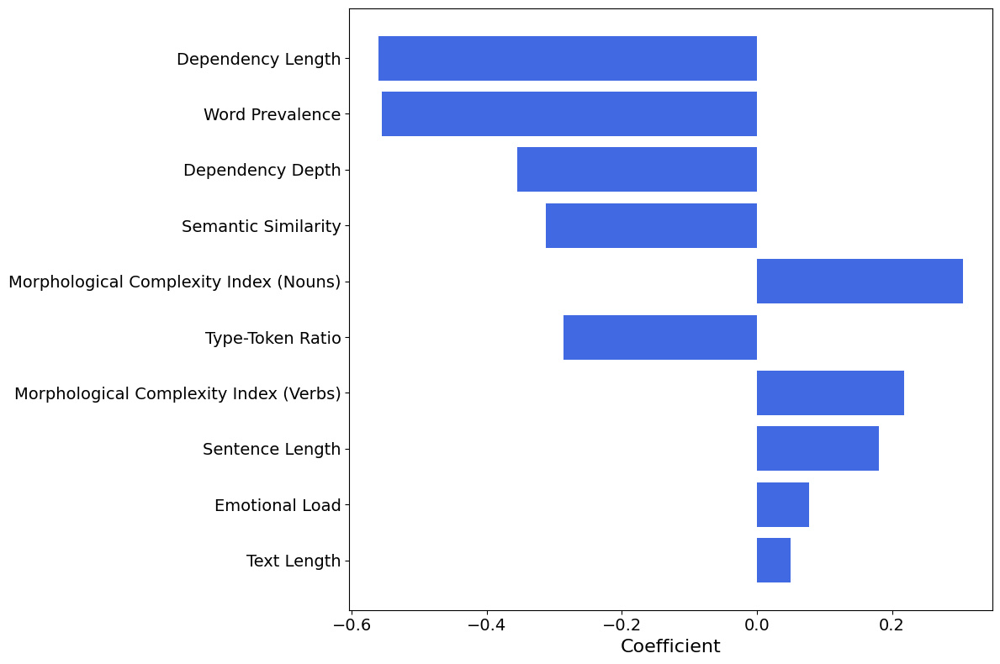

Saved feature importance plot: results/feature_importance.pdf


In [98]:
# Extract coefficients from the trained classifier.
coefs = pipeline.named_steps["clf"].coef_[0]

# Create a DataFrame with the feature names, coefficients, and their absolute values.
df_importance = pd.DataFrame({
    "feature": features,
    "coefficient": coefs,
    "abs_coefficient": np.abs(coefs)
})

# Sort the DataFrame by the absolute value of the coefficients (descending).
df_importance = df_importance.sort_values(by="abs_coefficient", ascending=False)

# Define a mapping from raw feature names to more descriptive names.
feature_name_mapping = {
    "Text_Length": "Text Length",
    "Avg_Sentence_Length": "Sentence Length",
    "MCI_VERB": "Morphological Complexity Index (Verbs)",
    "MCI_NOUN": "Morphological Complexity Index (Nouns)",
    "Average_Prevalence": "Word Prevalence",
    "simp_ttr": "Type-Token Ratio",
    "Syntactic_Depth": "Dependency Depth",
    "Average_Dependency_Length": "Dependency Length",
    "Semantic_similarity": "Semantic Similarity",
    "Average_Emotion": "Emotional Load"
}

# Map the raw feature names to their descriptive names.
df_importance["mapped_feature"] = df_importance["feature"].map(feature_name_mapping).fillna(df_importance["feature"])

print("\nFeature Importance with Mapped Names:")
print(df_importance)

# Define the number of top features to display
top_n = 10

# Increase figure size for better readability
plt.figure(figsize=(12, 8))

# Create horizontal bar plot
ax = plt.barh(df_importance.head(top_n)["mapped_feature"], 
              df_importance.head(top_n)["coefficient"], 
              color='royalblue')

# Invert Y-axis so the most important feature is at the top
plt.gca().invert_yaxis()

# Increase label sizes
plt.xlabel("Coefficient", fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

# Remove title for a cleaner look
plt.tight_layout()

# Define the directory and save path for the PDF
result_dir = "results"  # Adjust or create your desired directory.
if not os.path.exists(result_dir):
    os.makedirs(result_dir)
pdf_filename = os.path.join(result_dir, "feature_importance.pdf")

# Save the plot as a PDF
plt.savefig(pdf_filename, format="pdf", dpi=300, bbox_inches="tight")
plt.show()

print(f"Saved feature importance plot: {pdf_filename}")

In [99]:
# Filter for the news domain (case-insensitive)
news_df = df_clean[df_clean["domain"].str.lower() == "news"].copy()

# Separate human and non-human groups
news_human = news_df[news_df["is_human"] == 1]
news_nonhuman = news_df[news_df["is_human"] == 0]

print("Number of news human samples:", len(news_human))
print("Number of news non-human samples:", len(news_nonhuman))

# Downsample non-human texts to match the number of human samples
news_nonhuman_sampled = news_nonhuman.sample(n=len(news_human), random_state=42, replace=False)

# Combine and shuffle to create a balanced dataset
news_balanced = pd.concat([news_human, news_nonhuman_sampled]).sample(frac=1, random_state=42).reset_index(drop=True)



X = news_balanced[features]
y = news_balanced["is_human"]

# Train-test split (80% training, 20% test; stratified to maintain class balance)
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# Build and train a Logistic Regression pipeline
pipeline = Pipeline([
    ("scaler", StandardScaler()),
    ("clf", LogisticRegression(random_state=42, max_iter=1000))
])

pipeline.fit(X_train, y_train)

# Evaluate the classifier
y_pred = pipeline.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy: {:.2f}%".format(accuracy * 100))
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

Number of news human samples: 1780
Number of news non-human samples: 60375
Accuracy: 78.93%

Classification Report:
              precision    recall  f1-score   support

           0       0.81      0.76      0.78       356
           1       0.77      0.82      0.80       356

    accuracy                           0.79       712
   macro avg       0.79      0.79      0.79       712
weighted avg       0.79      0.79      0.79       712




Feature Importance for News Domain Classifier (with mapped names):
                     feature  coefficient  abs_coefficient  \
7  Average_Dependency_Length    -2.253785         2.253785   
8        Semantic_similarity    -1.546221         1.546221   
0                Text_Length     0.759574         0.759574   
4         Average_Prevalence    -0.700347         0.700347   
3                   MCI_NOUN     0.467192         0.467192   
6            Syntactic_Depth    -0.396573         0.396573   
5                   simp_ttr    -0.353884         0.353884   
1        Avg_Sentence_Length     0.160919         0.160919   
9            Average_Emotion    -0.143903         0.143903   
2                   MCI_VERB     0.060950         0.060950   

                           mapped_feature  
7                       Dependency Length  
8                     Semantic Similarity  
0                             Text Length  
4                         Word Prevalence  
3  Morphological Complexity I

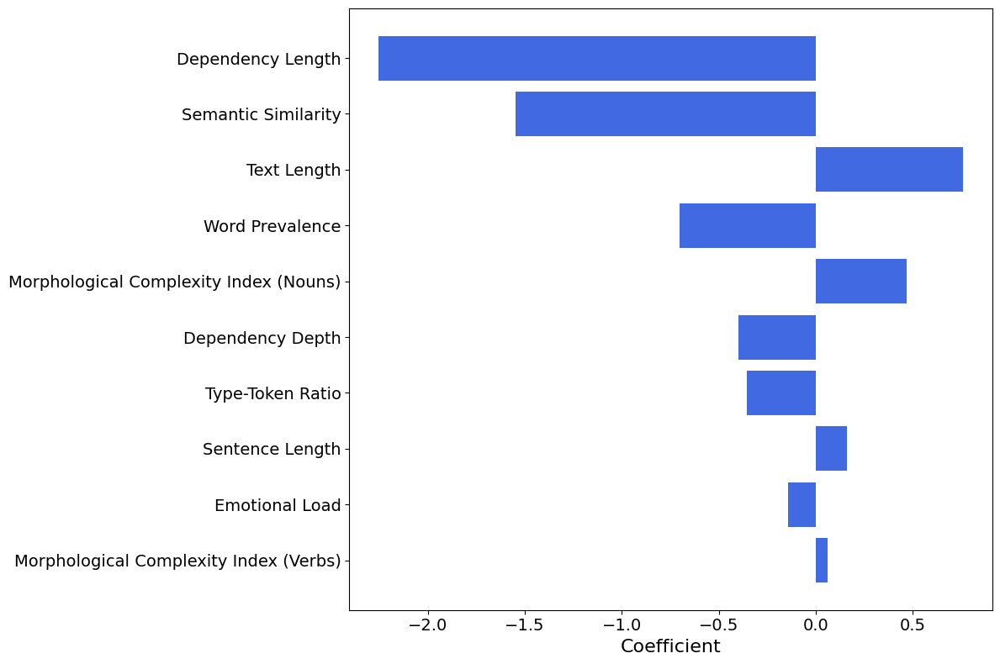

Saved feature importance plot: results/news_feature_importance.pdf


In [100]:
# Get the coefficients from the trained Logistic Regression model.
coefs = pipeline.named_steps["clf"].coef_[0]

# Create a DataFrame with the feature names, coefficients, and absolute coefficients.
df_importance = pd.DataFrame({
    "feature": features,
    "coefficient": coefs,
    "abs_coefficient": np.abs(coefs)
})

# Sort the DataFrame by the absolute value of the coefficients in descending order.
df_importance = df_importance.sort_values(by="abs_coefficient", ascending=False)

# Define a mapping from raw feature names to more descriptive names.
feature_name_mapping = {
    "Text_Length": "Text Length",
    "Avg_Sentence_Length": "Sentence Length",
    "MCI_VERB": "Morphological Complexity Index (Verbs)",
    "MCI_NOUN": "Morphological Complexity Index (Nouns)",
    "Average_Prevalence": "Word Prevalence",
    "simp_ttr": "Type-Token Ratio",
    "Syntactic_Depth": "Dependency Depth",
    "Average_Dependency_Length": "Dependency Length",
    "Semantic_similarity": "Semantic Similarity",
    "Average_Emotion": "Emotional Load"
}

# Map the raw feature names to descriptive names; if no mapping exists, keep the original name.
df_importance["mapped_feature"] = df_importance["feature"].map(feature_name_mapping).fillna(df_importance["feature"])

print("\nFeature Importance for News Domain Classifier (with mapped names):")
print(df_importance)

# ---------------------------
# Plot the Top 10 Important Features
# ---------------------------

top_n = 10

# Increase figure size for better readability
plt.figure(figsize=(12, 8))

# Create horizontal bar plot
ax = plt.barh(df_importance.head(top_n)["mapped_feature"], 
              df_importance.head(top_n)["coefficient"], 
              color='royalblue')

# Invert Y-axis so the most important feature is at the top
plt.gca().invert_yaxis()

# Increase font sizes for better readability
plt.xlabel("Coefficient", fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

# Remove title for a cleaner look
plt.tight_layout()

# Create a directory for saving the plot if it doesn't exist
result_dir = "results"
if not os.path.exists(result_dir):
    os.makedirs(result_dir)

# Define the save path for the PDF
pdf_filename = os.path.join(result_dir, "news_feature_importance.pdf")

# Save the plot as a PDF
plt.savefig(pdf_filename, format="pdf", dpi=300, bbox_inches="tight")
plt.show()

print(f"Saved feature importance plot: {pdf_filename}")

## PLOTS FEATURES

In [ ]:




# Extract unique categories while ensuring "human" appears first
categories = ["sampling_yes", "sampling_no", "greedy_yes", "greedy_no"]
categories = [cat for cat in categories if cat in df["model_category"].unique()]

def plot_violin_by_category(df, category, feature):
    """
    Plots a violin plot for a feature grouped by model category.
    """
    subset_df = df[df["model_category"].isin(["human", category])].copy()
    if subset_df.empty:
        print(f"Skipping {category} because there is no data.")
        return

    # Apply the cleaning function to the model names for x-axis labels
    subset_df["clean_model"] = subset_df["model"].apply(clean_model_name)

    unique_models = ["human"] + sorted(set(subset_df["clean_model"].dropna().unique()) - {"human"})
    colorblind_palette = sns.color_palette("colorblind", len(unique_models))
    model_to_color = {model: colorblind_palette[i] for i, model in enumerate(unique_models)}

    subset_df["clean_model"] = pd.Categorical(subset_df["clean_model"], categories=unique_models, ordered=True)

    plt.figure(figsize=(10, 6))
    sns.violinplot(x="clean_model", y=feature, data=subset_df, palette=model_to_color, inner="quartile")
    plt.ylabel(feature)
    plt.xlabel("")
    plt.xticks(rotation=85)
    plt.grid(False, axis='y')
    plt.tight_layout()

    # Add a clear title including the feature name and category
    plt.title(f"{feature} Distribution: Human vs {category.replace('_', ' ').title()}")

    # Save the plot with the updated title
    filename = f"{result_dir}/raid_violin_{feature.lower()}_{category}.pdf"
    plt.savefig(filename)
    plt.show()
    print(f"Saved: {filename}")


# Generate violin plots for all categories and features
for category in categories:
    for feature in features:
        plot_violin_by_category(df, category, feature)

print("Violin plots generated and saved.")

In [ ]:
# Extract unique domains
domains = df["domain"].dropna().unique()

# Function to clean model names by removing decoding and penalty
def clean_model_name(model):
    """
    Extracts only the base model name, removing decoding and penalty settings.
    """
    return model.split("_")[0]  # Assumes model names are structured as "base_decoding_penalty"

# Function to generate violin plots per domain and model category
def plot_violin_by_domain_category(df, domain, category, feature):
    """
    Plots a violin plot for a feature grouped by model category within a domain.
    """
    subset_df = df[(df["model_category"].isin(["human", category])) & (df["domain"] == domain)].copy()
    if subset_df.empty:
        print(f"Skipping {category} in domain {domain} because there is no data.")
        return

    # Apply the cleaning function to the model names
    subset_df["clean_model"] = subset_df["model"].apply(clean_model_name)

    unique_models = ["human"] + sorted(set(subset_df["clean_model"].dropna().unique()) - {"human"})
    colorblind_palette = sns.color_palette("colorblind", len(unique_models))
    model_to_color = {model: colorblind_palette[i] for i, model in enumerate(unique_models)}

    subset_df["clean_model"] = pd.Categorical(subset_df["clean_model"], categories=unique_models, ordered=True)

    plt.figure(figsize=(10, 6))
    sns.violinplot(x="clean_model", y=feature, data=subset_df, palette=model_to_color, inner="quartile")
    plt.ylabel(feature)
    plt.xlabel("")
    plt.xticks(rotation=85)
    plt.grid(False, axis='y')
    plt.tight_layout()

    # Add the domain name explicitly in the title
    plt.title(f"{feature} Distribution in {domain} (Human vs {category})")

    # Ensure a domain-specific result directory
    domain_dir = f"{result_dir}/{domain}"
    if not os.path.exists(domain_dir):
        os.makedirs(domain_dir)

    filename = f"{domain_dir}/raid_violin_{feature.lower()}_{category}.pdf"
    plt.savefig(filename)
    plt.show()
    print(f"Saved: {filename}")

# Generate violin plots for each domain, model category, and feature
features = [
    "MCI_VERB", "MCI_NOUN", "Average_Prevalence", "simp_ttr", 
    "Syntactic_Depth", "Average_Dependency_Length", "Semantic_similarity", "Average_Emotion"
]

for domain in domains:
    for category in categories:
        for feature in features:
            plot_violin_by_domain_category(df, domain, category, feature)

print("Violin plots per domain, model group, and feature generated and saved.")

#### Missing Words

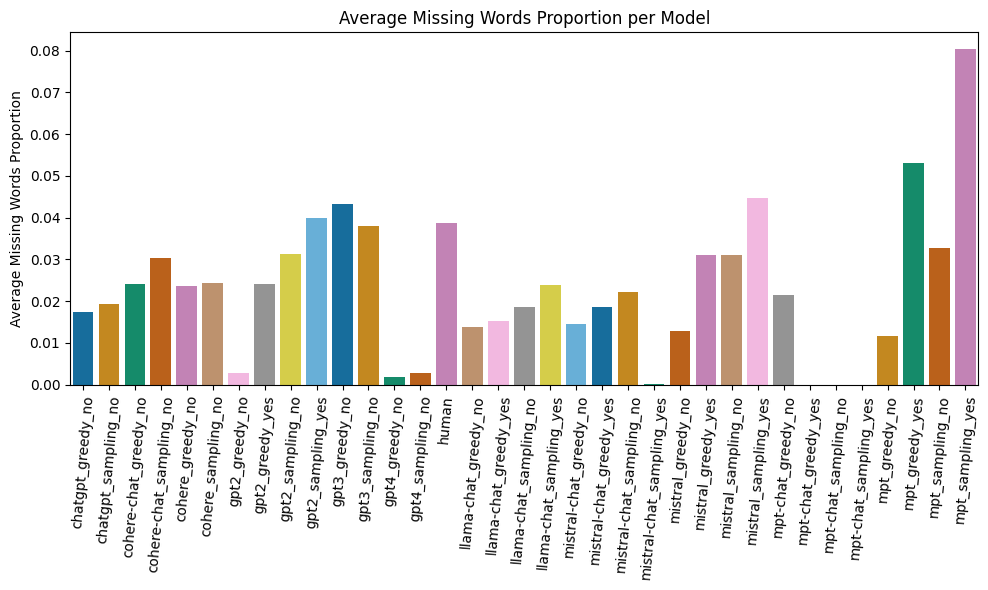

In [19]:
# 1. Calculate the total number of words per text
df['Total_Words'] = df['Text'].apply(lambda x: len(str(x).split()))

# 2. Calculate the proportion of missing words for each row
df['Missing_Words_Proportion'] = df['Missing_Words_Count'] / df['Total_Words']

# 3. Compute the average missing words proportion per model
avg_missing_words_per_model = df.groupby('model')['Missing_Words_Proportion'].mean().reset_index()

# 4. Set up a colorblind-friendly palette for the models
unique_models = avg_missing_words_per_model['model'].unique()
colorblind_palette = sns.color_palette("colorblind", len(unique_models))
model_to_color = {model: colorblind_palette[i % len(colorblind_palette)] for i, model in enumerate(unique_models)}

# 5. Create a bar plot to show the average missing words proportion per model
plt.figure(figsize=(10, 6))
sns.barplot(x='model', y='Missing_Words_Proportion', data=avg_missing_words_per_model,
            palette=model_to_color)
plt.ylabel('Average Missing Words Proportion')
plt.xlabel('')
plt.title('Average Missing Words Proportion per Model')
plt.xticks(rotation=85)
plt.tight_layout()
plt.savefig('avg_missing_words.pdf')
plt.show()

### Syntactic Complexity

#### Optimality of dependencies

# Emotionality: negative emotions

In [270]:
# Group emotions into negative and positive categories
negative_emotions = ['anger', 'fear', 'sadness']
positive_emotions = ['joy']

# Calculate the average negative and positive emotion intensity for each model
df['Negative Emotion'] = df[negative_emotions].mean(axis=1)
df['Positive Emotion'] = df[positive_emotions].mean(axis=1)



In [272]:
# Calculate the mean and SEM for negative and positive emotions per model
avg_emotion_per_model_total = df.groupby('model')[['Negative Emotion', 'Positive Emotion']].mean()
se_emotion_per_model_total = df.groupby('model')[['Negative Emotion', 'Positive Emotion']].sem()



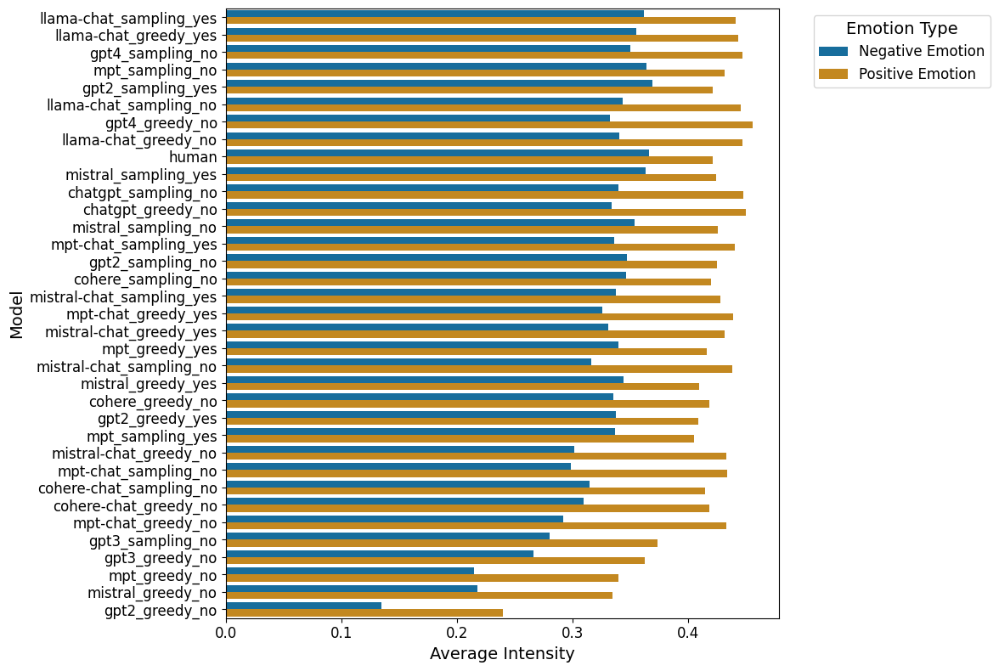

Saved plot: results/raid_negative_positive_emotion_intensity_per_model_total.pdf


In [277]:
# Convert to long format for seaborn
avg_emotion_per_model_long_total = avg_emotion_per_model_total.reset_index().melt(id_vars='model', var_name='Emotion_Type', value_name='Intensity')
se_emotion_per_model_long_total = se_emotion_per_model_total.reset_index().melt(id_vars='model', var_name='Emotion_Type', value_name='SE')

# Merge average and SE dataframes
emotion_data_long_total = avg_emotion_per_model_long_total.merge(se_emotion_per_model_long_total, on=['model', 'Emotion_Type'])

# Sort models by average intensity for better visualization
model_order = emotion_data_long_total.groupby("model")["Intensity"].mean().sort_values(ascending=False).index
emotion_data_long_total["model"] = pd.Categorical(emotion_data_long_total["model"], categories=model_order, ordered=True)

# Create figure
plt.figure(figsize=(12, 8))

# Plot bar chart with colorblind-friendly palette
ax = sns.barplot(
    x='Intensity', 
    y='model', 
    hue='Emotion_Type', 
    data=emotion_data_long_total, 
    palette='colorblind', 
    errorbar=None
)


# Adjust labels and title
plt.xlabel('Average Intensity', fontsize=14)
plt.ylabel('Model', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

# Remove grid lines
plt.grid(False)

# Move legend outside the plot
plt.legend(title="Emotion Type", fontsize=12, title_fontsize=14, bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()

# Save plot as PDF
plot_filename = os.path.join(result_dir, "raid_negative_positive_emotion_intensity_per_model_total.pdf")
plt.savefig(plot_filename, format="pdf", dpi=300, bbox_inches="tight")
plt.show()

print(f"Saved plot: {plot_filename}")

# Style

## PCA over Style

with the pca on style we measure the variability of style within humans and other models
we then compare similarity by euclidean distance

In [65]:
dff = pd.read_csv("raid_style.csv", encoding="utf-8")
df["Style_Embedding"] = dff["Style_Embedding"]

In [66]:
df.head()

,id,adv_source_id,source_id,model,decoding,repetition_penalty,attack,domain,title,prompt,...,surprise,trust,Average_Emotion,model_category,simp_ttr,is_human,Style_Embedding,Cluster,PC1,PC2
0,e5e058ce-be2b-459d-af36-32532aaba5ff,e5e058ce-be2b-459d-af36-32532aaba5ff,e5e058ce-be2b-459d-af36-32532aaba5ff,human,NaN,NaN,none,abstracts,FUTURE-AI: Guiding Principles and Consensus Re...,NaN,...,0.000,0.600100,0.233094,human,0.684466,1,"[-0.4209442138671875, 0.18948446214199066, 0.4...",20,-3.496000,-4.981532
1,f95b107b-d176-4af5-90f7-4d0bb20caf93,f95b107b-d176-4af5-90f7-4d0bb20caf93,f95b107b-d176-4af5-90f7-4d0bb20caf93,human,NaN,NaN,none,abstracts,EdgeFlow: Achieving Practical Interactive Segm...,NaN,...,0.000,0.536500,0.200969,human,0.773723,1,"[0.025902340188622475, -0.0074435328133404255,...",20,8.893971,-10.624354
2,856d8972-9e3d-4544-babc-0fe16f21e04d,856d8972-9e3d-4544-babc-0fe16f21e04d,856d8972-9e3d-4544-babc-0fe16f21e04d,human,NaN,NaN,none,abstracts,Semi-supervised Contrastive Learning for Label...,NaN,...,0.156,0.478750,0.416917,human,0.619718,1,"[-0.023892248049378395, 0.045352108776569366, ...",20,3.303001,-15.594777
3,fbc8a5ea-90fa-47b8-8fa7-73dd954f1524,fbc8a5ea-90fa-47b8-8fa7-73dd954f1524,fbc8a5ea-90fa-47b8-8fa7-73dd954f1524,human,NaN,NaN,none,abstracts,Combo Loss: Handling Input and Output Imbalanc...,NaN,...,0.602,0.485571,0.414766,human,0.630996,1,"[-0.4700782001018524, 0.3957197368144989, 0.39...",16,-6.067566,-2.104059
4,72c41b8d-0069-4886-b734-a4000ffca286,72c41b8d-0069-4886-b734-a4000ffca286,72c41b8d-0069-4886-b734-a4000ffca286,human,NaN,NaN,none,abstracts,Attention-Based 3D Seismic Fault Segmentation ...,NaN,...,0.367,0.499417,0.388896,human,0.586207,1,"[-0.04926037788391113, 0.004059839993715286, 0...",20,10.401630,-14.682366


In [67]:
def manual_parse_embedding(emb_str):
    """Manually parse embeddings by removing brackets and splitting by comma."""
    emb_str = emb_str.strip()  # Remove leading/trailing spaces
    if emb_str in ["", "[]", "None", "nan"]:  # Handle empty cases
        return None
    emb_str = emb_str.replace("[", "").replace("]", "")  # Remove brackets
    try:
        return [float(x) for x in emb_str.split(",")]  # Convert to list of floats
    except ValueError:
        print(f"Error converting to float: {emb_str}")
        return None

# Apply the manual parsing function
df["Style_Embedding"] = df["Style_Embedding"].apply(manual_parse_embedding)

# Verify the types
print(df["Style_Embedding"].apply(type).value_counts())

<class 'list'>    467985
Name: Style_Embedding, dtype: int64


Number of unique generating models found: 35
Cluster distribution:
16    75568
10    50791
3     43214
31    24995
23    19191
17    18455
8     18449
7     13759
0     13293
5     13073
26    12117
34    11321
33    10936
32    10435
22     9823
1      9494
30     9049
24     8751
12     8356
18     8231
21     8167
11     7732
13     7351
19     6646
15     5984
4      5796
2      5782
6      5615
27     4609
9      4402
25     4343
28     4304
14     3005
29     2599
20     2349
Name: Cluster, dtype: int64


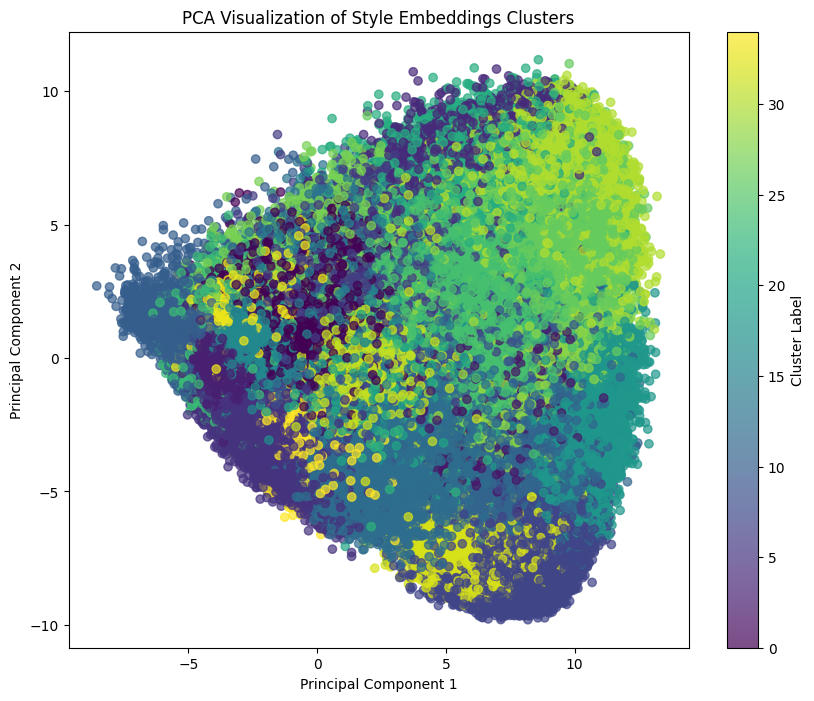

In [68]:

# Convert list of embeddings into a 2D numpy array (samples x embedding_dimension)
embeddings = np.array(df['Style_Embedding'].tolist())
#print(f"Embeddings shape: {embeddings.shape}")

# -------------------------
# 2. Determine Number of Clusters Based on Unique Models
# -------------------------

if 'model' in df.columns:
    unique_models = df['model'].unique()
    n_clusters = len(unique_models)
    print(f"Number of unique generating models found: {n_clusters}")
else:
    # Default to 5 clusters if the "Model" column is not available
    n_clusters = 5
    print(f"No 'Model' column found. Using default n_clusters = {n_clusters}")

# -------------------------
# 3. Clustering with K-Means
# -------------------------

# Initialize and fit the KMeans model with the determined number of clusters
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
cluster_labels = kmeans.fit_predict(embeddings)

# Add the cluster labels to the DataFrame
df['Cluster'] = cluster_labels

print("Cluster distribution:")
print(df['Cluster'].value_counts())

# -------------------------
# 4. Visualization using PCA
# -------------------------

# Reduce the high-dimensional embeddings to 2D using PCA for visualization
pca = PCA(n_components=2)
embeddings_2d = pca.fit_transform(embeddings)

# Create a scatter plot of the 2D embeddings with colors indicating the clusters
plt.figure(figsize=(10, 8))
scatter = plt.scatter(embeddings_2d[:, 0], embeddings_2d[:, 1],
                      c=cluster_labels, cmap="viridis", alpha=0.7)
plt.title("PCA Visualization of Style Embeddings Clusters")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.colorbar(scatter, label="Cluster Label")
plt.show()

Embeddings shape: (467985, 768)


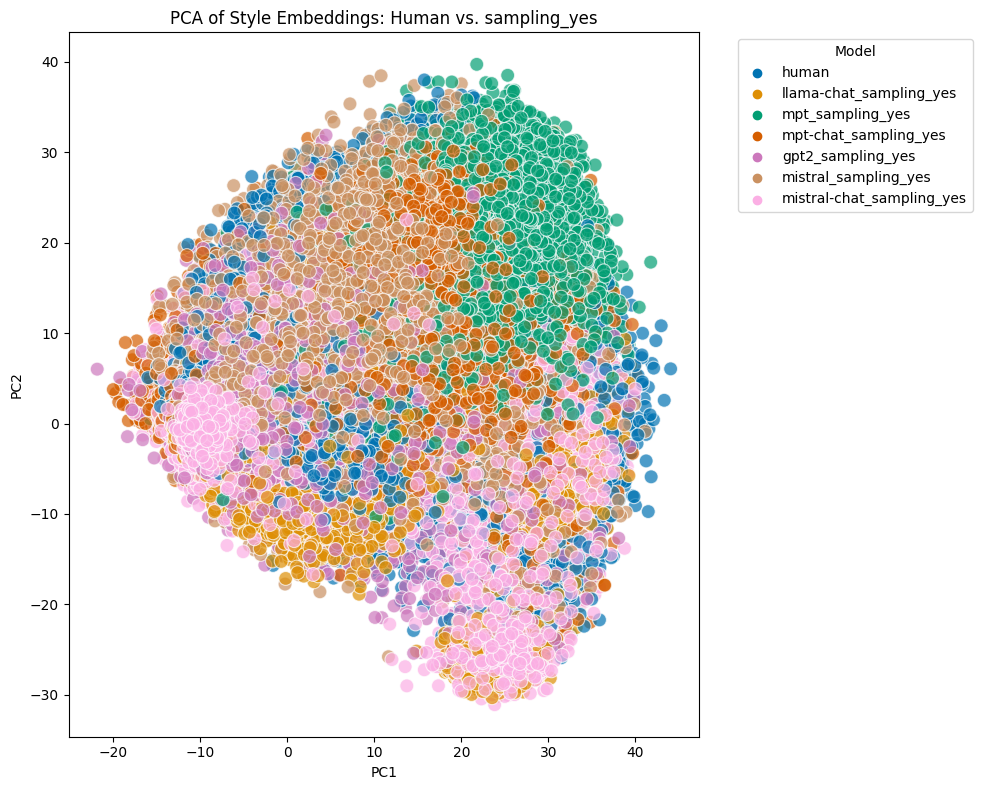

Saved plot for sampling_yes to results/raid_embeddings_sampling_yes.pdf


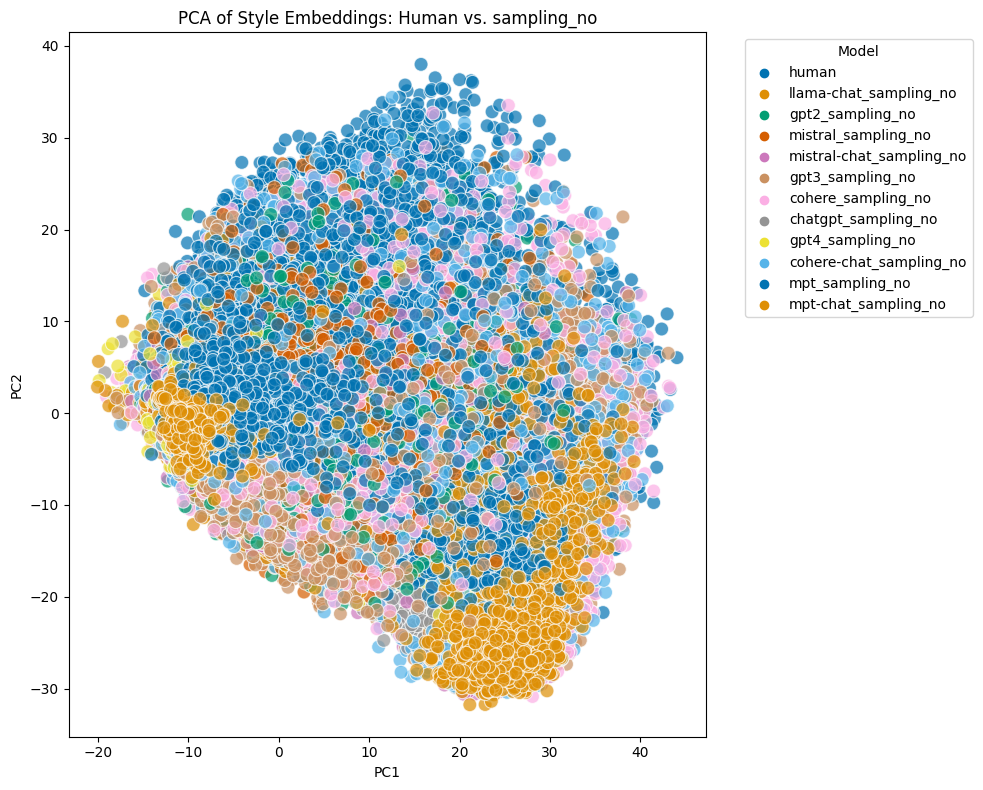

Saved plot for sampling_no to results/raid_embeddings_sampling_no.pdf


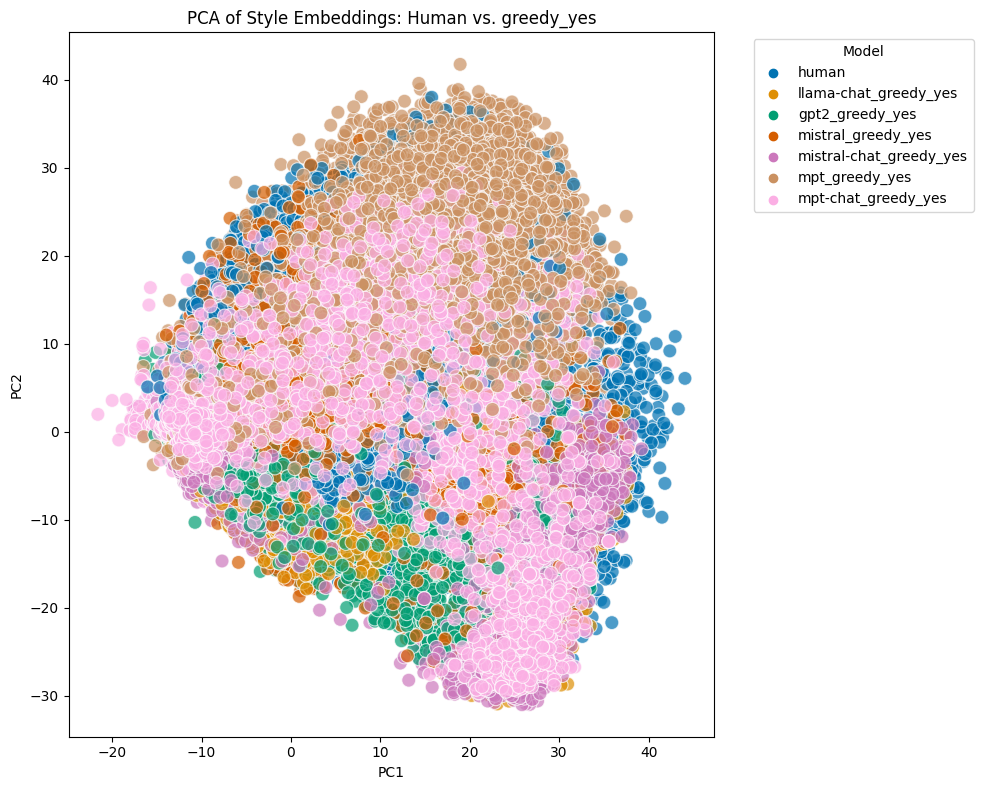

Saved plot for greedy_yes to results/raid_embeddings_greedy_yes.pdf


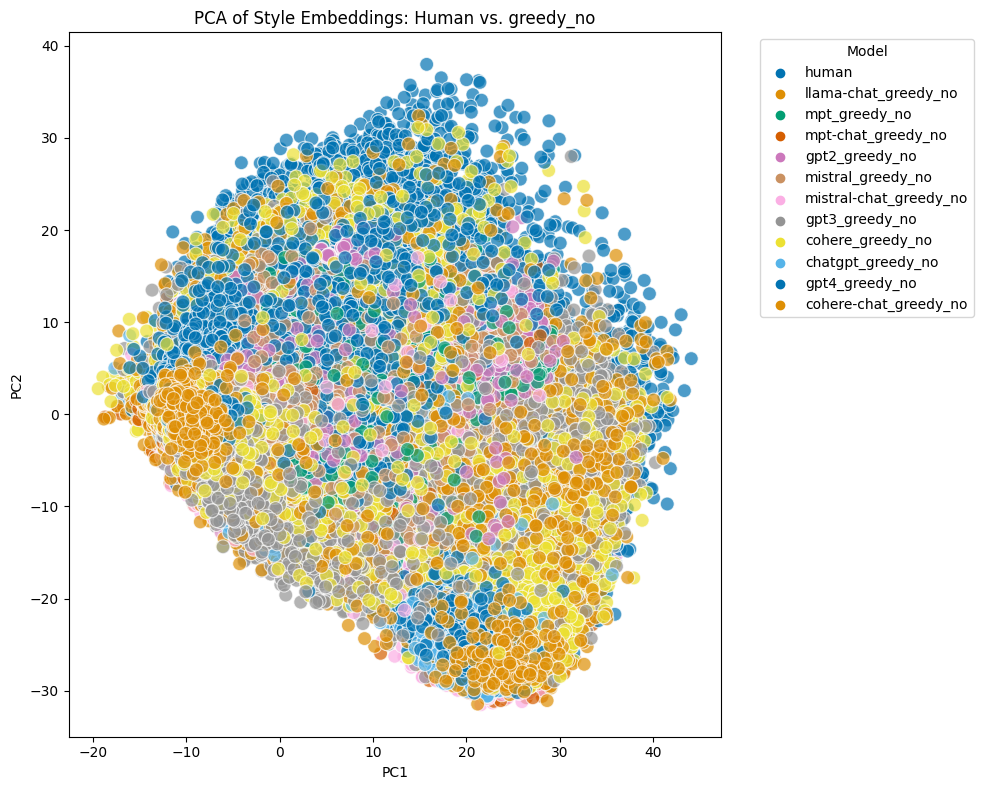

Saved plot for greedy_no to results/raid_embeddings_greedy_no.pdf

Results Table (ordered by centroid distance):
   model_category                      model  human_n  model_n  \
1    sampling_yes           mpt_sampling_yes    13371    13371   
21     greedy_yes             mpt_greedy_yes    13371    13371   
4    sampling_yes       mistral_sampling_yes    13371    13371   
31      greedy_no          chatgpt_greedy_no    13371    13371   
32      greedy_no             gpt4_greedy_no    13371    13371   
12    sampling_no        chatgpt_sampling_no    13371    13371   
20     greedy_yes    mistral-chat_greedy_yes    13371    13371   
13    sampling_no           gpt4_sampling_no    13371    13371   
28      greedy_no     mistral-chat_greedy_no    13371    13371   
25      greedy_no         mpt-chat_greedy_no    13371    13371   
9     sampling_no   mistral-chat_sampling_no    13371    13371   
16    sampling_no       mpt-chat_sampling_no    13371    13371   
23      greedy_no       llama

In [69]:
# ---------------------------
# Step 1: Compute PCA on Style Embeddings
# ---------------------------
# Convert list of embeddings into a 2D NumPy array.
X_emb = np.array(df["Style_Embedding"].tolist())
print(f"Embeddings shape: {X_emb.shape}")

# Standardize embeddings and apply PCA.
scaler = StandardScaler()
X_emb_scaled = scaler.fit_transform(X_emb)

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_emb_scaled)

# Add PCA components to the DataFrame.
df["PC1"] = X_pca[:, 0]
df["PC2"] = X_pca[:, 1]

# ---------------------------
# Step 2: Analyze Overlap per Model Category
# ---------------------------
desired_categories = ["sampling_yes", "sampling_no", "greedy_yes", "greedy_no"]
results_list = []

for category in desired_categories:
    # For a given category, compare all human texts with texts having that model_category.
    subset_df = df[(df["model"].str.lower() == "human") | (df["model_category"] == category)]
    if subset_df.empty:
        print(f"No data available for category: {category}")
        continue

    # Compute human group metrics.
    human_df = subset_df[subset_df["model"].str.lower() == "human"]
    if human_df.empty:
        print(f"No human data available for category: {category}")
        continue

    # Compute the human centroid in the 2D PCA space.
    human_centroid = np.array([human_df["PC1"].mean(), human_df["PC2"].mean()])
    # Compute the Euclidean distances from each human text to the human centroid.
    human_distances = np.sqrt((human_df["PC1"] - human_centroid[0])**2 + (human_df["PC2"] - human_centroid[1])**2)
    human_avg_distance = human_distances.mean()
    human_n = len(human_df)

    # Plot the PCA scatter for this category.
    plt.figure(figsize=(10, 8))
    sns.scatterplot(data=subset_df, x="PC1", y="PC2", hue="model", palette="colorblind", s=100, alpha=0.7)
    plt.title(f"PCA of Style Embeddings: Human vs. {category}")
    plt.xlabel("PC1")
    plt.ylabel("PC2")
    plt.legend(title="Model", bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plot_filename = os.path.join(result_dir, f"raid_embeddings_{category}.pdf")
    plt.savefig(plot_filename)
    plt.show()
    print(f"Saved plot for {category} to {plot_filename}")

    # Compute metrics for each non-human model in this category.
    non_human_models = subset_df.loc[subset_df["model"].str.lower() != "human", "model"].unique()
    for model_value in non_human_models:
        model_df = subset_df[subset_df["model"] == model_value]
        if model_df.empty:
            continue

        # Compute the model centroid in PCA space.
        model_centroid = np.array([model_df["PC1"].mean(), model_df["PC2"].mean()])
        # Compute the Euclidean distances from each point in the model group to its centroid.
        model_distances = np.sqrt((model_df["PC1"] - model_centroid[0])**2 + (model_df["PC2"] - model_centroid[1])**2)
        model_avg_distance = model_distances.mean()
        model_n = len(model_df)

        # Compute the Euclidean distance between the human centroid and this model's centroid.
        centroid_distance = np.linalg.norm(human_centroid - model_centroid)

        results_list.append({
            "model_category": category,
            "model": model_value,
            "human_n": human_n,
            "model_n": model_n,
            "human_avg_distance": human_avg_distance,
            "model_avg_distance": model_avg_distance,
            "centroid_distance": centroid_distance
        })

# Create and save the total results table.
results_df = pd.DataFrame(results_list)
results_df_sorted = results_df.sort_values(by="centroid_distance", ascending=False)
print("\nResults Table (ordered by centroid distance):")
print(results_df_sorted)
results_csv = os.path.join(result_dir, "model_vs_human_overlap_metrics.csv")
results_df_sorted.to_csv(results_csv, index=False)
print("Results table saved to", results_csv)

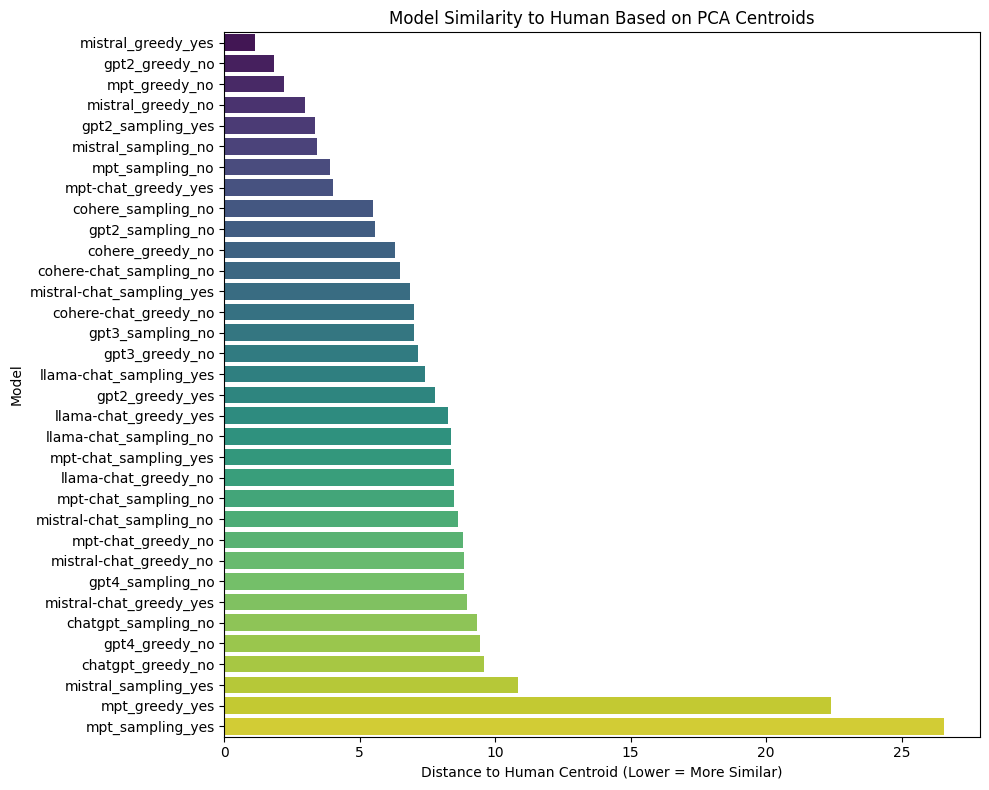

Saved model similarity plot: results/model_similarity_to_human_pca.pdf


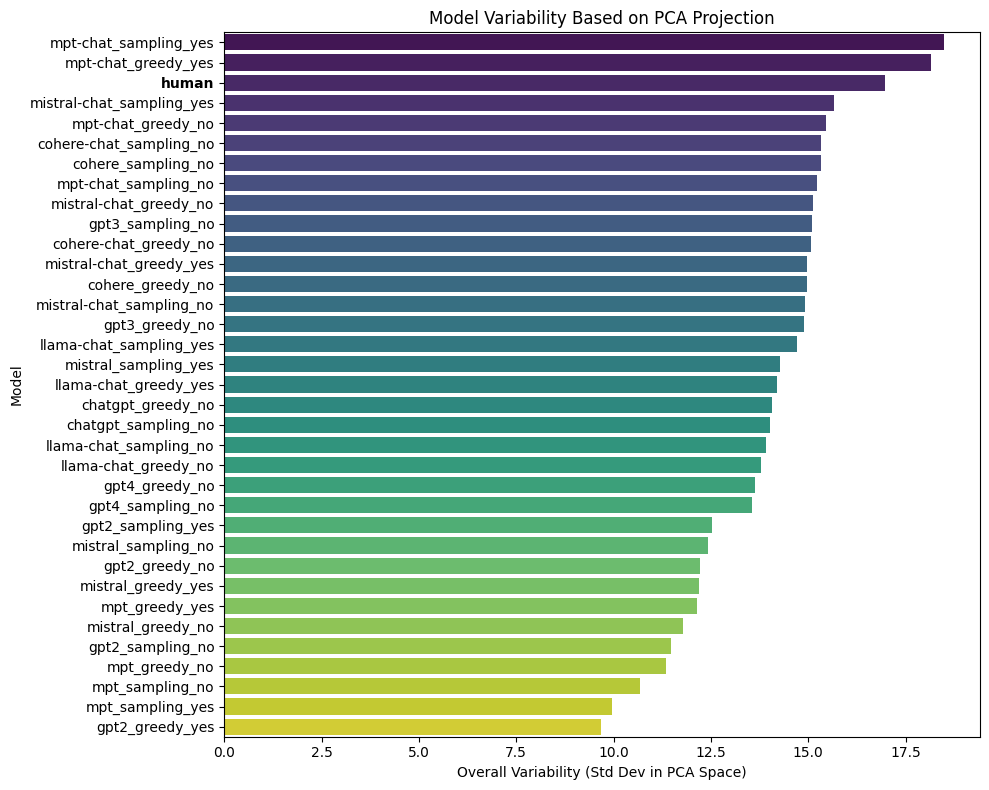

Saved model variability plot: results/style_model_variability_pca.pdf


In [70]:
model_centroids = df.groupby("model")[["PC1", "PC2"]].mean().reset_index()

# Find the human centroid (assuming the model is named 'human', case-insensitive)
human_row = model_centroids[model_centroids["model"].str.lower() == "human"]
if human_row.empty:
    print("No human model found in the data.")
else:
    human_centroid = human_row[["PC1", "PC2"]].iloc[0].values

    # Compute distance from each non-human model's centroid to the human centroid
    similarity_list = []
    for idx, row in model_centroids.iterrows():
        if row["model"].lower() == "human":
            continue  # Skip human
        model_name = row["model"]
        centroid = row[["PC1", "PC2"]].values
        distance = np.linalg.norm(centroid - human_centroid)
        similarity_list.append({"model": model_name, "Centroid_Distance_to_Human": distance})
    
    similarity_df = pd.DataFrame(similarity_list)
    # Sort models from most similar (lowest distance) to least similar (highest distance)
    similarity_df = similarity_df.sort_values(by="Centroid_Distance_to_Human", ascending=True)

    # Create a bar plot
    plt.figure(figsize=(10, 8))
    ax = sns.barplot(
        data=similarity_df,
        x="Centroid_Distance_to_Human",
        y="model",
        palette="viridis"
    )
    plt.xlabel("Distance to Human Centroid (Lower = More Similar)")
    plt.ylabel("Model")
    plt.title("Model Similarity to Human Based on PCA Centroids")
    plt.tight_layout()
    # Bold the label for 'human' in the y-axis
    for label in ax.get_yticklabels():
        if label.get_text().lower() == "human":
            label.set_fontweight("bold")
            label.set_color("black")
    # Save the plot
    similarity_plot_file = os.path.join(result_dir, "model_similarity_to_human_pca.pdf")
    plt.savefig(similarity_plot_file, dpi=300)
    plt.show()
    
    print(f"Saved model similarity plot: {similarity_plot_file}")
# ---------------------------
# Compute Model Variability (Spread in PCA Space)
# ---------------------------
# Compute standard deviation of PC1 and PC2 for each model
model_variability = df.groupby("model")[["PC1", "PC2"]].std().reset_index()

# Compute overall variability (Euclidean distance in PCA space)
model_variability["Overall_Variability"] = (model_variability["PC1"]**2 + model_variability["PC2"]**2)**0.5

# Sort by variability (highest to lowest)
model_variability = model_variability.sort_values(by="Overall_Variability", ascending=False)

# ---------------------------
# Plot Model Variability Bar Chart
# ---------------------------
plt.figure(figsize=(10, 8))
ax = sns.barplot(
    data=model_variability,
    y="model",
    x="Overall_Variability",
    palette="viridis"
)
plt.xlabel("Overall Variability (Std Dev in PCA Space)")
plt.ylabel("Model")
plt.title("Model Variability Based on PCA Projection")
plt.tight_layout()
# Bold the label for 'human' in the y-axis
for label in ax.get_yticklabels():
    if label.get_text().lower() == "human":
        label.set_fontweight("bold")
        label.set_color("black")
# Save plot
variability_plot_file = os.path.join(result_dir, "style_model_variability_pca.pdf")
plt.savefig(variability_plot_file, dpi=300)
plt.show()

print(f"Saved model variability plot: {variability_plot_file}")

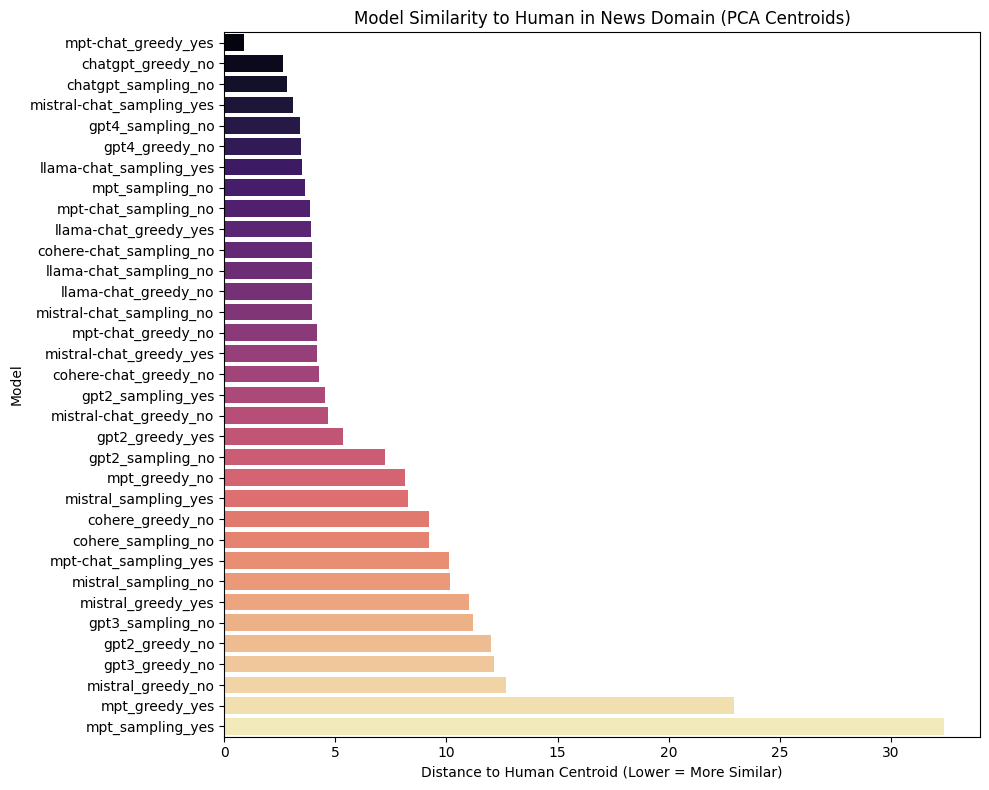

Saved news model similarity plot: results/news_model_similarity_to_human_pca.pdf


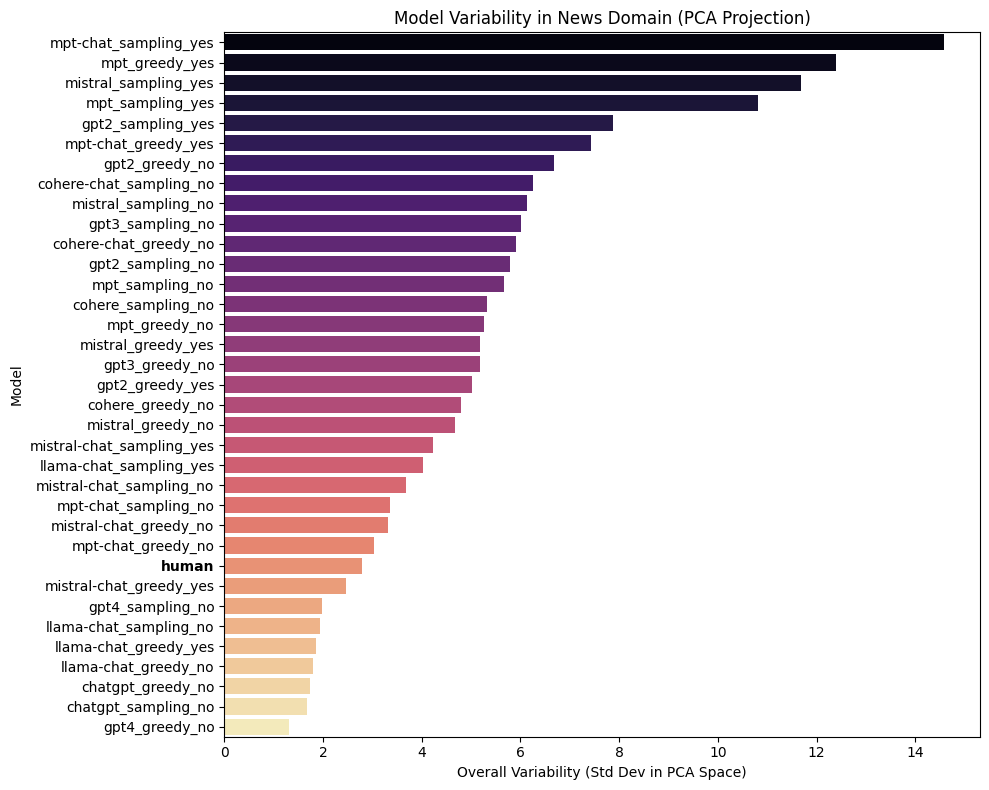

Saved news model variability plot: results/style_news_model_variability_pca.pdf


In [71]:
# Filter the DataFrame for the news domain (assuming 'domain' column exists)
news_df = df[df["domain"].str.lower() == "news"]

# --------------------------------------------
# Part 1: Model Similarity to Human (News Domain)
# --------------------------------------------

# Compute centroids for each model in PCA space within the news domain
news_model_centroids = news_df.groupby("model")[["PC1", "PC2"]].mean().reset_index()

# Find the human centroid (assuming the model is named 'human', case-insensitive)
human_row = news_model_centroids[news_model_centroids["model"].str.lower() == "human"]
if human_row.empty:
    print("No human model found in the news domain.")
else:
    human_centroid = human_row[["PC1", "PC2"]].iloc[0].values

    # Compute distance from each non-human model's centroid to the human centroid
    similarity_list = []
    for idx, row in news_model_centroids.iterrows():
        if row["model"].lower() == "human":
            continue  # Skip human
        model_name = row["model"]
        centroid = row[["PC1", "PC2"]].values
        distance = np.linalg.norm(centroid - human_centroid)
        similarity_list.append({"model": model_name, "Centroid_Distance_to_Human": distance})
    
    similarity_df = pd.DataFrame(similarity_list)
    # Sort models from most similar (lowest distance) to least similar (highest distance)
    similarity_df = similarity_df.sort_values(by="Centroid_Distance_to_Human", ascending=True)

    # Create a bar plot for model similarity in the news domain
    plt.figure(figsize=(10, 8))
    ax = sns.barplot(
        data=similarity_df,
        x="Centroid_Distance_to_Human",
        y="model",
        palette="magma"
    )
    plt.xlabel("Distance to Human Centroid (Lower = More Similar)")
    plt.ylabel("Model")
    plt.title("Model Similarity to Human in News Domain (PCA Centroids)")
    plt.tight_layout()
    # Bold the label for 'human' in the y-axis
    for label in ax.get_yticklabels():
        if label.get_text().lower() == "human":
            label.set_fontweight("bold")
            label.set_color("black")
    # Save the plot
    similarity_plot_file = os.path.join(result_dir, "news_model_similarity_to_human_pca.pdf")
    plt.savefig(similarity_plot_file, dpi=300)
    plt.show()
    
    print(f"Saved news model similarity plot: {similarity_plot_file}")

# --------------------------------------------
# Part 2: Model Variability (News Domain)
# --------------------------------------------

# Compute standard deviation of PC1 and PC2 for each model in the news domain
news_model_variability = news_df.groupby("model")[["PC1", "PC2"]].std().reset_index()

# Compute overall variability (Euclidean distance in PCA space)
news_model_variability["Overall_Variability"] = np.sqrt(news_model_variability["PC1"]**2 + news_model_variability["PC2"]**2)

# Sort by variability (highest to lowest)
news_model_variability = news_model_variability.sort_values(by="Overall_Variability", ascending=False)

# Create a bar plot for model variability in the news domain
plt.figure(figsize=(10, 8))
ax = sns.barplot(
    data=news_model_variability,
    x="Overall_Variability",
    y="model",
    palette="magma"
)
plt.xlabel("Overall Variability (Std Dev in PCA Space)")
plt.ylabel("Model")
plt.title("Model Variability in News Domain (PCA Projection)")
plt.tight_layout()
# Bold the label for 'human' in the y-axis
for label in ax.get_yticklabels():
    if label.get_text().lower() == "human":
        label.set_fontweight("bold")
        label.set_color("black")
# Save the plot
variability_plot_file = os.path.join(result_dir, "style_news_model_variability_pca.pdf")
plt.savefig(variability_plot_file, dpi=300)
plt.show()

print(f"Saved news model variability plot: {variability_plot_file}")

# Classifier

we train a classifier all text all domains to check if the text is written by humans or not

In [72]:
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer


# Create binary target: 1 if "human" is found in the "model" column (case-insensitive), else 0.
df["is_human"] = df["model"].str.lower().str.contains("human").astype(int)

# ---------------------------
# Downsample Non-Human Data to Balance with Human Data (Overall)
# ---------------------------
df_human = df[df["is_human"] == 1]
df_nonhuman = df[df["is_human"] == 0]

print("Number of human samples:", len(df_human))
print("Number of non-human samples:", len(df_nonhuman))

# Downsample non-human examples to match the number of human samples.
df_nonhuman_sampled = df_nonhuman.sample(n=len(df_human), random_state=42, replace=False)

# Combine and shuffle to create a balanced dataset.
df_balanced = pd.concat([df_human, df_nonhuman_sampled]).sample(frac=1, random_state=42).reset_index(drop=True)

# ---------------------------
# Build Feature Matrix: Expand Style Embeddings Only
# ---------------------------
# Convert the list of embeddings into a DataFrame.
embeddings = df_balanced["Style_Embedding"].tolist()  # List of lists
num_emb_dims = len(embeddings[0]) if embeddings and embeddings[0] is not None else 0
X_emb = pd.DataFrame(embeddings, columns=[f"emb_{i}" for i in range(num_emb_dims)])
# Print the size (dimensions) of the embeddings DataFrame.
print("Embeddings shape:", X_emb.shape)
print("Embedding dimension:", num_emb_dims)
y = df_balanced["is_human"]

# ---------------------------
# Train-Test Split
# ---------------------------
X_train, X_test, y_train, y_test = train_test_split(
    X_emb, y, test_size=0.2, random_state=42, stratify=y
)

# ---------------------------
# Build and Train a Logistic Regression Pipeline (Using only Style Embeddings)
# ---------------------------
numeric_features = X_emb.columns.tolist()

preprocessor = ColumnTransformer(
    transformers=[
        ("num", StandardScaler(), numeric_features)
    ]
)

pipeline = Pipeline([
    ("preprocessor", preprocessor),
    ("clf", LogisticRegression(random_state=42, max_iter=1000))
])

pipeline.fit(X_train, y_train)

# ---------------------------
# Evaluate the Classifier
# ---------------------------
y_pred = pipeline.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy: {:.2f}%".format(accuracy * 100))
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

Number of human samples: 13371
Number of non-human samples: 454614
Embeddings shape: (26742, 768)
Embedding dimension: 768
Accuracy: 96.60%

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.96      0.97      2675
           1       0.96      0.97      0.97      2674

    accuracy                           0.97      5349
   macro avg       0.97      0.97      0.97      5349
weighted avg       0.97      0.97      0.97      5349



In [73]:
# ---------------------------
# Filter for News Domain and Downsample
# ---------------------------
# Filter for rows where the domain is "news" (case-insensitive).
df_news = df[df["domain"].str.lower() == "news"].copy()

# Separate human and non-human groups.
df_news_human = df_news[df_news["is_human"] == 1]
df_news_nonhuman = df_news[df_news["is_human"] == 0]

print("Number of news human samples:", len(df_news_human))
print("Number of news non-human samples:", len(df_news_nonhuman))

# Downsample non-human examples to match human sample size (if needed).
if len(df_news_nonhuman) > len(df_news_human):
    df_news_nonhuman_sampled = df_news_nonhuman.sample(n=len(df_news_human), random_state=42, replace=False)
else:
    df_news_nonhuman_sampled = df_news_nonhuman

# Combine and shuffle to create a balanced dataset.
df_news_balanced = pd.concat([df_news_human, df_news_nonhuman_sampled]).sample(frac=1, random_state=42).reset_index(drop=True)

# ---------------------------
# Build Feature Matrix from Style Embeddings and Domain
# ---------------------------
# Expand the list of embeddings into a DataFrame.
embeddings = df_news_balanced["Style_Embedding"].tolist()  # list of lists
num_emb_dims = len(embeddings[0]) if embeddings and embeddings[0] is not None else 0
X_emb = pd.DataFrame(embeddings, columns=[f"emb_{i}" for i in range(num_emb_dims)])

# Include the domain column as a categorical feature.
X_domain = df_news_balanced[["domain"]].copy()

# Combine embedding features with domain.
X_full = pd.concat([X_emb, X_domain.reset_index(drop=True)], axis=1)
y = df_news_balanced["is_human"]

# ---------------------------
# Train-Test Split
# ---------------------------
X_train, X_test, y_train, y_test = train_test_split(
    X_full, y, test_size=0.2, random_state=42, stratify=y
)

# ---------------------------
# Build and Train a Logistic Regression Pipeline (Controlling for Domain)
# ---------------------------
numeric_features = [col for col in X_full.columns if col.startswith("emb_")]

preprocessor = ColumnTransformer(
    transformers=[
        ("num", StandardScaler(), numeric_features)]
        
)

pipeline = Pipeline([
    ("preprocessor", preprocessor),
    ("clf", LogisticRegression(random_state=42, max_iter=1000))
])

pipeline.fit(X_train, y_train)

# ---------------------------
# Evaluate the Classifier
# ---------------------------
y_pred = pipeline.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print("News Domain Classifier Accuracy: {:.2f}%".format(accuracy * 100))
print("\nClassification Report (News Domain):")
print(classification_report(y_test, y_pred))

Number of news human samples: 1780
Number of news non-human samples: 60520
News Domain Classifier Accuracy: 98.46%

Classification Report (News Domain):
              precision    recall  f1-score   support

           0       0.98      0.99      0.98       356
           1       0.99      0.98      0.98       356

    accuracy                           0.98       712
   macro avg       0.98      0.98      0.98       712
weighted avg       0.98      0.98      0.98       712



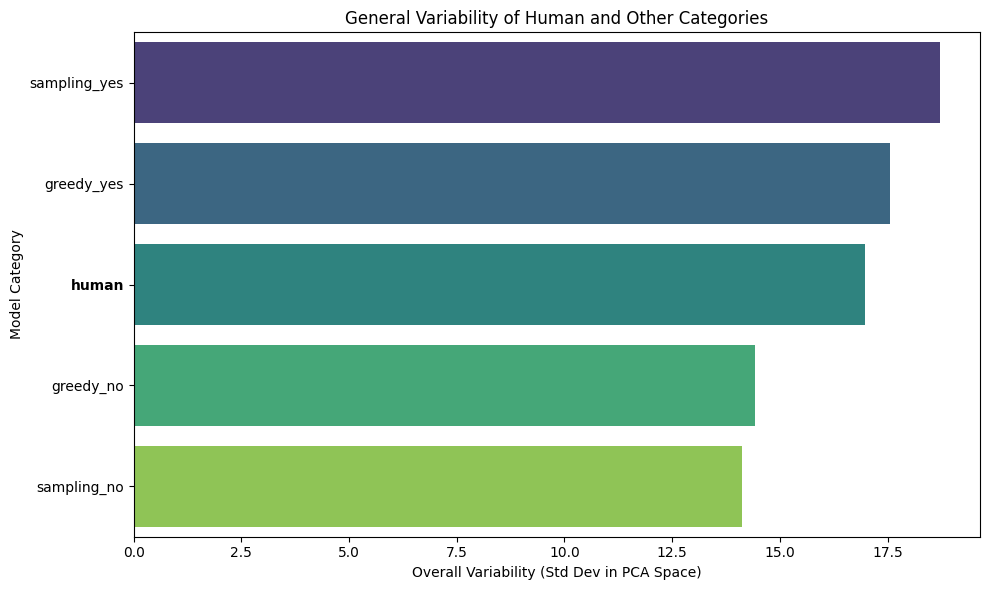

Saved variability plot: results/style_model_category_variability.pdf


In [74]:
# Compute the standard deviation of PC1 and PC2 for each model_category
category_variability = df.groupby("model_category")[["PC1", "PC2"]].std().reset_index()

# Compute overall variability as the Euclidean norm of the standard deviations.
category_variability["Overall_Variability"] = np.sqrt(category_variability["PC1"]**2 + category_variability["PC2"]**2)

# Sort by overall variability (most variable at the top)
category_variability = category_variability.sort_values(by="Overall_Variability", ascending=False)

# Plot the variability as a horizontal bar plot
plt.figure(figsize=(10, 6))
ax = sns.barplot(
    data=category_variability,
    x="Overall_Variability",
    y="model_category",
    palette="viridis"
)
plt.xlabel("Overall Variability (Std Dev in PCA Space)")
plt.ylabel("Model Category")
plt.title("General Variability of Human and Other Categories")
plt.tight_layout()
# Bold the label for 'human' in the y-axis
for label in ax.get_yticklabels():
    if label.get_text().lower() == "human":
        label.set_fontweight("bold")
        label.set_color("black")
# Save the plot (adjust result_dir as needed)
plot_file = os.path.join(result_dir, "style_model_category_variability.pdf")
plt.savefig(plot_file, format="pdf", dpi=300, bbox_inches="tight")
plt.show()

print(f"Saved variability plot: {plot_file}")

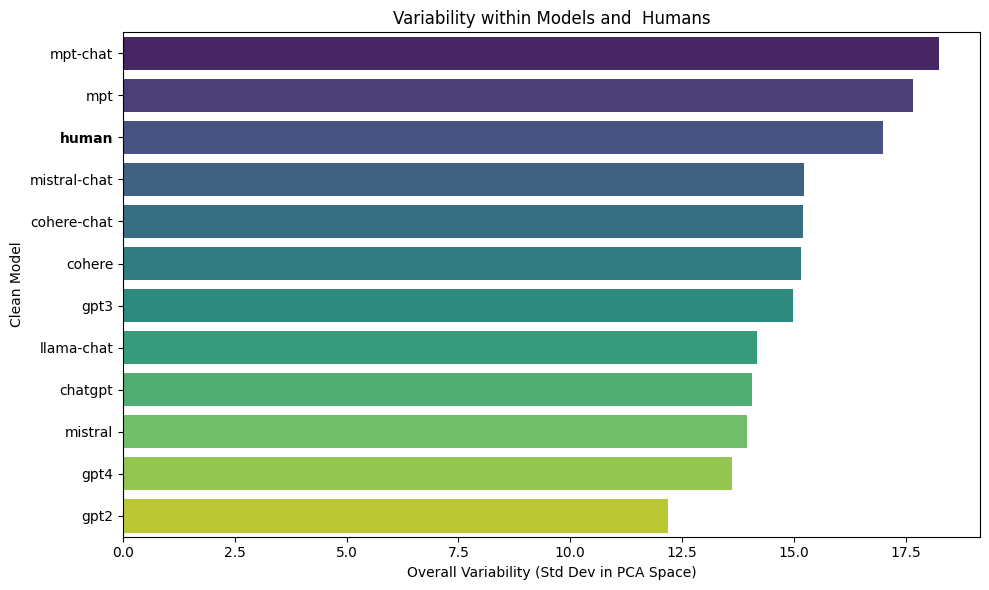

Saved variability plot: results/style_model_variability_clean_model.pdf


In [75]:
df["clean_model"] = df["model"].apply(clean_model_name)

# ---------------------------
# Compute Variability Within Each Model (and Human)
# ---------------------------
# Group by the cleaned model names and calculate the standard deviation for PC1 and PC2
model_variability = df.groupby("clean_model")[["PC1", "PC2"]].std().reset_index()

# Compute overall variability as the Euclidean norm of the standard deviations.
model_variability["Overall_Variability"] = np.sqrt(model_variability["PC1"]**2 + model_variability["PC2"]**2)

# Sort models by overall variability (from highest to lowest)
model_variability = model_variability.sort_values(by="Overall_Variability", ascending=False)

# ---------------------------
# Plot the Variability as a Horizontal Bar Plot
# ---------------------------
plt.figure(figsize=(10, 6))
ax = sns.barplot(
    data=model_variability,
    x="Overall_Variability",
    y="clean_model",
    palette="viridis"
)
plt.xlabel("Overall Variability (Std Dev in PCA Space)")
plt.ylabel("Clean Model")
plt.title("Variability within Models and  Humans")
plt.tight_layout()
# Bold the label for 'human' in the y-axis
for label in ax.get_yticklabels():
    if label.get_text().lower() == "human":
        label.set_fontweight("bold")
        label.set_color("black")
# Save the plot (adjust result_dir as needed)
variability_plot_file = os.path.join(result_dir, "style_model_variability_clean_model.pdf")
plt.savefig(variability_plot_file, format="pdf", dpi=300, bbox_inches="tight")
plt.show()

print(f"Saved variability plot: {variability_plot_file}")

In [81]:
# Dictionary with release dates (using only year or full date if available)
release_dates = {
    "llama-chat":    "2023-07-18",
    "mpt":           "2023-07-28",
    "mpt-chat":      "2023-07-28",
    "gpt2":          "2019-02-14",
    "mistral":       "2023-09-28",
    "mistral-chat":  "2023-09-28",
    "gpt3":          "2020-06-11",
    "cohere":        "2024-01-01",   # using 2024 as year only for Cohere
    "chatgpt":       "2022-11-30",
    "gpt4":          "2023-03-14",
    "cohere-chat":   "2024-01-01"    # using 2024 as well
}

# Map release date to each model based on its clean name.
# For "human", we will assign NaN.
model_variability["release_date_str"] = model_variability["clean_model"].map(lambda x: release_dates.get(x.lower(), None) if x.lower() != "human" else None)
# Convert to datetime; errors='coerce' will convert None to NaT.
model_variability["release_date"] = pd.to_datetime(model_variability["release_date_str"], errors='coerce')

# Separate out human variability for reference
human_row = model_variability[model_variability["clean_model"].str.lower() == "human"]
human_variability = None
if not human_row.empty:
    human_variability = human_row["Overall_Variability"].iloc[0]

# We'll plot non-human models (those with a valid release_date)
nonhuman_data = model_variability[model_variability["release_date"].notna()]

# Create scatter plot: x = release_date, y = Overall_Variability, with model names annotated.
plt.figure(figsize=(12, 6))
sns.scatterplot(data=nonhuman_data, x="release_date", y="Overall_Variability", hue="clean_model", s=100, legend=False)

# Annotate points with model names.
for idx, row in nonhuman_data.iterrows():
    plt.text(row["release_date"], row["Overall_Variability"] + 0.01, row["clean_model"], fontsize=9)

# If human variability is available, add a horizontal dashed red line.
if human_variability is not None:
    plt.axhline(y=human_variability, color='red', linestyle='--', label='Human Variability')
    plt.legend()

plt.xlabel("Release Date")
plt.ylabel("Overall Variability (Std Dev in PCA Space)")
#plt.title("Model Variability vs. Release Date")
plt.tight_layout()

# Save the plot (adjust result_dir as needed)
plot_file = os.path.join(result_dir, "style_model_variability_vs_release_date.pdf")
plt.savefig(plot_file, format="pdf", dpi=300, bbox_inches="tight")
plt.show()

print(f"Saved plot: {plot_file}")

KeyError: 'clean_model'

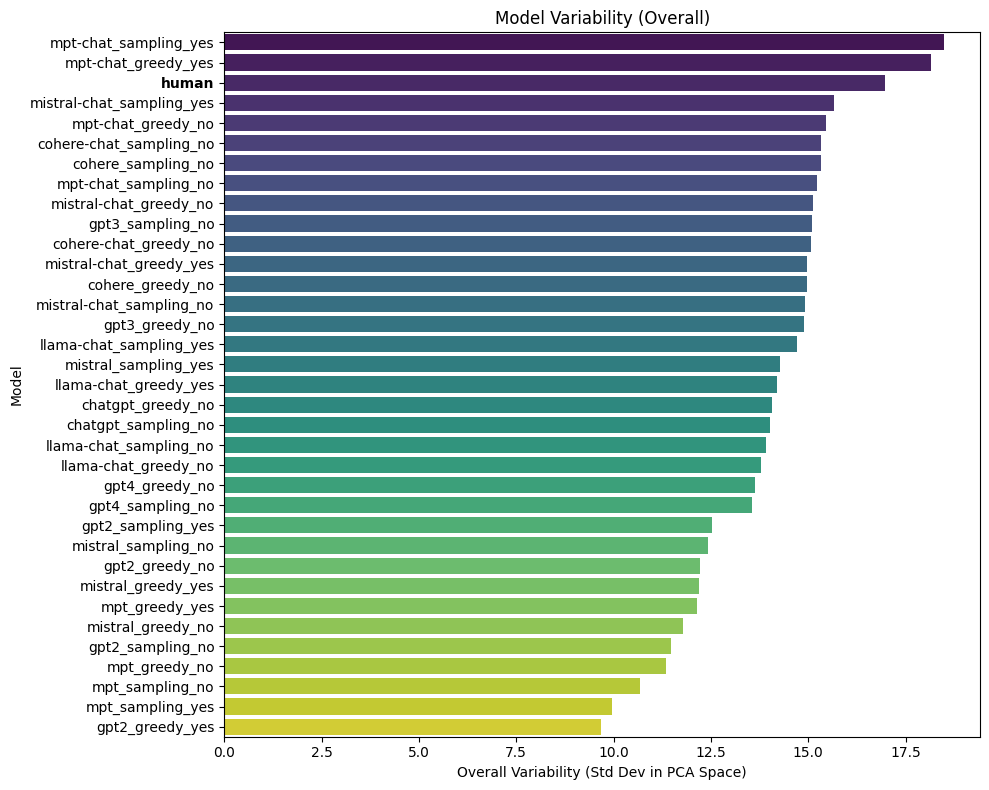

Saved plot: results/style_model_variability_overall.pdf


In [77]:
# Compute standard deviation of PC1 and PC2 for each model (Overall Variability)
model_variability = df.groupby("model")[["PC1", "PC2"]].std().reset_index()

# Compute overall variability (Euclidean distance in PCA space)
model_variability["Overall_Variability"] = (model_variability["PC1"]**2 + model_variability["PC2"]**2)**0.5

# Sort by overall variability (highest to lowest)
model_variability = model_variability.sort_values(by="Overall_Variability", ascending=False)

# Plot overall variability per model
plt.figure(figsize=(10, 8))
ax = sns.barplot(
    data=model_variability,
    y="model",
    x="Overall_Variability",
    palette="viridis"
)
plt.xlabel("Overall Variability (Std Dev in PCA Space)")
plt.ylabel("Model")
plt.title("Model Variability (Overall)")
plt.tight_layout()
# Bold the label for 'human' in the y-axis
for label in ax.get_yticklabels():
    if label.get_text().lower() == "human":
        label.set_fontweight("bold")
        label.set_color("black")
# Save plot
overall_var_file = os.path.join(result_dir, "style_model_variability_overall.pdf")
plt.savefig(overall_var_file, format="pdf", dpi=300, bbox_inches="tight")
plt.show()
print(f"Saved plot: {overall_var_file}")

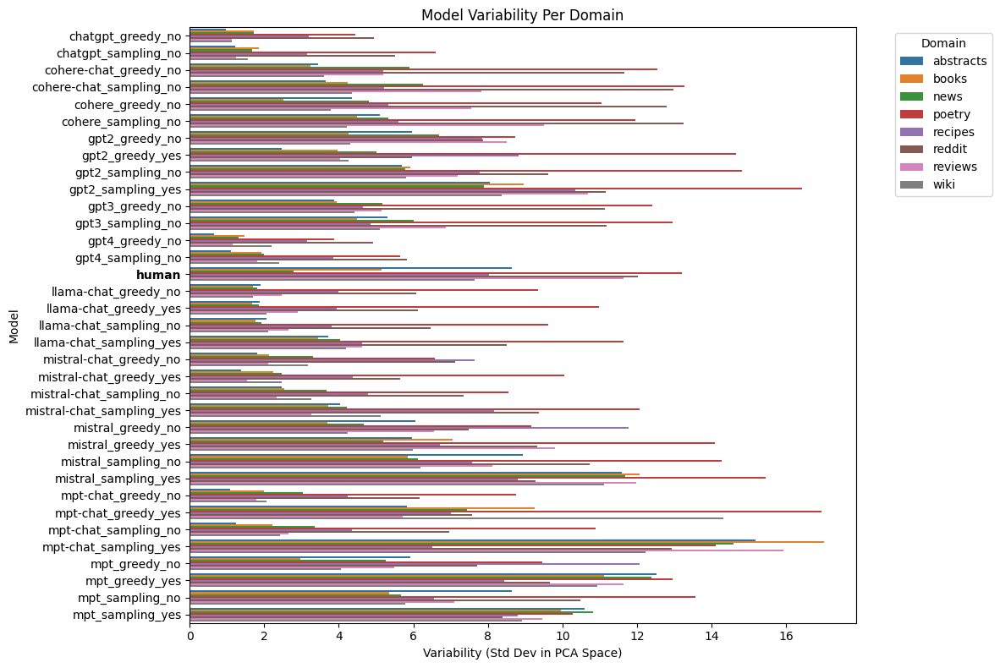

Saved plot: results/style_model_variability_per_domain.pdf


In [78]:
# Compute standard deviation of PC1 and PC2 per model per domain
model_domain_variability = df.groupby(["model", "domain"])[["PC1", "PC2"]].std().reset_index()

# Compute overall variability (Euclidean distance in PCA space)
model_domain_variability["Overall_Variability"] = (model_domain_variability["PC1"]**2 + model_domain_variability["PC2"]**2)**0.5

# Plot variability per model per domain (Grouped Bar Plot)
plt.figure(figsize=(12, 8))
ax = sns.barplot(
    data=model_domain_variability,
    x="Overall_Variability",
    y="model",
    hue="domain",  # Group by domain
    palette="tab10"
)

plt.xlabel("Variability (Std Dev in PCA Space)")
plt.ylabel("Model")
plt.title("Model Variability Per Domain")
plt.legend(title="Domain", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
# Bold the label for 'human' in the y-axis
for label in ax.get_yticklabels():
    if label.get_text().lower() == "human":
        label.set_fontweight("bold")
        label.set_color("black")
# Save plot
domain_var_file = os.path.join(result_dir, "style_model_variability_per_domain.pdf")
plt.savefig(domain_var_file, format="pdf", dpi=300, bbox_inches="tight")
plt.show()
print(f"Saved plot: {domain_var_file}")

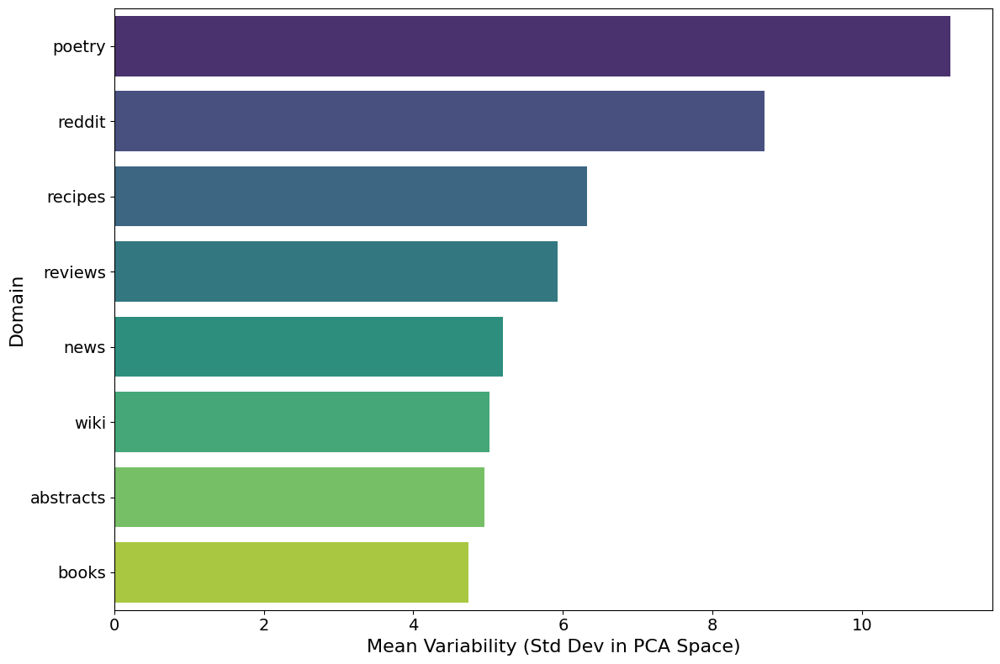

Saved plot: results/style_domain_variability.pdf


In [83]:
# Aggregate overall variability per domain (using the mean)
domain_variability = model_domain_variability.groupby("domain")["Overall_Variability"].mean().reset_index()

# Sort domains by variability (from highest to lowest)
domain_variability = domain_variability.sort_values(by="Overall_Variability", ascending=False)

# Increase figure size for better readability
plt.figure(figsize=(12, 8))

# Create bar plot
ax = sns.barplot(
    data=domain_variability,
    x="Overall_Variability",
    y="domain",
    palette="viridis"
)

# Increase font sizes for readability
plt.xlabel("Mean Variability", fontsize=16)
plt.ylabel("Domain", fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

# Remove title for cleaner look
plt.tight_layout()

# Save the plot
domain_var_file = os.path.join(result_dir, "style_domain_variability.pdf")
plt.savefig(domain_var_file, format="pdf", dpi=300, bbox_inches="tight")
plt.show()

print(f"Saved plot: {domain_var_file}")